# Load Libraries and Resources

In [1]:
library('readr')
library('blabr')
library('plyr')
library('dplyr')
library('ggplot2')
library('rjson')
library('parallel')
library("readxl")
library('dotwhisker')
source('PLEARN_analysis_helper.R')
source('texvars.R')
library('broom')
library('lme4')
library('tuneR')
library('ggExtra')
library('brms')
library('ggstance')


Attaching package: ‘dplyr’


The following objects are masked from ‘package:plyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: Matrix

Loading required package: Rcpp

Loading 'brms' package (version 2.11.1). Useful instructions
can be found by typing help('brms'). A more detailed introduction
to the package is available through vignette('brms_overview').


Attaching package: ‘brms’


The following object is masked from ‘package:lme4’:

    ngrps



Attaching package: ‘ggstance’


The following objects are masked from ‘package:ggplot2’:

    geom_errorbarh, GeomErrorbarh




In [2]:
item_properties = read.csv('../PLEARN_experiments/csv/plearn_receptiveTask_datasource.csv')
item_properties$AudioTarget = sapply(item_properties$AudioTarget, trimws)
length(unique(item_properties$AudioTarget))
item_properties$AudioTarget[duplicated(item_properties$AudioTarget)] #64 test items + 4 practice

[1] 68

[1] "65.wav" "71.wav" "66.wav" "72.wav"

In [3]:
# Get audio timings for the agrrement version in lookit
glob = "../PLEARN_experiments/stimuli/raw_audio_agreement2/s1-s72.cut"
json_paths = Sys.glob(glob)
audio_timings = data.frame(do.call('rbind', lapply(json_paths, function(path){
    as.data.frame(do.call('rbind', fromJSON(file = path)))
})))
for (colname in names(audio_timings)){ 
	    audio_timings[[colname]] = unlist(audio_timings[[colname]])
}
time_cols = setdiff(names(audio_timings), 'filename') 
for (colname in time_cols){ 
	    audio_timings[[colname]] = strptime(audio_timings[[colname]], format="%M:%OS")
}
# 2000 blank, 2500 with items onscreen, ~1100 with audio til is/are 
audio_timings$disambig_time = 2000+2500+(1000*(audio_timings$begin_disambig_region - audio_timings$start_time))

In [4]:
names(audio_timings)

[1] "start_time"             "stop_time"              "target_noun_start_time"
[4] "begin_disambig_region"  "target_noun_end_time"   "filename"              
[7] "disambig_time"

In [5]:
audio_timings$disambig_time 

Time differences in secs
 [1] 5690 5893 5760 5684 5858 5545 5643 5661 5748 5568 5463 5690 5713 5862 5684
[16] 5849 5629 5778 5731 5685 5618 5698 5539 5574 5449 5830 5783 5896 5716 5554
[31] 5594 5760 5443 5672 5441 5888 5344 5534 5460 5429 5373 5623 5742 5893 5513
[46] 5855 5499 5905 5559 5568 5661 5501 5287 5475 5501 5623 5504 5537 5400 5542
[61] 5652 5626 5679 5568 5585 5484 5374 5426 5774 5745 5571 5838

# Process Gaze Data from Lookit

In [36]:
source('PLEARN_analysis_helper.R')

In [ ]:
# should be able to use excel as the controller for which ones to load

[1] "/home/stephan/dropbox/Documents/MIT/research/PLEARN/lookit_data/c55ba08f-225c-4631-b4f8-cf447fb54c61/processed/cb_c55ba08f-225c-4631-b4f8-cf447fb54c61.csv"
[1] "processing /home/stephan/dropbox/Documents/MIT/research/PLEARN/lookit_data/c55ba08f-225c-4631-b4f8-cf447fb54c61/processed/cb_c55ba08f-225c-4631-b4f8-cf447fb54c61.csv..."
[1] "18810  frame labels before filtering"
[1] "15107  after filtering"
[1] "Assigned expt_index values"
[1] "Correct number of trials in the original data"
[1] "Number of items in item_properties:"
[1] 36
[1] "before merging with item properties 15107"
[1] "before merging with audio timings 15107"
[1] "after merging with audio timings 15107"
[1] "Correct number of trials in merging with audio timings"
[1] "Missing after filtering"
[1] "Correct number of trials after filter procedure"
[1] "Correct number of trials after augmentation"


`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



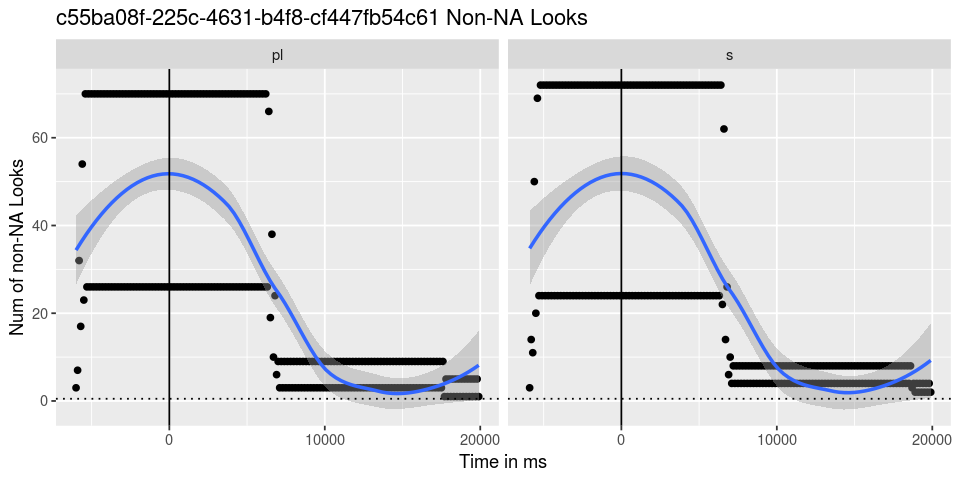

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



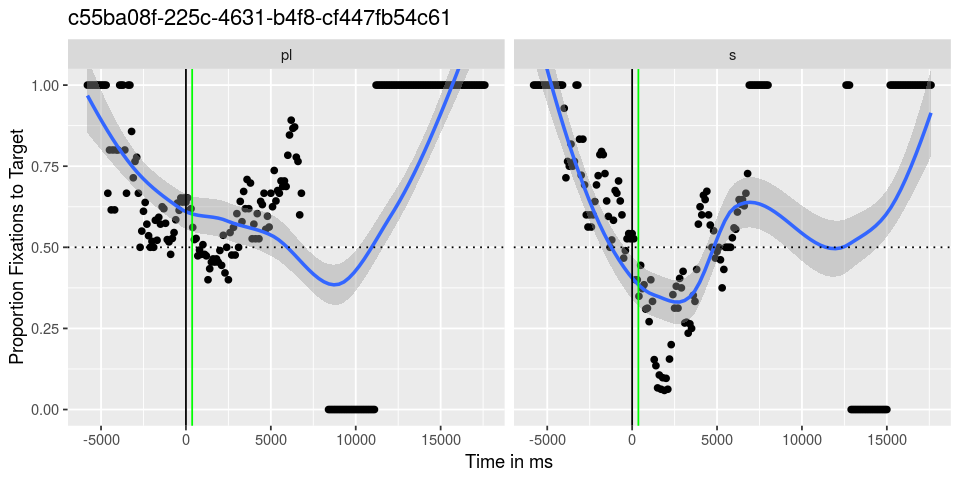

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



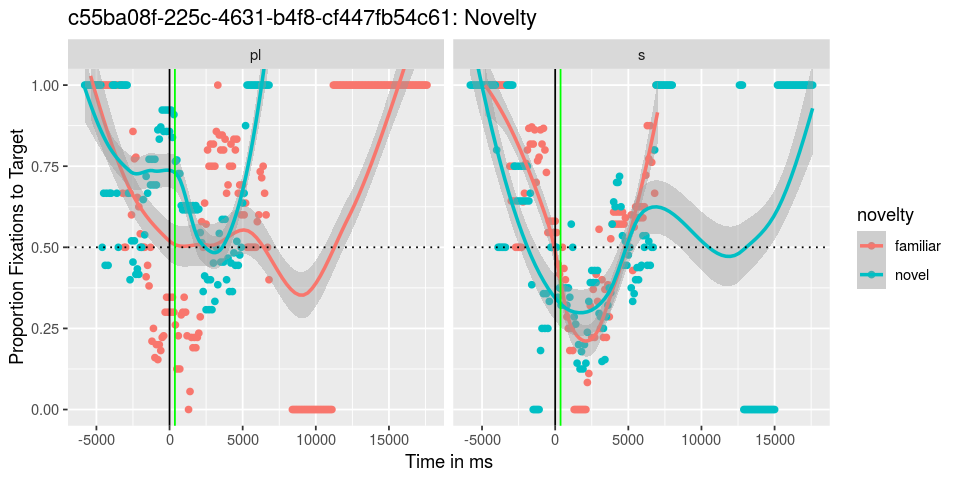

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



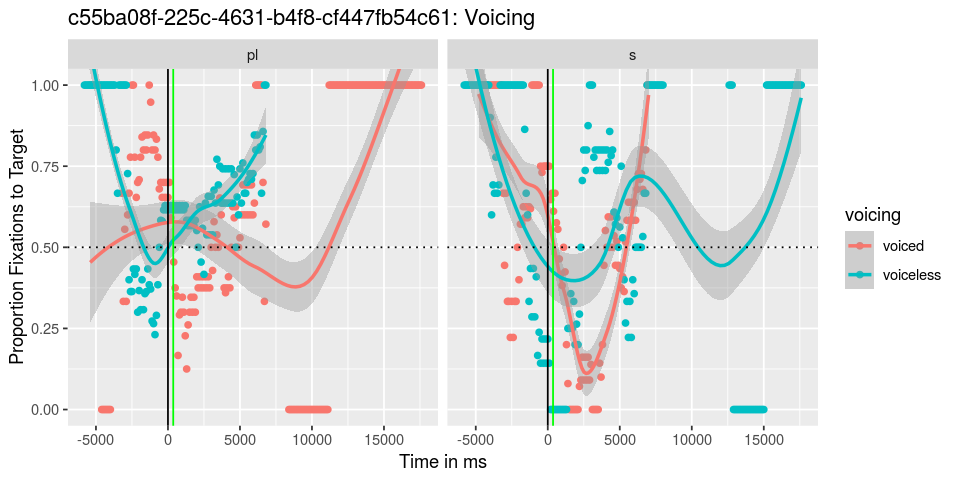

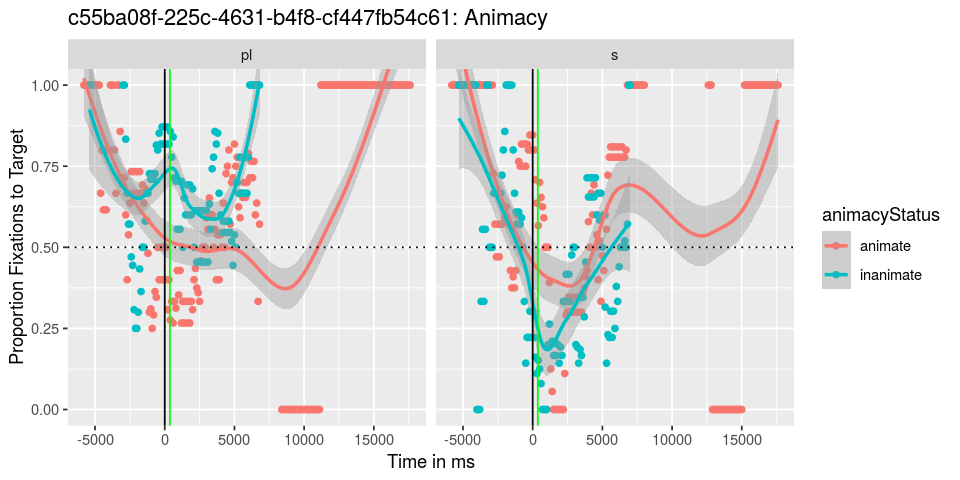

In [195]:
source('PLEARN_analysis_helper.R')
gc = analyzeLookItParticipant(
    result_dir = '/home/stephan/dropbox/Documents/MIT/research/PLEARN/lookit_data/',
    session_id = 'c55ba08f-225c-4631-b4f8-cf447fb54c61',
    annotator_id = 'cb',
    item_properties,
    audio_timings,
    target_order = 1,
    participant_type = 'child',
    plot = T
)

# Process Many participants

In [208]:
source('PLEARN_analysis_helper.R')
participants = list(
    c('1e8ae9b0-6b68-4636-a983-4e53b2522fce', 'cb'),
    c('1e04539d-c09d-4f71-96a4-5e01bb073d67', 'cb'),
    c('7dc30b41-8f08-466d-b342-7da585ba84eb', 'scm'),
    c('9a9fe8f1-c7ba-4d57-baef-2c8fb7a79035', 'scm'),
    c('9cbb4790-a33d-471a-831f-20d4bad97550', 'scm'),
    c('019e5595-bffa-4ab1-935c-a501119f1380', 'cb'),
    c('983f28e8-40ac-4226-9968-47562ab5c8de', 'cb'),
    c('91fe4cd9-4225-4866-8766-da0bd1bb3f0c', 'cb'),    
    c('c55ba08f-225c-4631-b4f8-cf447fb54c61', 'cb')
)    

# # waiting for dropbox

#ed = lapply(participants, function(participant){
ed = mclapply(participants, function(participant){
        return(analyzeLookItParticipant(
            '/home/stephan/dropbox/Documents/MIT/research/PLEARN/lookit_data/', 
            participant[1], 
            participant[2],
            item_properties,
            audio_timings, 
            halt_on_missing=F,
            target_order = 1,
            participant_type = 'child',
            plot=F,
            legacy = participant %in% c('jonahpilotlegacy')))
#    })
}, mc.cores=24)
ed_df = do.call('rbind.fill', ed)

In [216]:
child_ages = read.csv('csv/child_ages.csv')[,c('session_id', 'Age.in.Days')]
child_ages$age_in_months = round((child_ages$Age.in.Days / 30.5), 1) 
child_ages

session_id,Age.in.Days,age_in_months
<fct>,<int>,<dbl>
,776,25.4
47b41e86-dc92-4042-942c-a1aca67cee7b,998,32.7
,764,25.0
9cbb4790-a33d-471a-831f-20d4bad97550,709,23.2
7dc30b41-8f08-466d-b342-7da585ba84eb,805,26.4
9a9fe8f1-c7ba-4d57-baef-2c8fb7a79035,776,25.4
716a0365-9e98-4e3d-8751-026f568a5614,825,27.0
983f28e8-40ac-4226-9968-47562ab5c8de,821,26.9
,896,29.4


In [217]:
ed_df = merge(ed_df, child_ages[,c('session_id','age_in_months')])

In [218]:
ed_df$short_name = paste0(ed_df$session_id, ' (',ed_df$age_in_months,')')

In [219]:
names(item_properties)

[1] "s_form"             "novel_id"           "background_context"
 [4] "vowel_carrier"      "full_carrier"       "s_carrier"         
 [7] "s_punct"            "s_wav_index"        "s_sentence"        
[10] "pl_form"            "pl_carrier"         "pl_punct"          
[13] "pl_wav_index"       "pl_sentence"        "novelty"           
[16] "voicing"            "simple_pl_stim"     "simple_s_stim"     
[19] "animacyStatus"      "Trial"              "target"            
[22] "Practice"           "test_index"         "TargetSide"        
[25] "trial_index"        "NovelColor"         "order"             
[28] "expt_index"         "TargetLoc"          "DistractorLoc"     
[31] "AudioTarget"        "TargetImage"        "DistractorImage"

In [220]:
names(ed_df)

[1] "session_id"                      "expt_index"                     
 [3] "AudioTarget"                     "ms"                             
 [5] "original_frame_index"            "frame_index"                    
 [7] "label"                           "type"                           
 [9] "trial"                           "start_time_ms"                  
[11] "normalized_ms"                   "frame_id"                       
[13] "seconds_recording_before_stim"   "order.x"                        
[15] "test_or_practice"                "normal_or_calibration"          
[17] "s_form"                          "novel_id"                       
[19] "background_context"              "vowel_carrier"                  
[21] "full_carrier"                    "s_carrier"                      
[23] "s_punct"                         "s_wav_index"                    
[25] "s_sentence"                      "pl_form"                        
[27] "pl_carrier"                      "pl_punct"                       
[29] "pl_wav_index"                    "pl_sentence"                    
[31] "novelty"                         "voicing"                        
[33] "simple_pl_stim"                  "simple_s_stim"                  
[35] "animacyStatus"                   "Trial"                          
[37] "target"                          "Practice"                       
[39] "test_index"                      "TargetSide"                     
[41] "trial_index"                     "NovelColor"                     
[43] "order.y"                         "TargetLoc"                      
[45] "DistractorLoc"                   "TargetImage"                    
[47] "DistractorImage"                 "disambig_time"                  
[49] "filename"                        "CURRENT_FIX_INTEREST_AREA_LABEL"
[51] "Time"                            "looks_to_t"                     
[53] "looks_to_d"                      "looks_to_td"                    
[55] "exclude_trial"                   "exclude_subject"                
[57] "TRIAL_INDEX"                     "timeBin"                        
[59] "Nonset"                          "label_at_onset"                 
[61] "time_to_last_nonna"              "track_loss_at_0"                
[63] "TimeBin"                         "cfial_bin"                      
[65] "animacystatus"                   "index"                          
[67] "age_in_months"                   "short_name"

In [221]:
unique(ed_df$session_id)

[1] "019e5595-bffa-4ab1-935c-a501119f1380"
[2] "1e04539d-c09d-4f71-96a4-5e01bb073d67"
[3] "1e8ae9b0-6b68-4636-a983-4e53b2522fce"
[4] "7dc30b41-8f08-466d-b342-7da585ba84eb"
[5] "91fe4cd9-4225-4866-8766-da0bd1bb3f0c"
[6] "983f28e8-40ac-4226-9968-47562ab5c8de"
[7] "9a9fe8f1-c7ba-4d57-baef-2c8fb7a79035"
[8] "9cbb4790-a33d-471a-831f-20d4bad97550"
[9] "c55ba08f-225c-4631-b4f8-cf447fb54c61"

In [223]:
write.csv(ed_df, 'csv/lookit_ed_df.csv',row.names=F)

In [224]:
length(unique(subset(ed_df, session_id == '019e5595-bffa-4ab1-935c-a501119f1380')$frame_id))

[1] 32

In [225]:
num_samples = aggregate(frame_id ~ timeBin + short_name + CURRENT_FIX_INTEREST_AREA_LABEL, ed_df
, function(x){length(unique(x))})
names(num_samples)[4] = 'num_trials'

In [226]:
#audio_timings$begin_disambig_region - audio_timings$start_time

avg_duration = -1* floor(1000 * mean(audio_timings$begin_disambig_region - audio_timings$start_time))

In [227]:
range(audio_timings$begin_disambig_region - audio_timings$start_time)

Time differences in secs
[1] 0.7869999 1.4050000

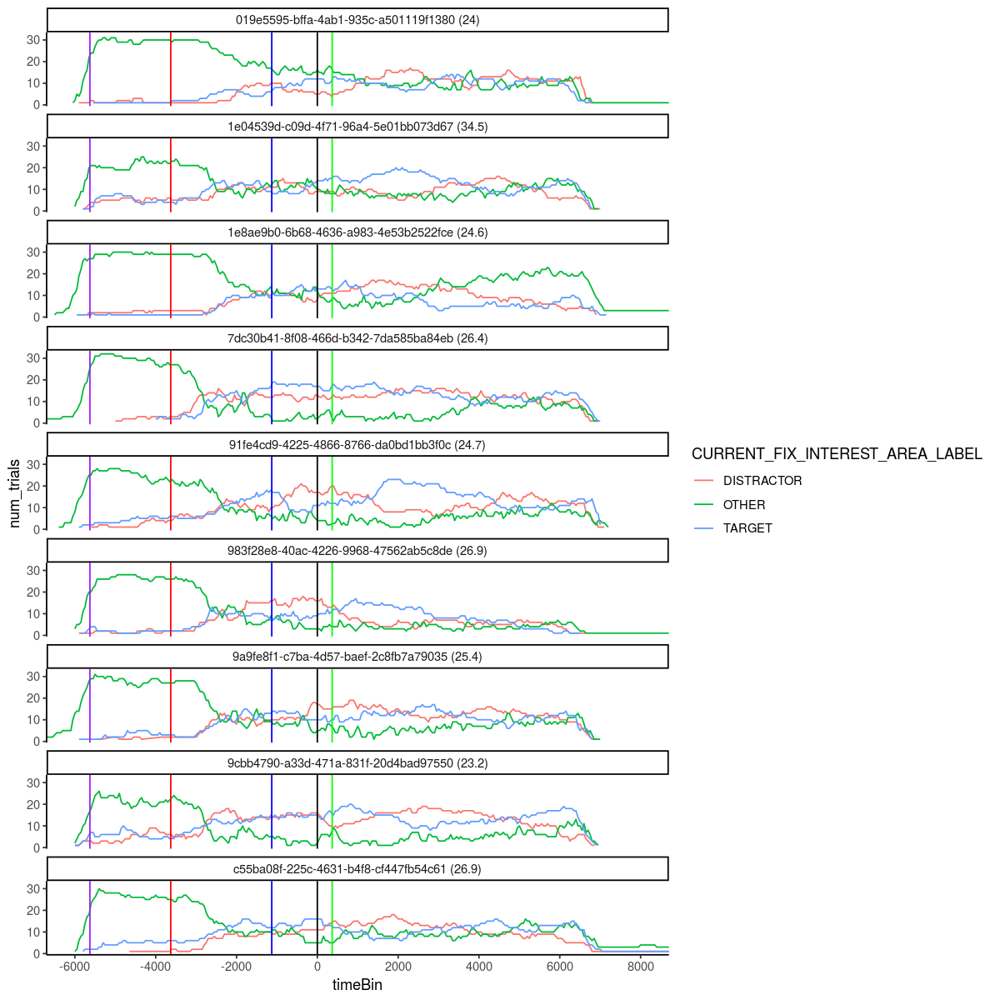

In [228]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(num_samples) + geom_line(aes(x=timeBin, y=num_trials, 
    color=CURRENT_FIX_INTEREST_AREA_LABEL)) + facet_wrap(~short_name, ncol=1
    ) + theme_classic(
) + geom_vline(xintercept=0) + coord_cartesian(xlim=c(-6000,8000)
) + scale_x_continuous(breaks = seq(from=-6000,to=8000,by=2000)
) + geom_vline(xintercept=avg_duration, color='blue'
) + geom_vline(xintercept=367, color='green'
) + geom_vline(xintercept=avg_duration-2500, color='red'
) + geom_vline(xintercept=avg_duration-4500, color='purple')

In [125]:
num_samples_per_child = aggregate(frame_id ~ timeBin + session_id, ed_df, length)
names(num_samples_per_child)[3] = 'num_trials'

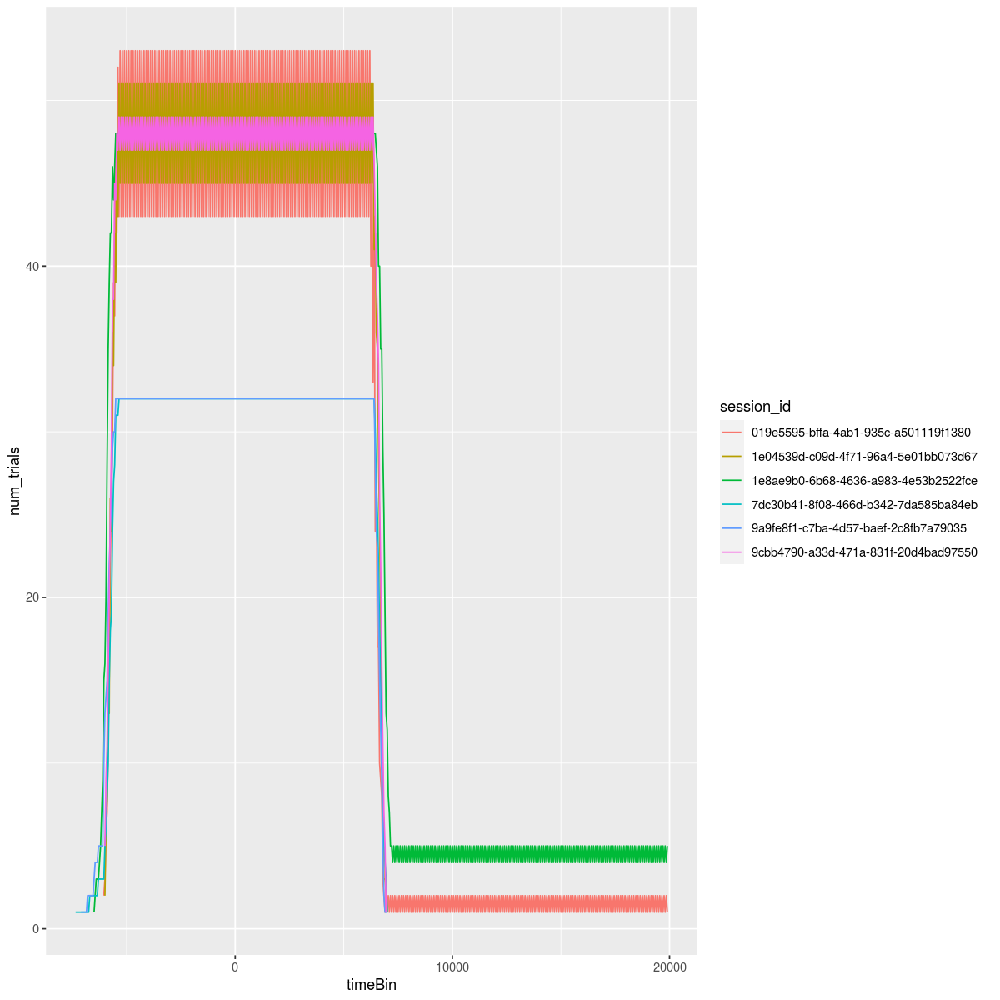

In [126]:
ggplot(num_samples_per_child) + geom_line(aes(x=timeBin, y=num_trials, 
    color=session_id))

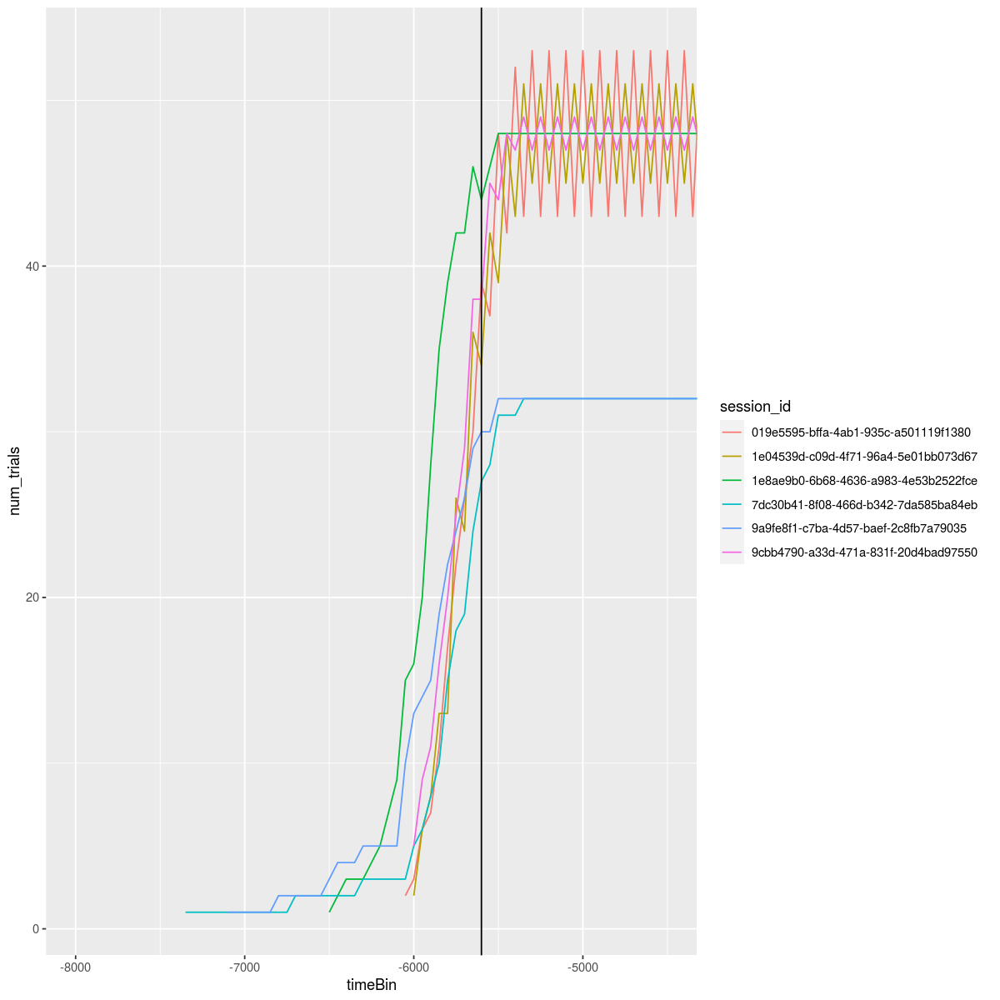

In [127]:
ggplot(num_samples_per_child) + geom_line(aes(x=timeBin, y=num_trials, 
    color=session_id)) + coord_cartesian(xlim=c(-8000, -4500)
) + geom_vline(xintercept = -5600)

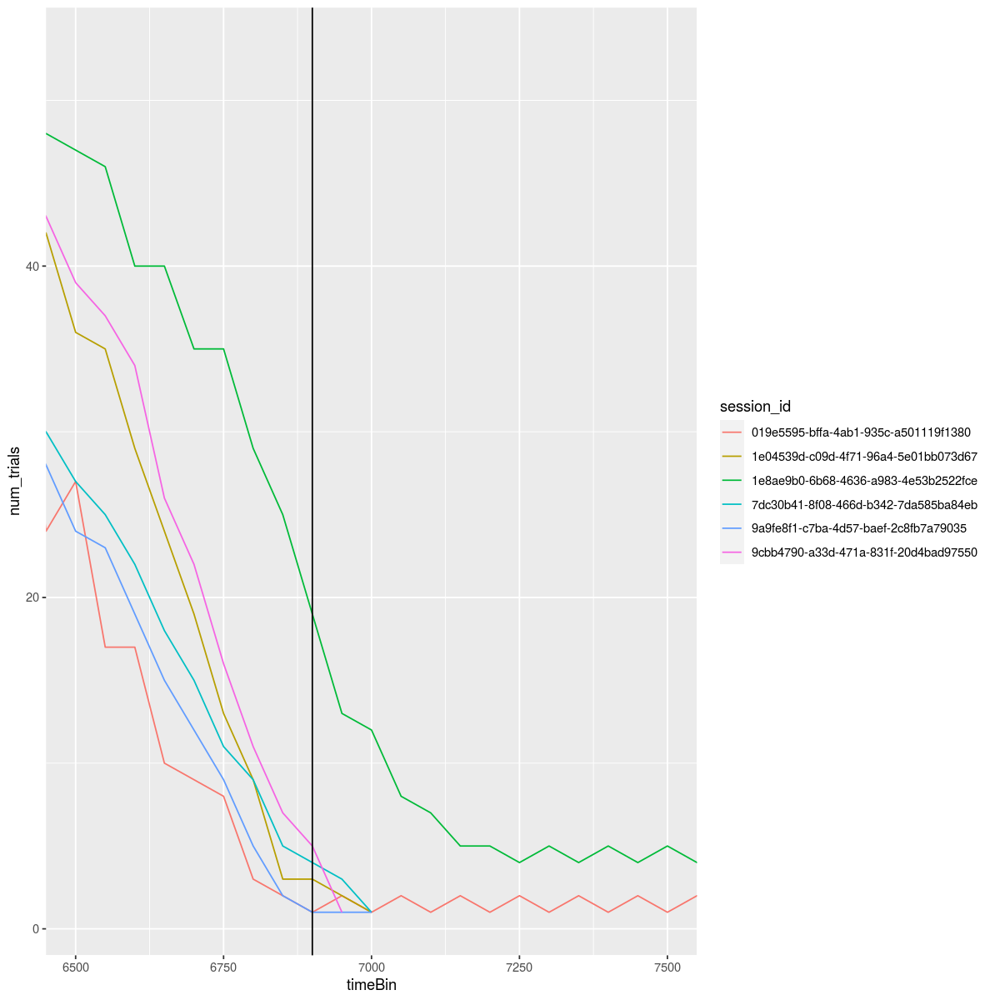

In [128]:
ggplot(num_samples_per_child) + geom_line(aes(x=timeBin, y=num_trials, 
    color=session_id)) + coord_cartesian(xlim=c(6500, 7500)) + geom_vline(xintercept = 6900)

In [129]:
subset(num_samples_per_child, timeBin == 6000)

,timeBin,session_id,num_trials
,<dbl>,<chr>,<int>
242,6000,019e5595-bffa-4ab1-935c-a501119f1380,53
761,6000,1e04539d-c09d-4f71-96a4-5e01bb073d67,45
1032,6000,1e8ae9b0-6b68-4636-a983-4e53b2522fce,48
1578,6000,7dc30b41-8f08-466d-b342-7da585ba84eb,32
1861,6000,9a9fe8f1-c7ba-4d57-baef-2c8fb7a79035,32
2122,6000,9cbb4790-a33d-471a-831f-20d4bad97550,47


In [ ]:
# All participants have 28 trials rather than 32 trials as we expect at the peak
# This could be indicative of a broader problem of some sort

Offsets here reflect variation in the duration between the start of the audio stimulus and the point of disambiguation. If the disambiguation is earlier, more of the participant video is of the following time. But we should have full coverage between -5000 and +7000

In [49]:
# source('PLEARN_analysis_helper.R')
# ed = mclapply(1:nrow(subject_info), function(i){
#     participant = subject_info[i,]
#     print(participant)
#     if (!participant$in_study |
#         participant$filename == '' | is.null(participant$filename) |
#         is.na(participant$filename) | participant$include_eyetracking == 0){
#         print(paste0('No eyetracking data for ', participant$id,' (or excluded), skipping...'))
#         return(NULL)
#     } else {
#         if (participant$expt_version == 'scene'){
#             audio_timings = bg_audio_timings
#         } else if (participant$expt_version == 'redblue') {
#             audio_timings = rb_audio_timings
#         } else {
#             stop('expt_version not recognized')
#         }        
#         return(analyzeEyetrackingParticipant(
#             'results/', 
#             participant$filename, 
#             audio_timings, 
#             participant$type))
#     }
# }, mc.cores=24)

In [99]:
# if (length(unique(subset(ed_df, participant_type == 'child')$filename)) !=
#     nrow(subset(subject_info, type == 'child' & include_eyetracking))){
#     stop('Missing child data')
# }

ERROR: Error in subset(subject_info, type == "child" & include_eyetracking): object 'subject_info' not found


In [52]:
# ed_df = merge(ed_df, subject_info, by=c('filename'))
# nrow(ed_df)
# names(ed_df)

[1] 871799

[1] "filename"                        "expt_index"                     
 [3] "timeBin"                         "FixationID"                     
 [5] "CURRENT_FIX_START"               "CURRENT_FIX_END"                
 [7] "TRIAL_INDEX"                     "CURRENT_FIX_INDEX"              
 [9] "RECORDING_SESSION_LABEL"         "CURRENT_FIX_INTEREST_AREA_LABEL"
[11] "RT"                              "target"                         
[13] "s_form"                          "novelty"                        
[15] "animacystatus"                   "voicing"                        
[17] "practice"                        "Time"                           
[19] "Nonset"                          "participant_type"               
[21] "looks_to_t"                      "looks_to_d"                     
[23] "looks_to_td"                     "exclude_trial"                  
[25] "exclude_subject"                 "label_at_onset"                 
[27] "time_to_last_nonna"              "track_loss_at_0"                
[29] "id"                              "include_eyetracking"            
[31] "include_storybook"               "age_in_days"                    
[33] "gender"                          "type"                           
[35] "expt_version"                    "comment"                        
[37] "participant_name"                "age_in_months"                  
[39] "ran_participant"                 "in_study"

### Get the properties of the eyetracking participant population after data exclusion

In [135]:
ed_df$expt_version = "lookit-agreement"

In [136]:
# participants before exclusion
num_eyetracking_participants = aggregate(participant_name ~ expt_version + type, ed_df, function(x){length(unique(x))} )
print(num_eyetracking_participants)

ERROR: Error in model.frame.default(formula = participant_name ~ expt_version + : variable lengths differ (found for 'expt_version')


In [54]:
# participants after exclusion
num_eyetracking_participants_after_exclusion =  aggregate(participant_name ~ expt_version + type, 
          subset(ed_df, exclude_subject == F), function(x){length(unique(x))} )
print(num_eyetracking_participants_after_exclusion)

  expt_version  type participant_name
1      redblue adult               15
2        scene adult                9
3      redblue child               22
4        scene child               20


No additional exclusions after this filter

# Preprocess / Plot Production Data

We preprocess the production data at this point because we want to be able to use production scores as a grouping variable in the eyetracking analysis

In [55]:
p_coded = subset(read.csv('productions_coded.csv', stringsAsFactors=F),
    !(itemId %in% c('p1','p2','p3','p4')))
# itemId is not to be trusted

p_coded$itemId = as.numeric(as.factor(as.character(p_coded$Lemma)))
print(names(p_coded))
print(nrow(p_coded))

[1] "child"                "itemId"               "Lemma"               
[4] "Singular.description" "Singular.Code"        "Plural.Description"  
[7] "Plural.Code"          "Comments"             "X"                   
[1] 832


In [56]:
if (length(setdiff(
    subset(subject_info, expt_version %in% c('redblue',
    'scene') & type == 'child' & include_storybook)$participant_name,
    unique(p_coded$child))) > 0){
    stop('Missing child codes')
} 

In [57]:
numTrialsPerChild = aggregate(itemId ~ child, p_coded, length)
numTrialsPerChild = numTrialsPerChild[order(numTrialsPerChild$itemId, decreasing=T),]
if (nrow(subset(numTrialsPerChild, itemId != 16)) > 0){
    stop('Coded child data is missing trials')
}

In [58]:
num_production_items = length(unique(p_coded$itemId)) #16 test x 2 + 4 shared practice
if (num_production_items != 32){
    stop('There should be 32 test production items')
}

In [59]:
codebook = c(
    'No data (0)',
    'No verbal response (1)',
    'Not identifiable/babble (2)',
    'Other word (not noun) (3)',
    'Noun from context (4)',
    'Singular form (5)',
    'Non-conventional plural form (6)',
    'Plural form, approximate articulation (7)',
    'Plural form, adult-like articulation (8)' 
)

codes = data.frame(code = seq(0,8), description = codebook)
codes$description = factor(codes$description, levels = codebook)

In [60]:
pt_ds = read.csv('../PLEARN_experiments/plearn_productiveTask_datasource.csv')
p_coded = merge(p_coded, pt_ds, by.x='Lemma', by.y='s_form')
nrow(p_coded) # the decrease is because the remainder are practice

[1] 832

In [61]:
names(p_coded)

[1] "Lemma"                "child"                "itemId"              
 [4] "Singular.description" "Singular.Code"        "Plural.Description"  
 [7] "Plural.Code"          "Comments"             "X"                   
[10] "novel_id"             "background_context"   "vowel_carrier"       
[13] "full_carrier"         "s_carrier"            "s_punct"             
[16] "s_wav_index"          "s_sentence"           "pl_form"             
[19] "pl_carrier"           "pl_punct"             "pl_wav_index"        
[22] "pl_sentence"          "novelty"              "voicing"             
[25] "simple_pl_stim"       "simple_s_stim"        "animacyStatus"       
[28] "test_index"           "trial_index"          "Trial"               
[31] "Practice"             "NovelColor"           "book"

In [62]:
s_codes = aggregate(itemId ~ Singular.Code + child, p_coded, length)
names(s_codes) = c('code', 'child', 'count')
s_codes = merge(s_codes, codes, all = T)
s_codes$s_pl ='singular'
subset(s_codes, code == '')

code,child,count,description,s_pl
<int>,<chr>,<int>,<fct>,<chr>


In [63]:
p_codes = aggregate(itemId ~ Plural.Code + child, p_coded, length)
names(p_codes) = c('code', 'child','count')
p_codes = merge(p_codes, codes, all = T)
p_codes$s_pl = 'plural'
subset(p_codes, code == '')

code,child,count,description,s_pl
<int>,<chr>,<int>,<fct>,<chr>


In [64]:
code_counts = rbind.fill(s_codes, p_codes)
code_counts$s_pl = factor(code_counts$s_pl, levels =c('singular','plural'))
head(code_counts)

,code,child,count,description,s_pl
,<int>,<chr>,<int>,<fct>,<fct>
1,0,pl01,1,No data (0),singular
2,1,pl01,3,No verbal response (1),singular
3,1,pl20,5,No verbal response (1),singular
4,1,pl05,14,No verbal response (1),singular
5,1,pl24,1,No verbal response (1),singular
6,1,pl03,3,No verbal response (1),singular


In [65]:
excluded_storybook_trials = subset(code_counts, description == 'No data (0)')
numStorybookTrialsExcluded = sum(excluded_storybook_trials$count)
numStorybookTrialsExcluded
numChildrenWithTrialsExcludedFromStorybook =length(unique(excluded_storybook_trials$child))
tvc = update_texvar_cache(tvc, 'numStorybookTrialsExcluded', numStorybookTrialsExcluded)
tvc = update_texvar_cache(tvc, 'numChildrenWithTrialsExcludedFromStorybook', numChildrenWithTrialsExcludedFromStorybook)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

[1] 12

In [66]:
# pass a subset of participants in order to get their distribution of responses

# options(repr.plot.width=7, repr.plot.height=10)
# ggplot(code_counts) + geom_bar(aes(x=description, y=count, fill=description), stat='identity'
# ) + theme_bw() +theme(legend.position="none") + theme(axis.text.x = element_text(angle = 45, 
# hjust = 1)) + xlab('') + ylab('') + facet_grid(child~s_pl)

In [67]:
# coded trials after  singular productions, #5
# pl_codes = aggregate(itemId ~ Plural.Code + child, subset(p_coded, Singular.Code == 5), length)
# names(pl_codes) = c('code', 'child','count')
# p_codes = merge(pl_codes, codes, all.x=T)
# p_codes$type = 'plural'
# ggplot(p_codes) + geom_bar(aes(x=description, y=count, fill=description), stat='identity'
# ) + theme_bw() +theme(legend.position="none") + theme(axis.text.x = element_text(angle = 45, 
# hjust = 1)) + xlab('') + ylab(''
# ) + ggtitle('Responses for Plural Trials after Singular Production') + facet_wrap(~child)

# Compute Production Scores

In [68]:
# note that both of these are subset to singular succeses
computeProductionScores = function(codes, method = 'narrow'){    
    if (method == 'narrow'){
        # if they marked the plural in some way,was it adult-like? (i.e. the question in
        # Clark and Nikitina (2009))
        sum(codes %in% c(7,8)) / sum(codes %in% seq(6,8))
    } else if (method == 'broad') {
        # did they mark the plural?
        sum(codes %in% c(7,8)) / sum(codes %in% seq(2,8))
    }
}


In [69]:
narrow_production_scores = aggregate(Plural.Code ~ child, subset(p_coded, Singular.Code == 5), computeProductionScores)
names(narrow_production_scores) = c('participant_name', 'narrow_score')
broad_production_scores = aggregate(Plural.Code ~ child, subset(p_coded, Singular.Code == 5), function(x){computeProductionScores(x,'broad')})
names(broad_production_scores) = c('participant_name','broad_score')

In [70]:
# add the production scores to subject info
subject_info = merge(merge(subject_info, broad_production_scores, all=T), 
                     narrow_production_scores, all=T)

In [71]:
nrow(subset(subject_info, type == 'child' & expt_version %in% c('scene','redblue')))
nrow(subset(broad_production_scores, !is.nan(broad_score)))

[1] 53

[1] 50

In [72]:
nrow(subset(subject_info, type == 'child' & expt_version %in% c('scene','redblue') & in_study))
nrow(subset(broad_production_scores, !is.nan(broad_score)))

[1] 52

[1] 50

In [73]:
shapiro.test(subset(subject_info, type == 'child' & 
                    expt_version %in% c('scene') & in_study)$broad_score)
shapiro.test(subset(subject_info, type == 'child' & 
                    expt_version %in% c('redblue') & in_study)$broad_score)


	Shapiro-Wilk normality test

data:  subset(subject_info, type == "child" & expt_version %in% c("scene") &     in_study)$broad_score
W = 0.84064, p-value = 0.002943



	Shapiro-Wilk normality test

data:  subset(subject_info, type == "child" & expt_version %in% c("redblue") &     in_study)$broad_score
W = 0.75296, p-value = 3.082e-05


In [74]:
# can we combine the two?
production_wt = wilcox.test(subset(subject_info, in_study & expt_version == 'redblue')$broad_score,
             subset(subject_info, in_study & expt_version == 'scene')$broad_score)
production_wt

Warning message in wilcox.test.default(subset(subject_info, in_study & expt_version == :
“cannot compute exact p-value with ties”



	Wilcoxon rank sum test with continuity correction

data:  subset(subject_info, in_study & expt_version == "redblue")$broad_score and subset(subject_info, in_study & expt_version == "scene")$broad_score
W = 234.5, p-value = 0.3973
alternative hypothesis: true location shift is not equal to 0


In [75]:
productionWilcoxonStat = unname(production_wt$statistic)[1]
tvc = update_texvar_cache(tvc, 'productionWilcoxonStat', productionWilcoxonStat)
productionWilcoxonP = unname(production_wt$p.value)[1]
tvc = update_texvar_cache(tvc, 'productionWilcoxonP', productionWilcoxonP)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [76]:
tvc

$ranN
[1] 53

$ranNScene
[1] 24

$ranNRedBlue
[1] 29

$totalN
[1] 53

$studyN
[1] 52

$sceneN
[1] 24

$redblueN
[1] 29

$redblueNExclusions
[1] 6

$sceneNExclusions
[1] 4

$redBlueAdultN
[1] 15

$sceneAdultN
[1] 9

$nRedBlueStorybookExclusions
[1] 1

$nSceneStorybookExclusions
[1] 2

$percentFem
[1] 54.72

$numFem
[1] 29

$meanAge
[1] 30.17

$sdAge
[1] 3.97

$numStorybookTrialsExcluded
[1] 12

$numChildrenWithTrialsExcludedFromStorybook
[1] 8

$productionWilcoxonStat
[1] 234.5

$productionWilcoxonP
[1] 0.4

In [77]:
# add the production scores to ed_df
ed_df = merge(
    merge(ed_df, broad_production_scores, by='participant_name', all=T),
    narrow_production_scores, by='participant_name', all=T)

In [78]:
names(ed_df)
nrow(ed_df)

[1] "participant_name"                "filename"                       
 [3] "expt_index"                      "timeBin"                        
 [5] "FixationID"                      "CURRENT_FIX_START"              
 [7] "CURRENT_FIX_END"                 "TRIAL_INDEX"                    
 [9] "CURRENT_FIX_INDEX"               "RECORDING_SESSION_LABEL"        
[11] "CURRENT_FIX_INTEREST_AREA_LABEL" "RT"                             
[13] "target"                          "s_form"                         
[15] "novelty"                         "animacystatus"                  
[17] "voicing"                         "practice"                       
[19] "Time"                            "Nonset"                         
[21] "participant_type"                "looks_to_t"                     
[23] "looks_to_d"                      "looks_to_td"                    
[25] "exclude_trial"                   "exclude_subject"                
[27] "label_at_onset"                  "time_to_last_nonna"             
[29] "track_loss_at_0"                 "id"                             
[31] "include_eyetracking"             "include_storybook"              
[33] "age_in_days"                     "gender"                         
[35] "type"                            "expt_version"                   
[37] "comment"                         "age_in_months"                  
[39] "ran_participant"                 "in_study"                       
[41] "broad_score"                     "narrow_score"

[1] 871812

# Associate Participant Information With All Records

In [79]:
num_trials_per_subj = aggregate(TRIAL_INDEX ~ participant_name + exclude_trial, ed_df, function(x){length(unique(x))})

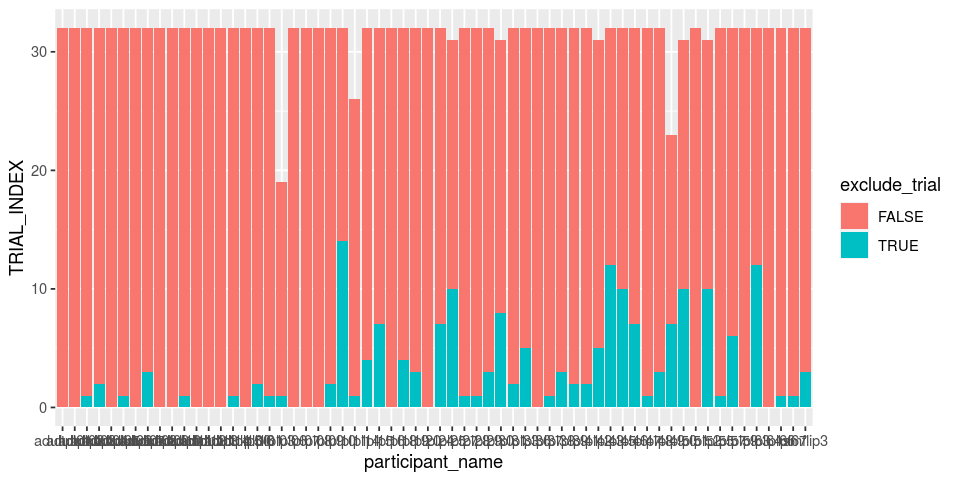

In [80]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(num_trials_per_subj) + geom_bar(aes(x=participant_name, fill=exclude_trial, 
                                           y=TRIAL_INDEX), stat='identity', position="stack")

In [81]:
# whole participants who were excluded
nChildrenWithExcludedTrials = 
length(unique(subset(ed_df, type == 'child' & exclude_trial == T )$participant_name))
nChildrenWithExcludedTrials
tvc = update_texvar_cache(tvc, 'nChildrenWithExcludedTrials', 
    nChildrenWithExcludedTrials)

[1] 36

In [82]:
ed_df$name_trial = paste0(ed_df$participant_name,'_',ed_df$expt_index)

In [83]:
# whole participants who were excluded
nTrialsExcludedByFilter = 
length(unique(subset(ed_df, type == 'child' & exclude_trial == T )$name_trial))
nTrialsExcludedByFilter
tvc = update_texvar_cache(tvc, 'nTrialsExcludedByFilter', 
    nTrialsExcludedByFilter)

[1] 170

In [84]:
percentExcludedEyetrackingTrials = 100 * length(unique(subset(ed_df, type == 'child' & exclude_trial == T )$name_trial)) / length(unique(subset(ed_df, type == 'child')$name_trial))
percentExcludedEyetrackingTrials
tvc = update_texvar_cache(tvc, 'percentExcludedEyetrackingTrials', 
    percentExcludedEyetrackingTrials, digits=0)

[1] 12.9672

In [85]:
# whole participants who were excluded
n_eyetracking_subj_excluded_by_data_filter = length(unique(subset(ed_df, exclude_subject ==T )$participant_name))
n_eyetracking_subj_excluded_by_data_filter
tvc = update_texvar_cache(tvc, 'nEyetrackingSubjExcludedByDataFilter', 
    n_eyetracking_subj_excluded_by_data_filter)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

[1] 0

In [86]:
# add the trial order as a grouping variable
ed_df$first3 = 'remainder'
ed_df$first3[ed_df$TRIAL_INDEX <= 7] = 'first 3 test trials'

# Plot Aggregate Eyetracking Timecourses

## Merge Children

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


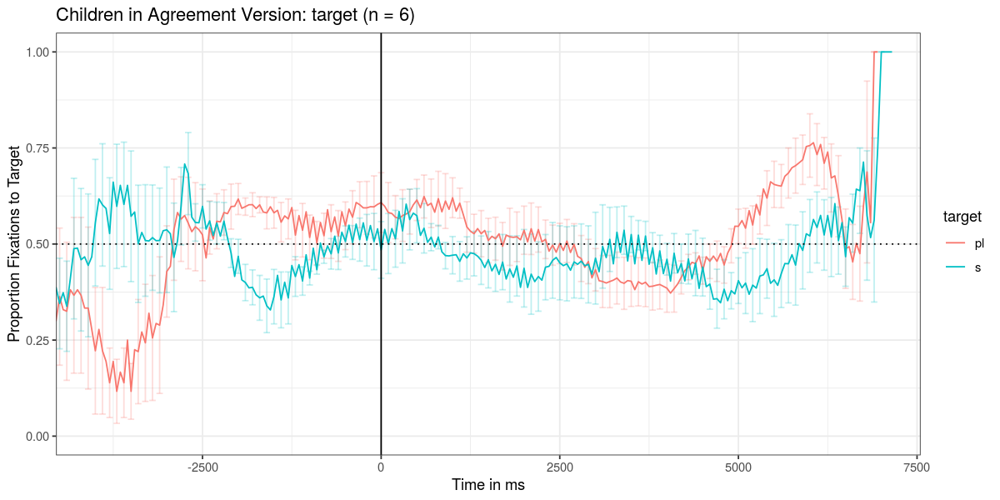

[1] "figures/_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


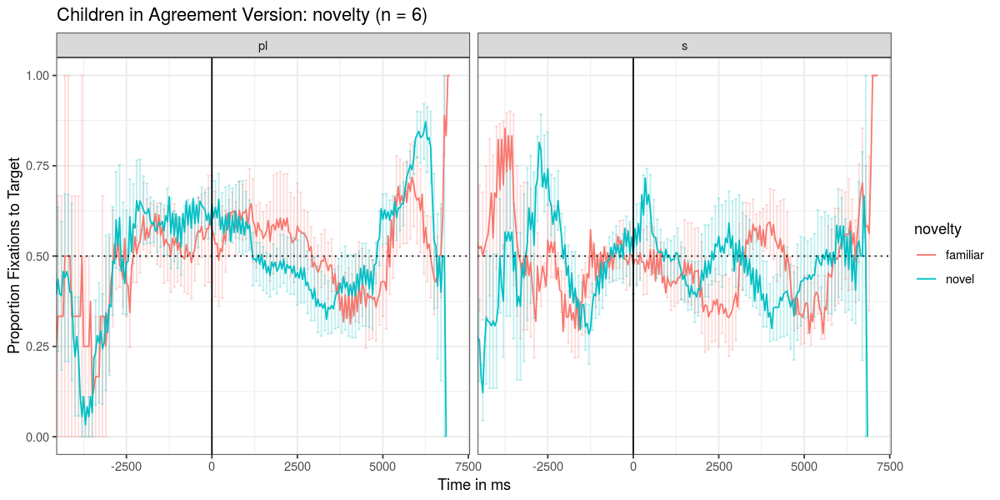

[1] "figures/_animacystatus_~target.pdf"


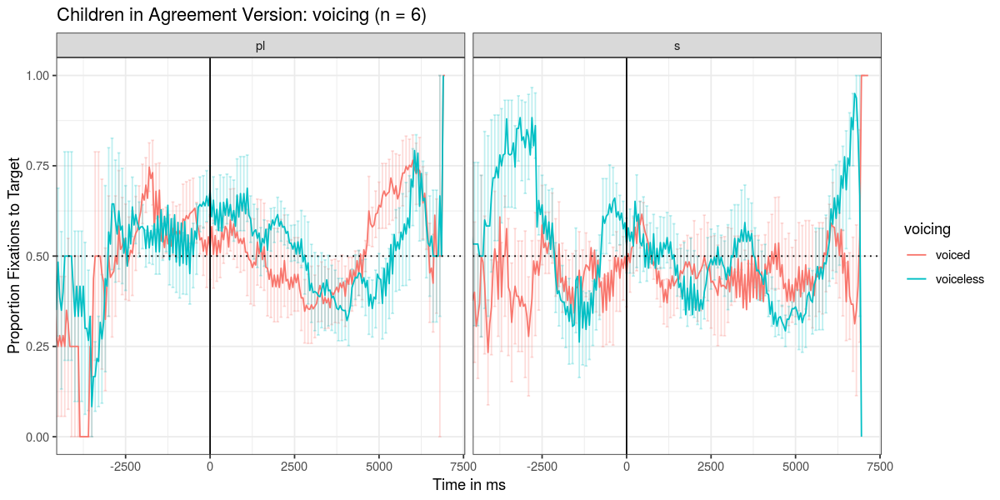

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/_nullgroup_~label_at_onset.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


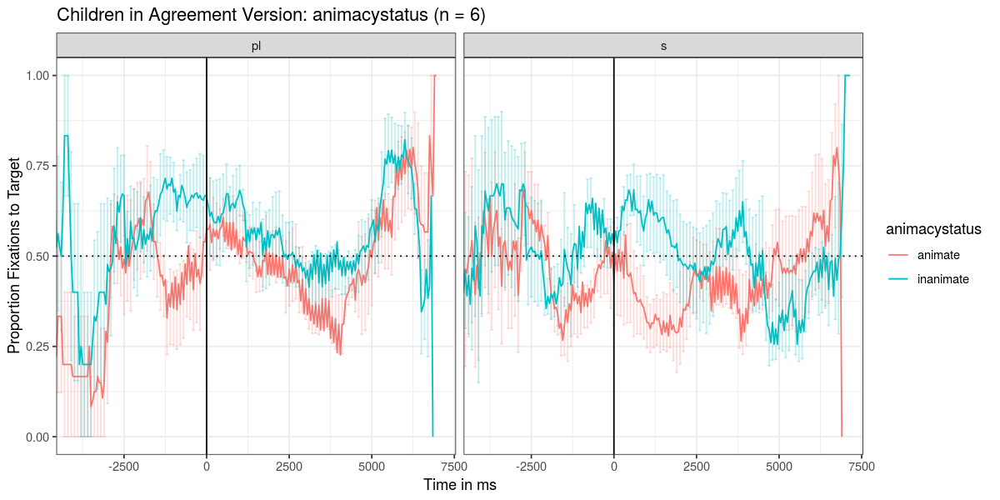

[1] "figures/_target_~novelty.pdf"


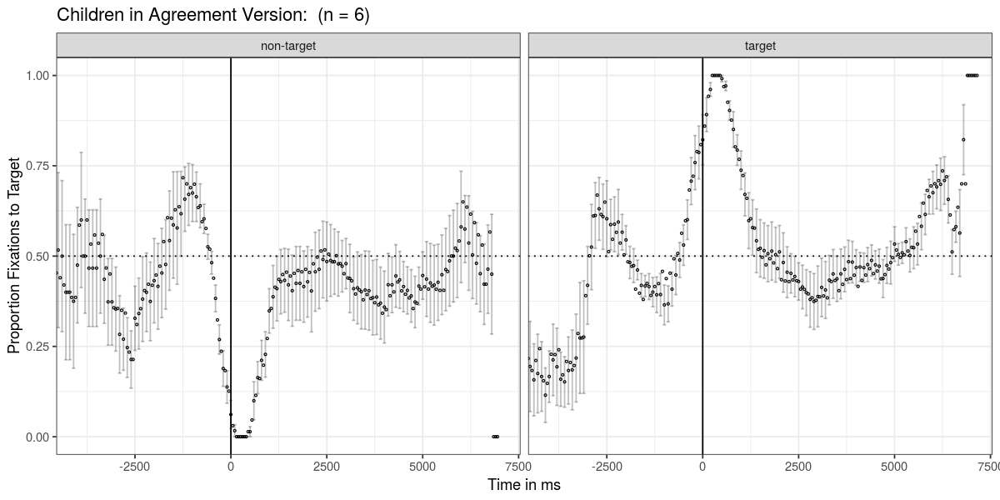

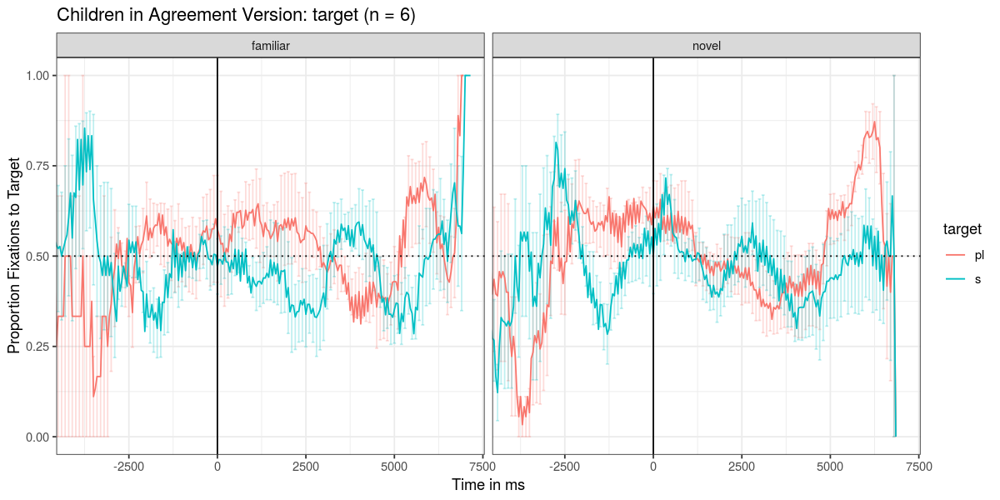

In [137]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, group_title = 'Children in Agreement Version',
    save_plot=T)

# problem with taking time mod 100; assumes standardize 1000 hz processing
# want to sample from eaf using a sampling rate rather than sampling 
# standardize to 20 ms
# need to add subject info csv
# why wasn't normalization a problem in the previous version of the code?

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'&expt_version=='scene'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'&expt_version=='scene'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


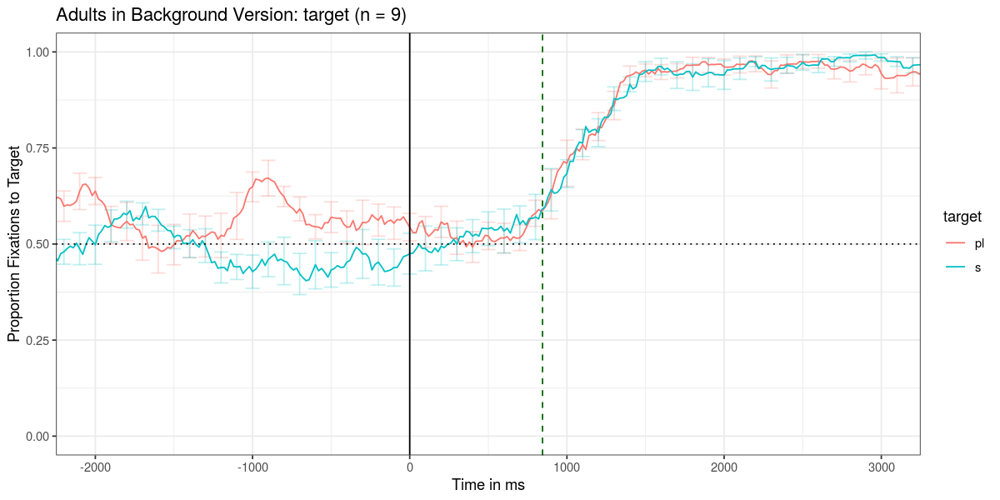

[1] "figures/type=='adult'&expt_version=='scene'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


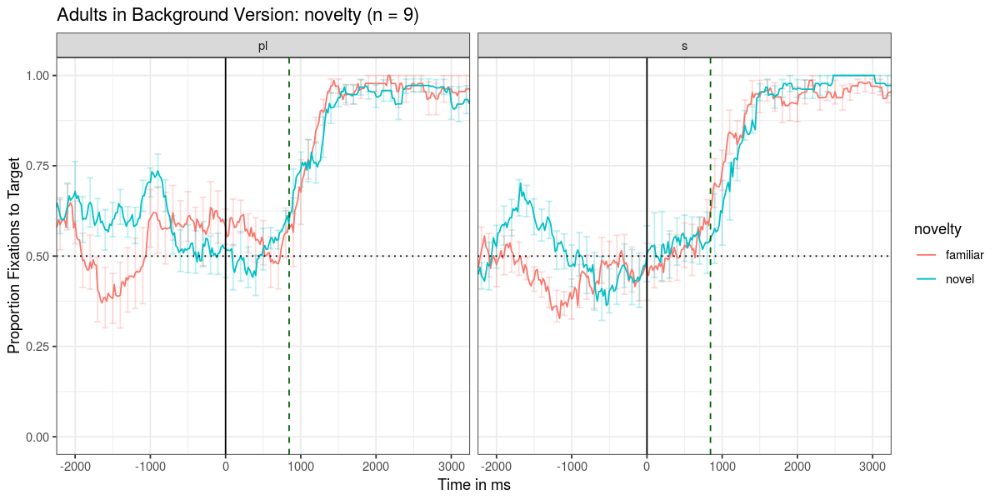

[1] "figures/type=='adult'&expt_version=='scene'_animacystatus_~target.pdf"


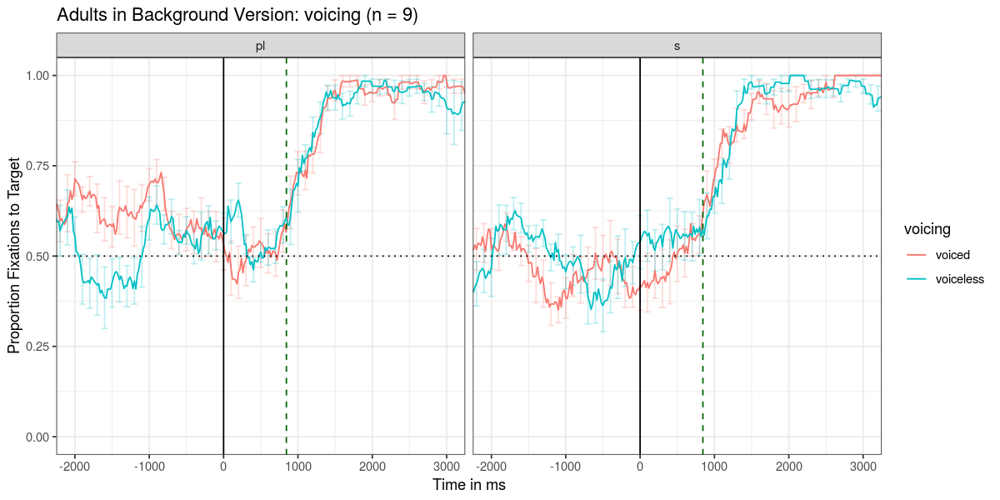

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='adult'&expt_version=='scene'_nullgroup_~label_at_onset.pdf"


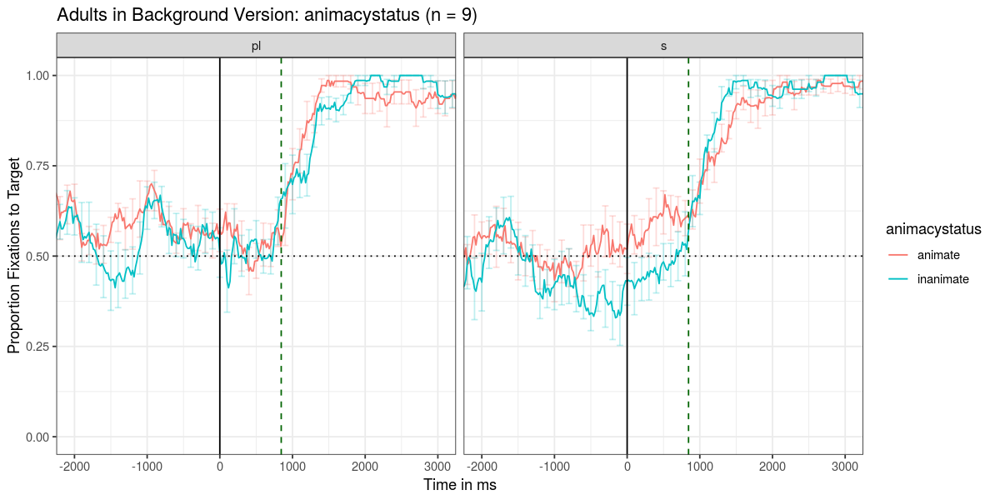

[1] "facet clause:"
[1] "~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + first3"
[1] "figures/type=='adult'&expt_version=='scene'_nullgroup_~first3.pdf"


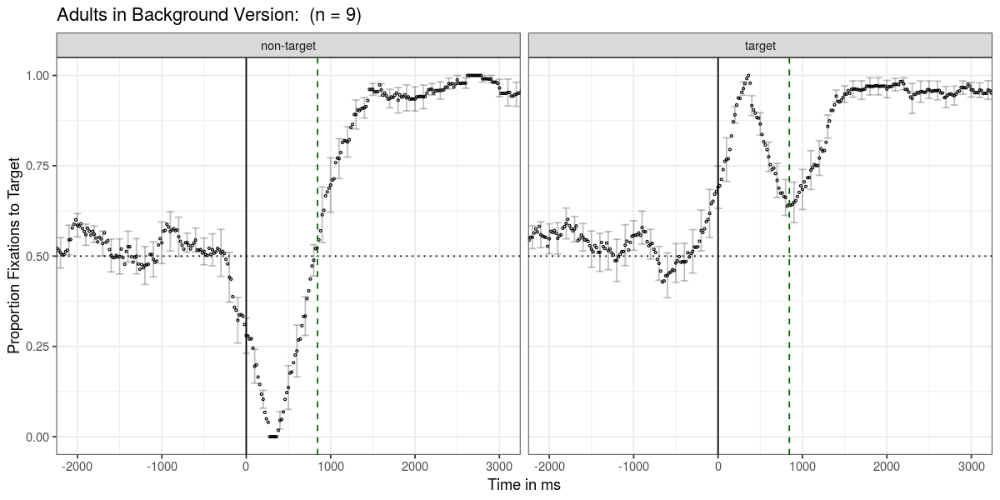

[1] "facet clause:"
[1] "target ~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target+first3"
[1] "figures/type=='adult'&expt_version=='scene'_nullgroup_target~first3.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


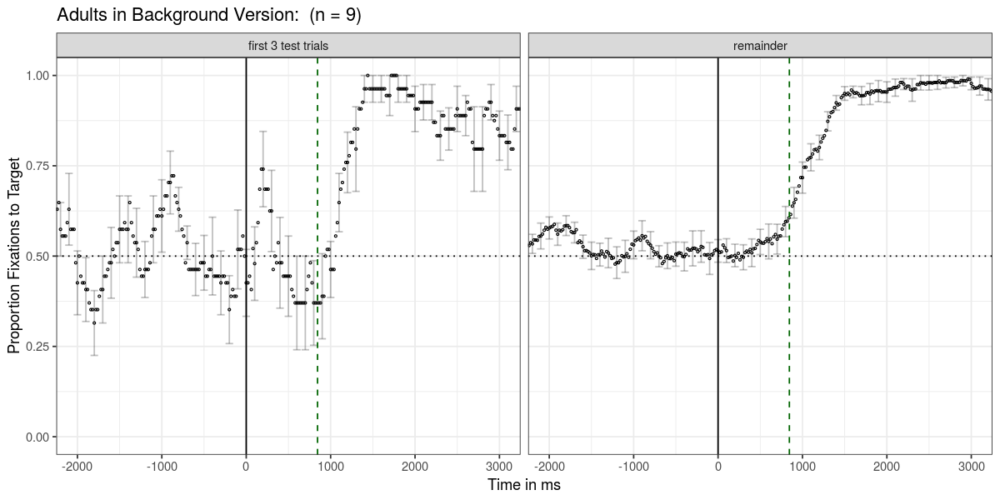

[1] "figures/type=='adult'&expt_version=='scene'_target_~novelty.pdf"


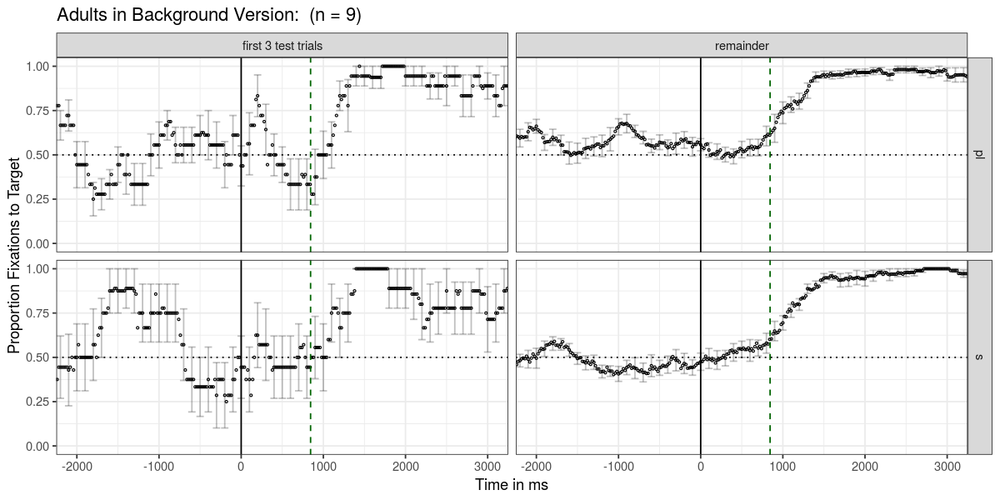

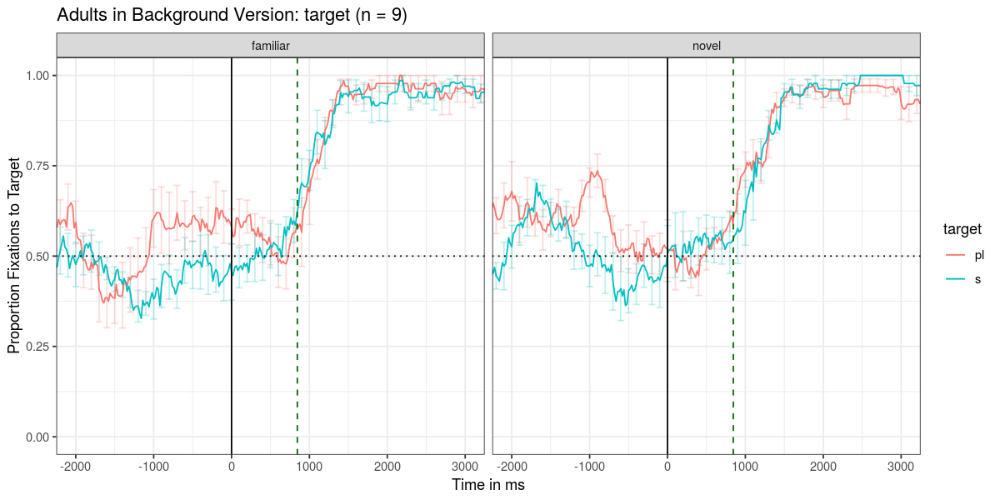

In [88]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'adult' & expt_version == 'scene'",
    mean_pp_duration = mean_pp_duration, group_title = 'Adults in Background Version',
    save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='scene'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='scene'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


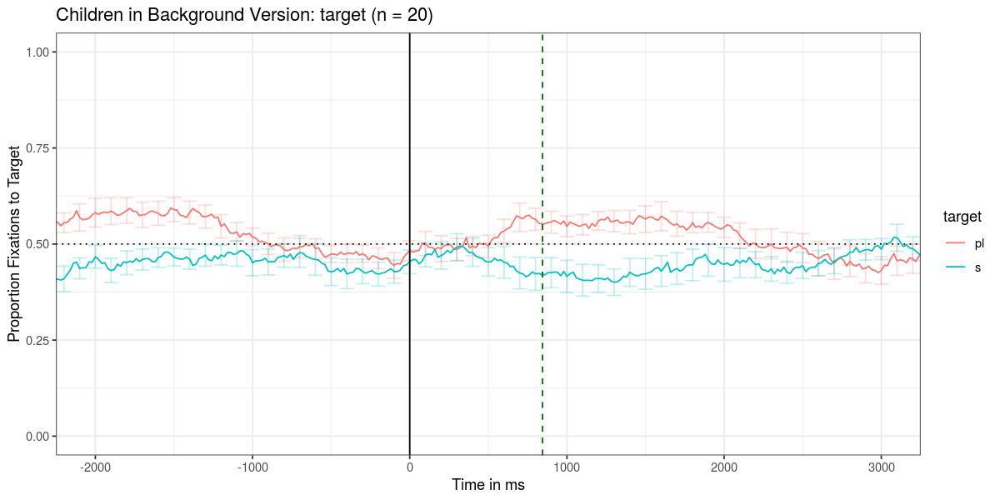

[1] "figures/type=='child'&expt_version=='scene'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


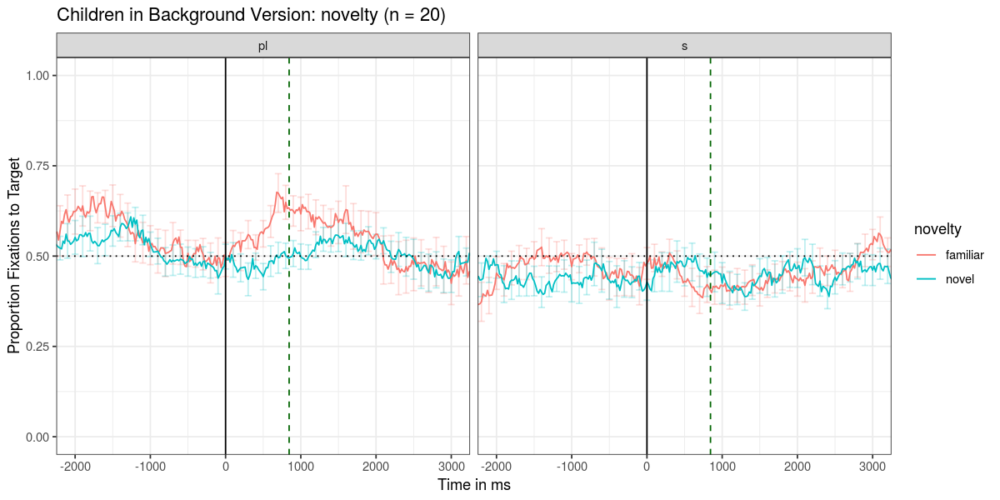

[1] "figures/type=='child'&expt_version=='scene'_animacystatus_~target.pdf"


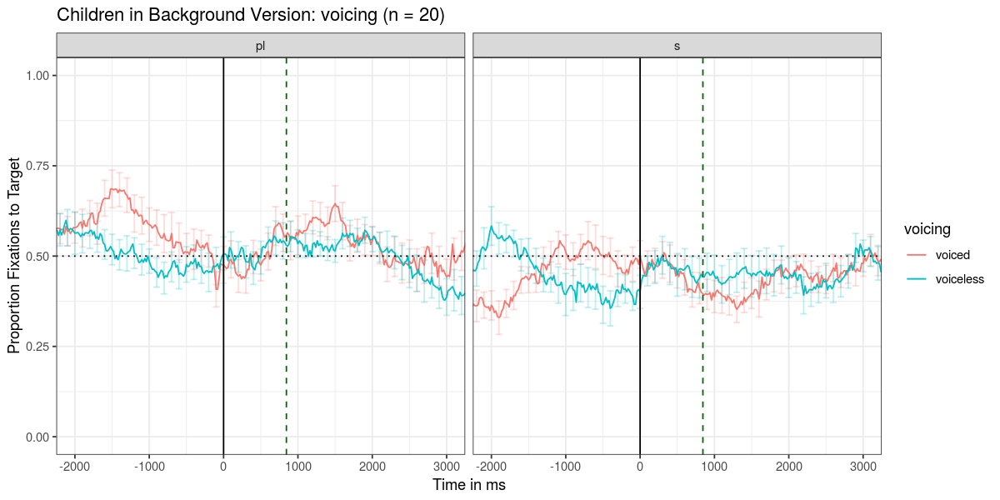

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&expt_version=='scene'_nullgroup_~label_at_onset.pdf"


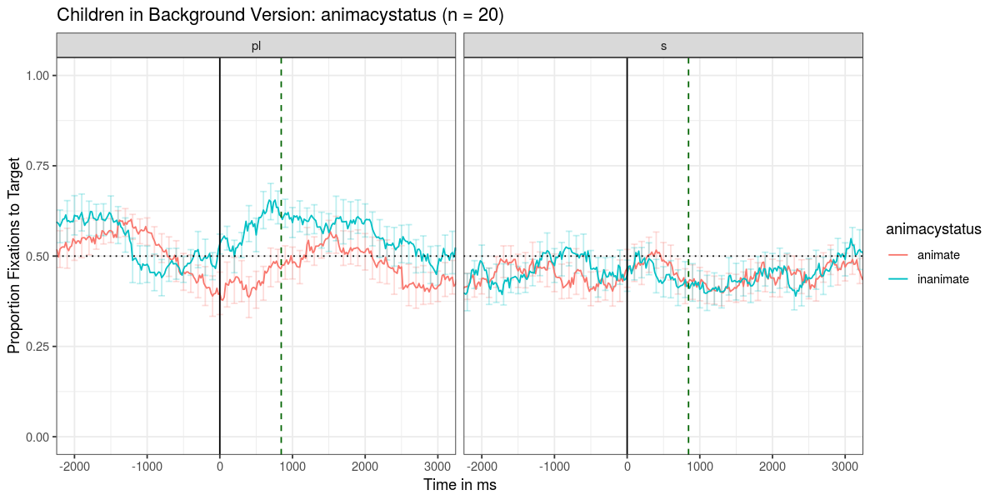

[1] "facet clause:"
[1] "~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + first3"
[1] "figures/type=='child'&expt_version=='scene'_nullgroup_~first3.pdf"


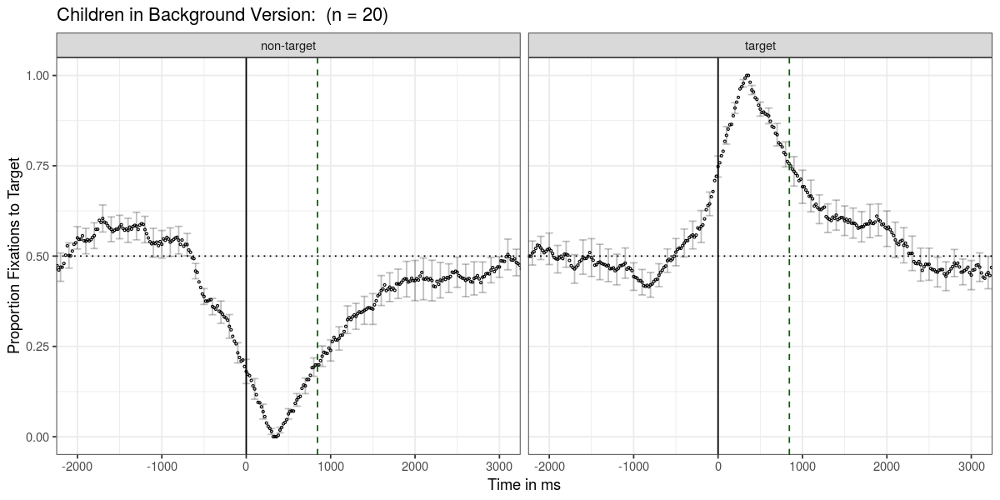

[1] "facet clause:"
[1] "target ~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target+first3"
[1] "figures/type=='child'&expt_version=='scene'_nullgroup_target~first3.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


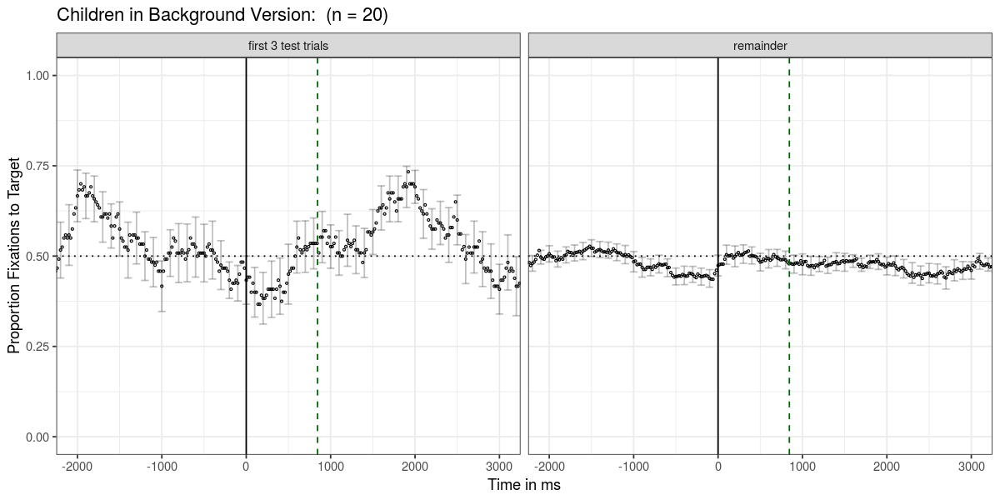

[1] "figures/type=='child'&expt_version=='scene'_target_~novelty.pdf"


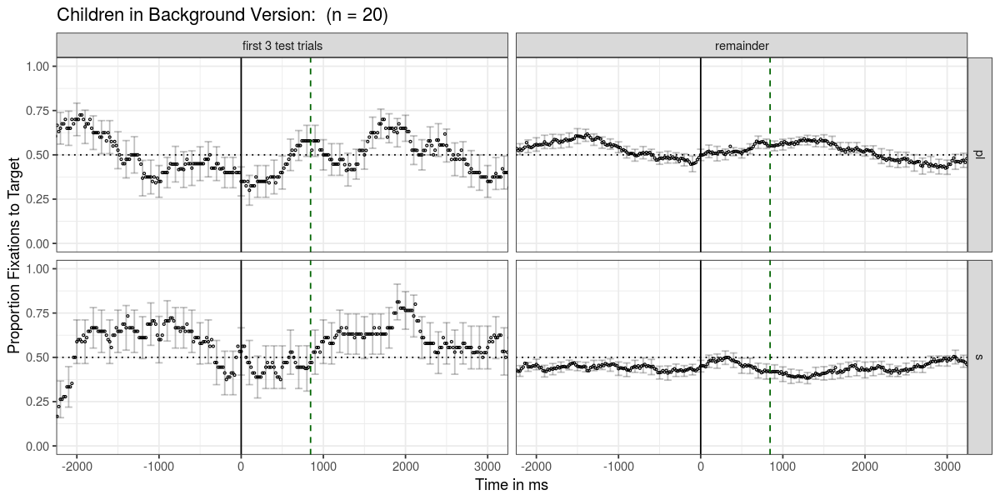

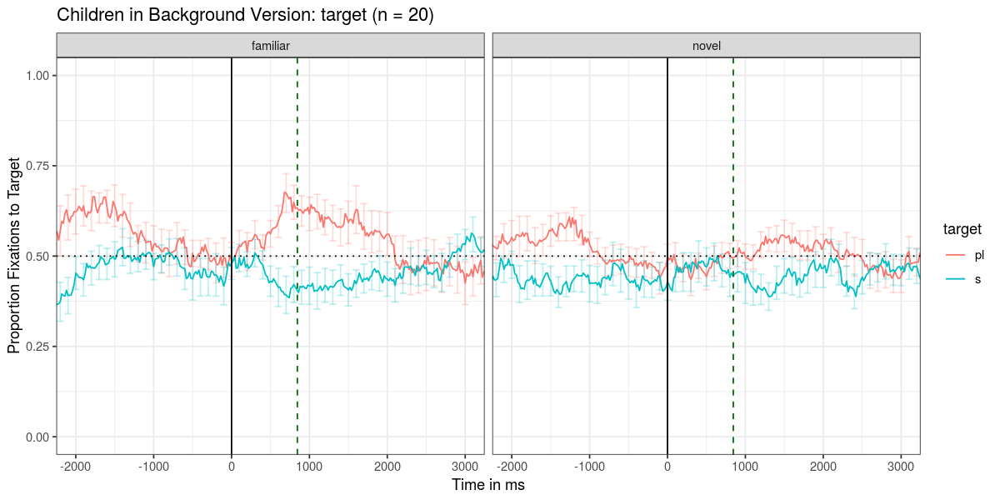

In [89]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child'& expt_version == 'scene'",
    mean_pp_duration = mean_pp_duration, group_title = 'Children in Background Version',
    save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


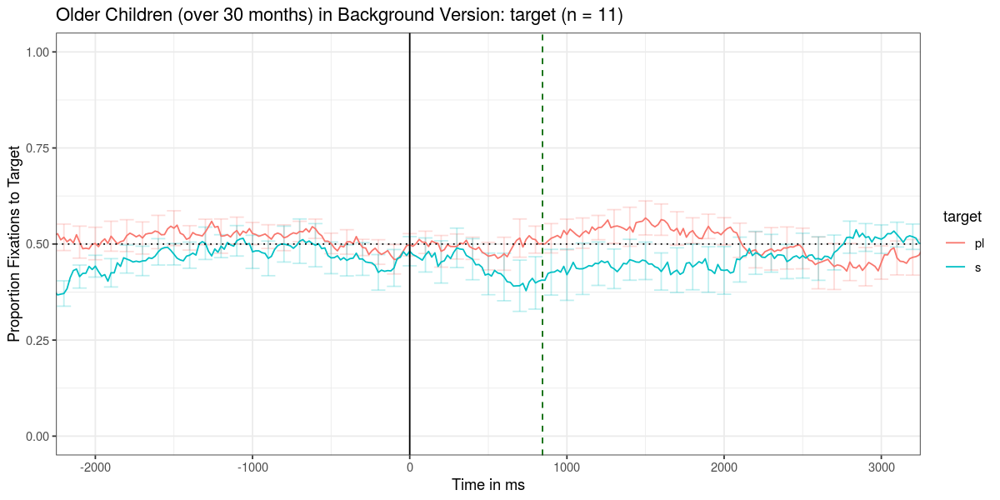

[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


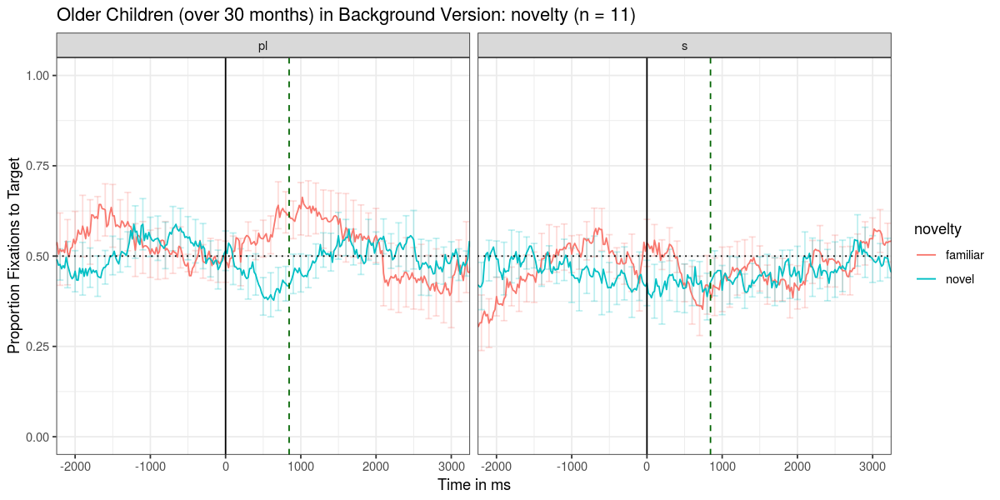

[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_animacystatus_~target.pdf"


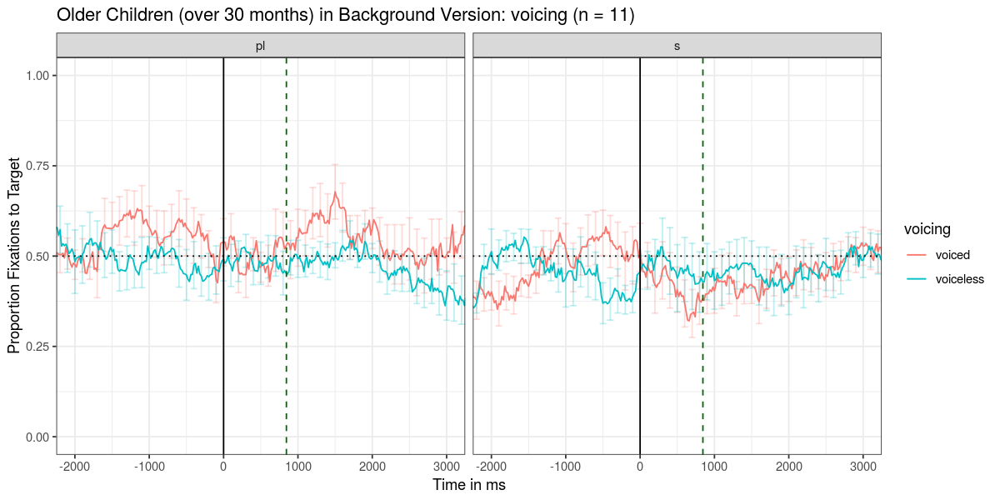

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_nullgroup_~label_at_onset.pdf"


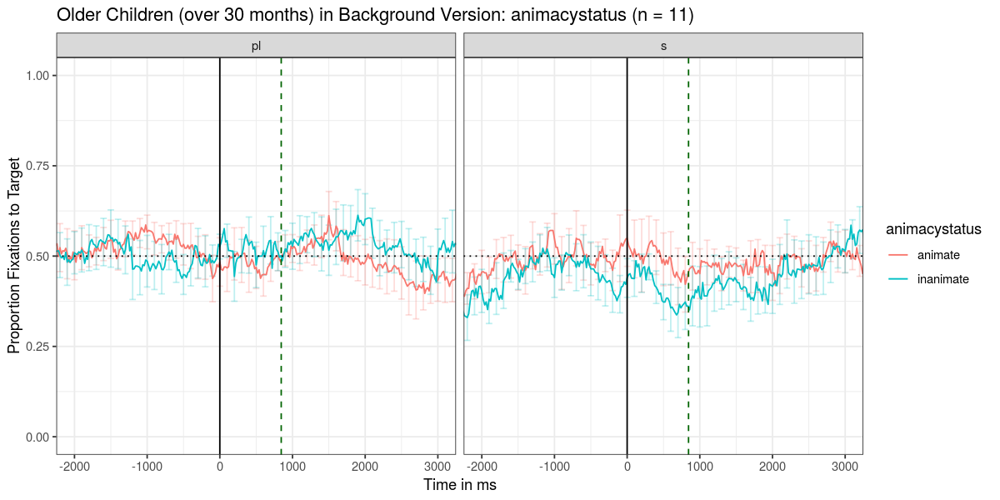

[1] "facet clause:"
[1] "~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + first3"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_nullgroup_~first3.pdf"


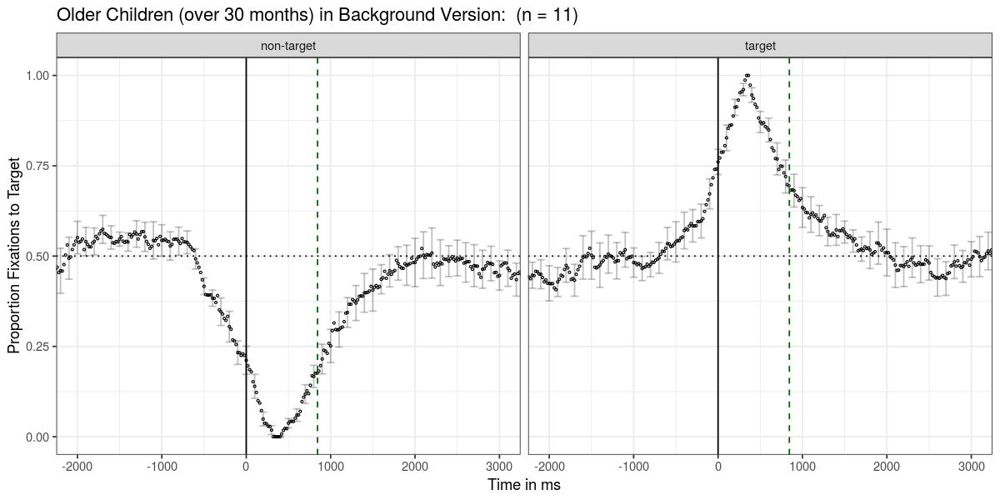

[1] "facet clause:"
[1] "target ~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target+first3"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_nullgroup_target~first3.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


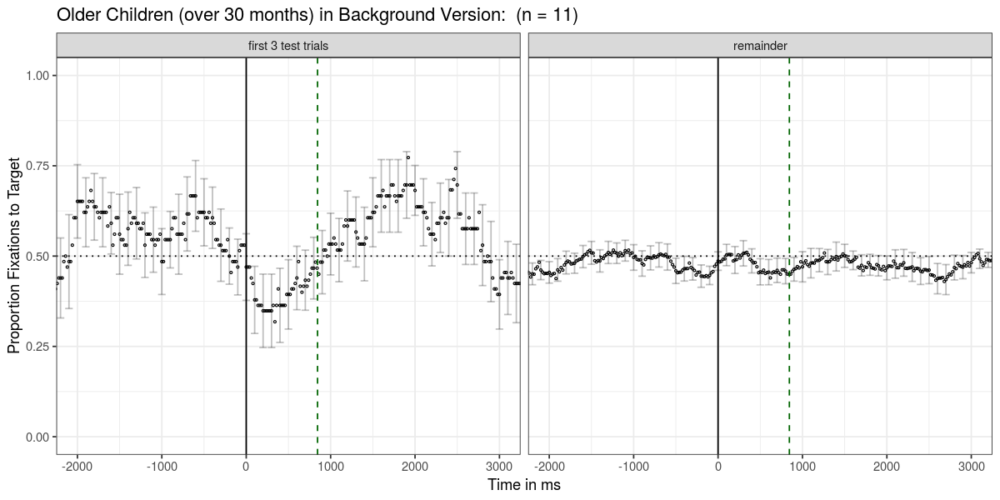

[1] "figures/type=='child'&age_in_days>=915&expt_version=='scene'_target_~novelty.pdf"


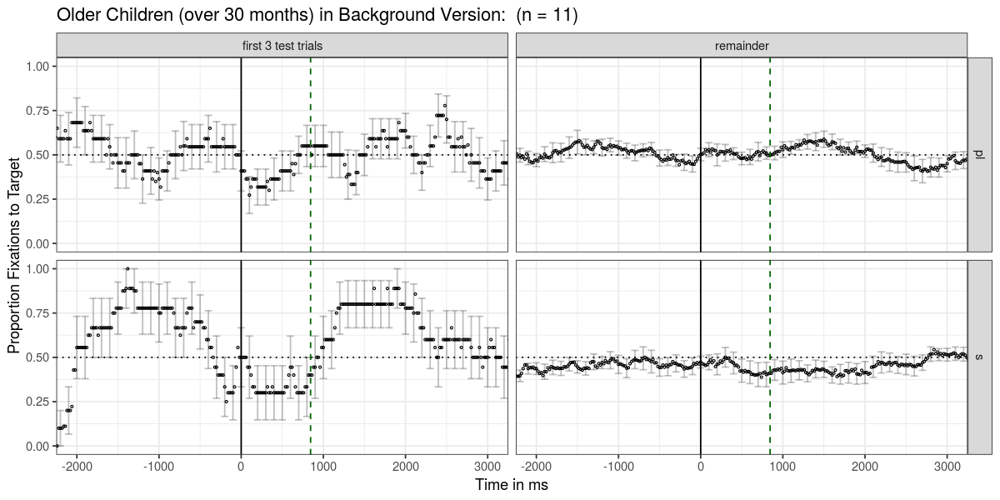

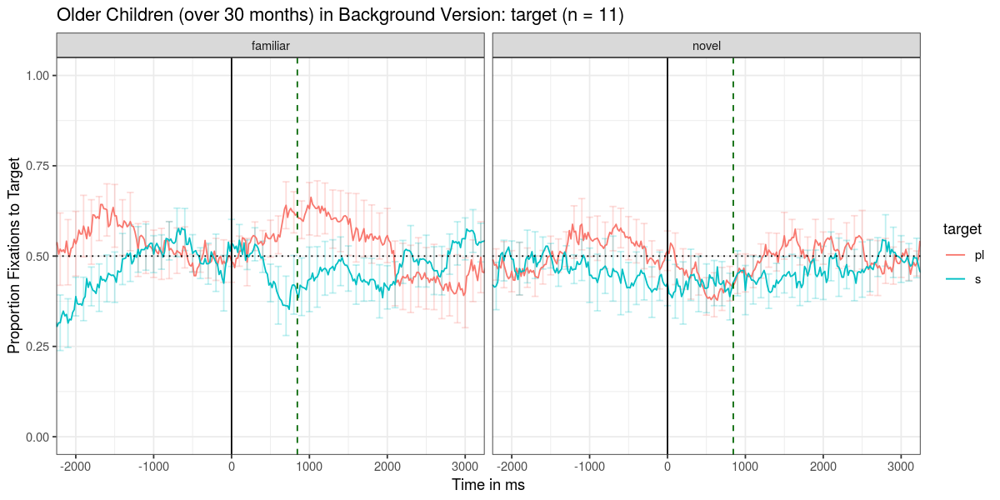

In [90]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & age_in_days >= 915 & expt_version == 'scene'",
    mean_pp_duration = mean_pp_duration, 
    group_title = 'Older Children (over 30 months) in Background Version', save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


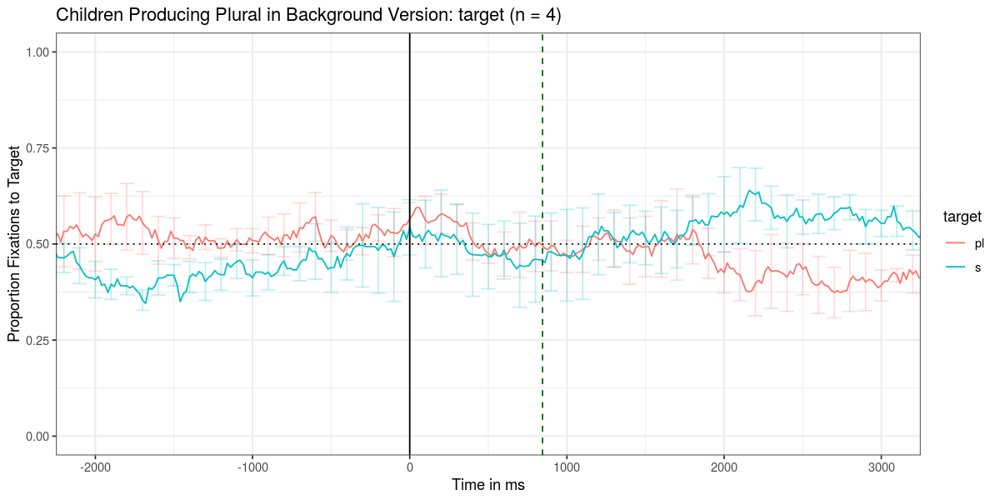

[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


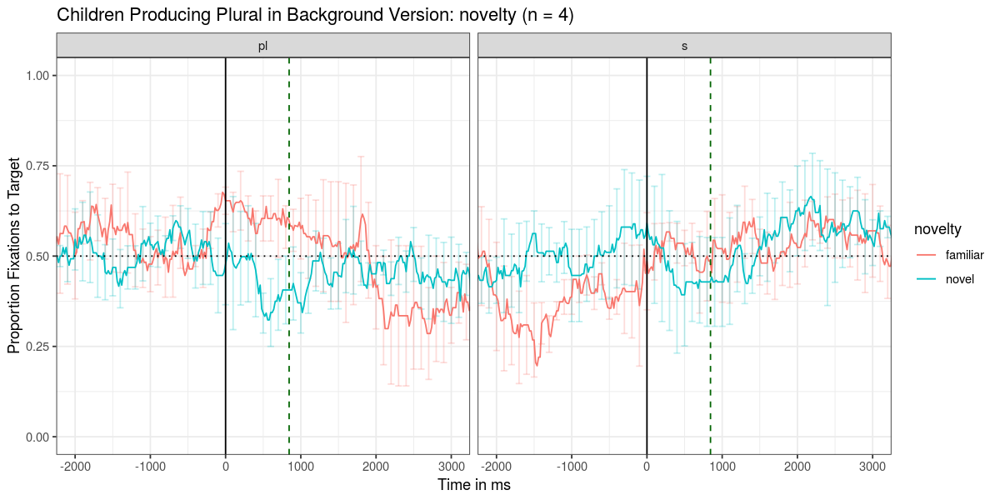

[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_animacystatus_~target.pdf"


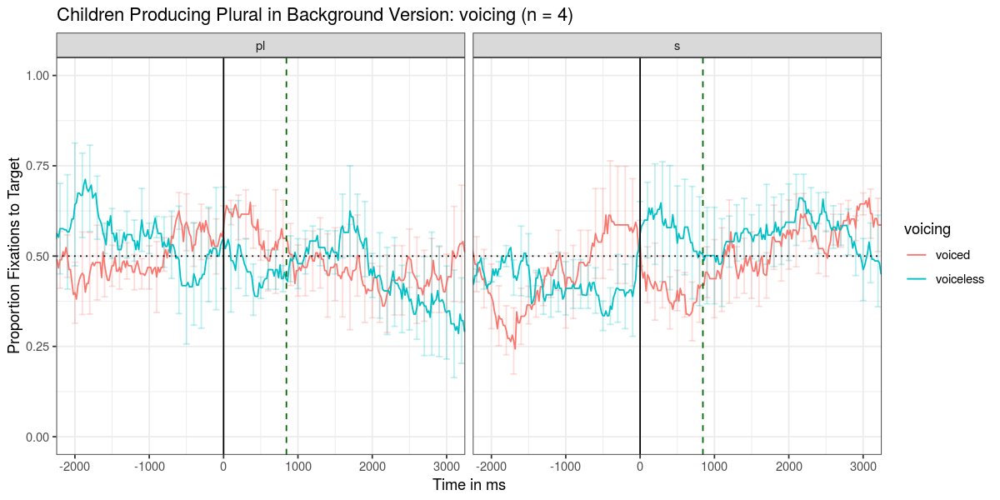

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_nullgroup_~label_at_onset.pdf"


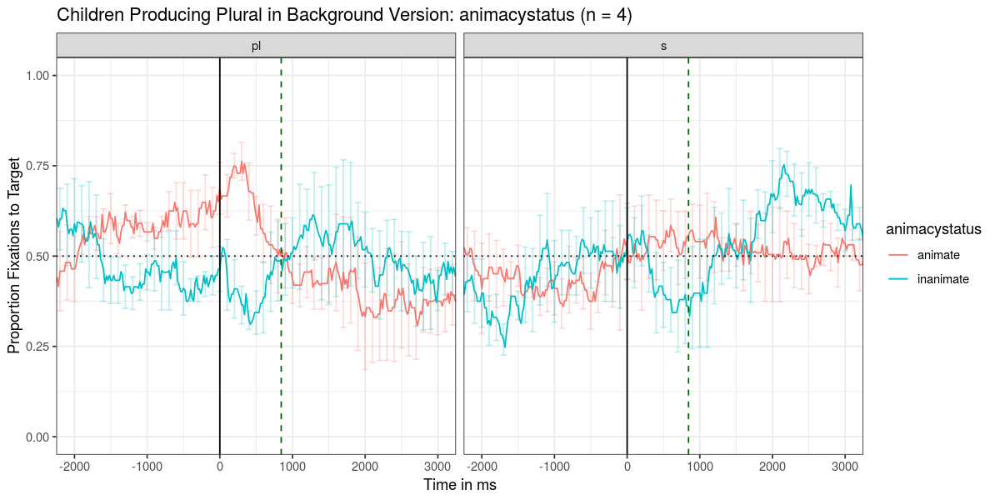

[1] "facet clause:"
[1] "~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + first3"
[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_nullgroup_~first3.pdf"


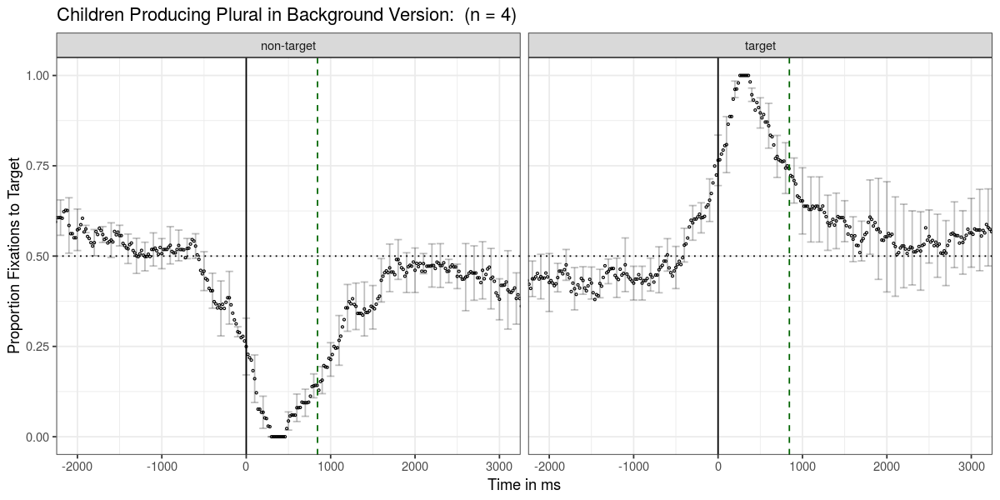

[1] "facet clause:"
[1] "target ~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target+first3"
[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_nullgroup_target~first3.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


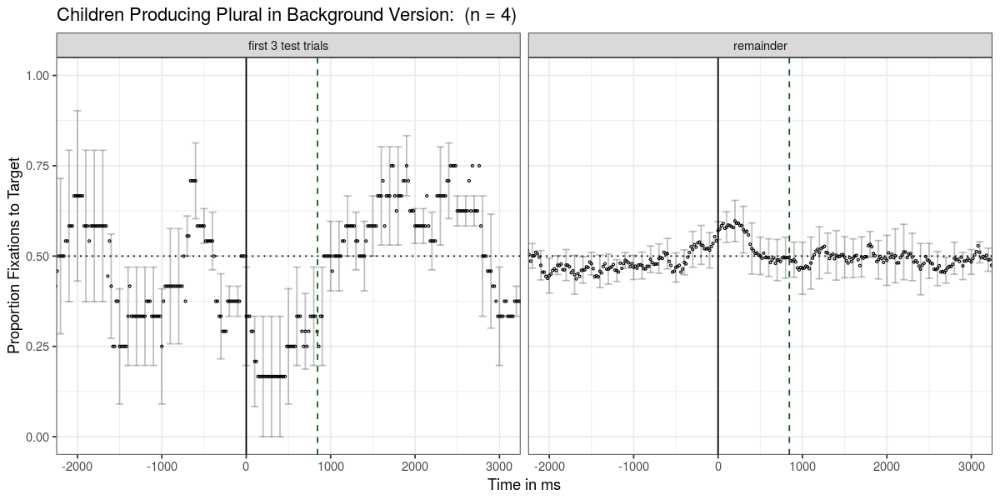

[1] "figures/type=='child'&broad_score>.5&expt_version=='scene'_target_~novelty.pdf"


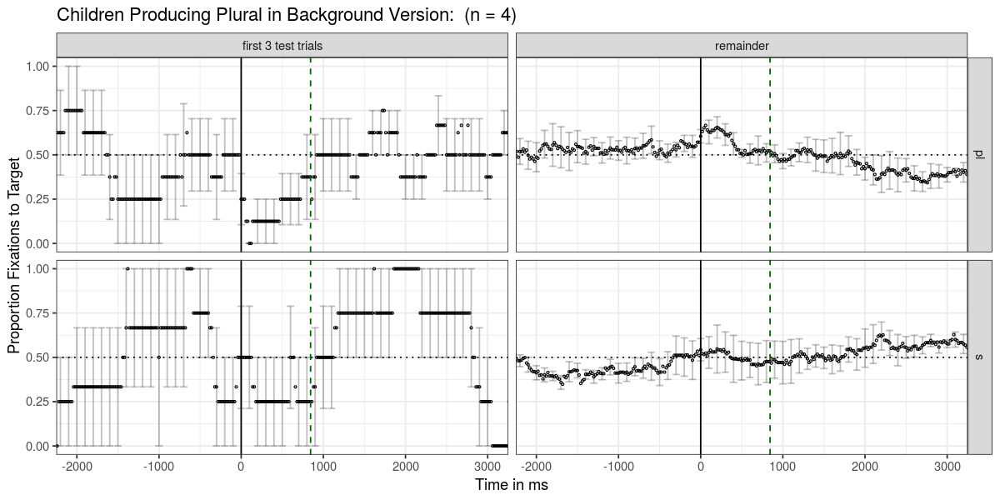

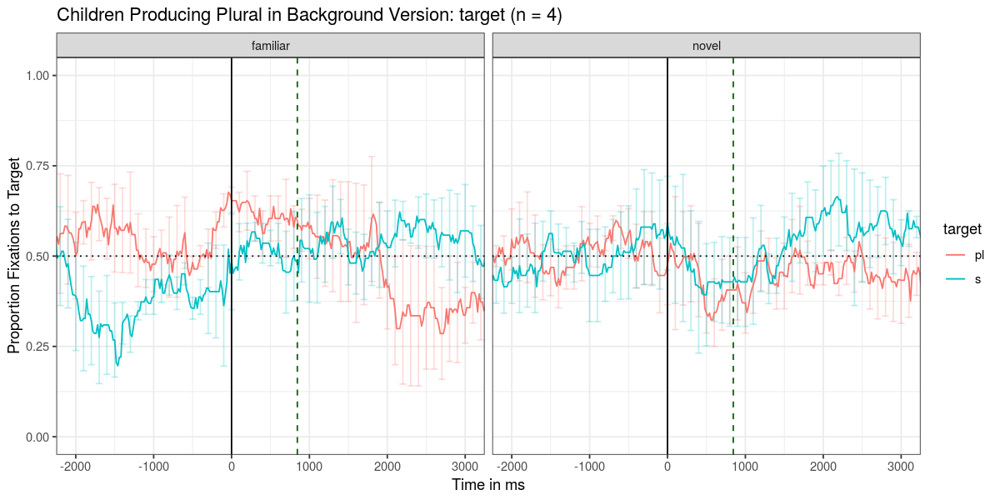

In [92]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & broad_score > .5 & expt_version == 'scene' ",
    mean_pp_duration = mean_pp_duration, 
    group_title = 'Children Producing Plural in Background Version', save_plot=T)

## Red/Blue (Simplified) Version

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'&expt_version=='redblue'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'&expt_version=='redblue'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


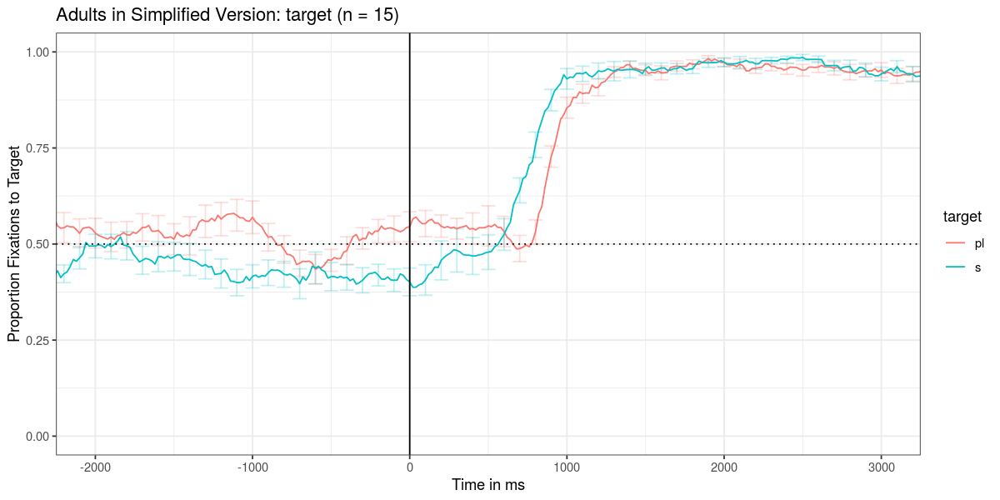

[1] "figures/type=='adult'&expt_version=='redblue'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


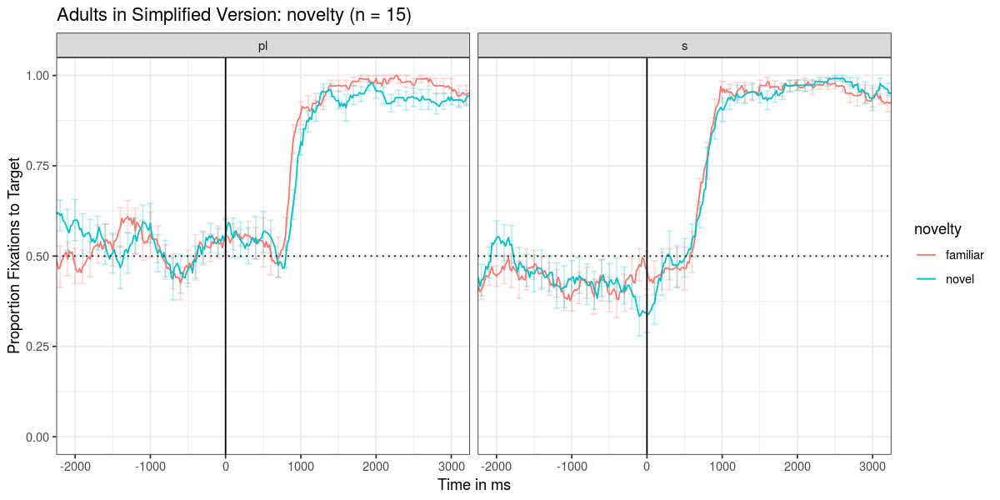

[1] "figures/type=='adult'&expt_version=='redblue'_animacystatus_~target.pdf"


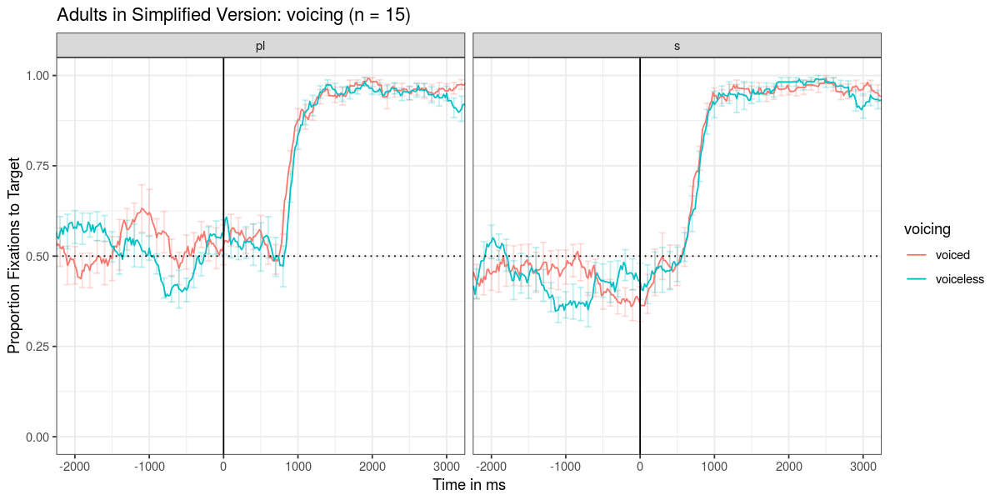

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='adult'&expt_version=='redblue'_nullgroup_~label_at_onset.pdf"


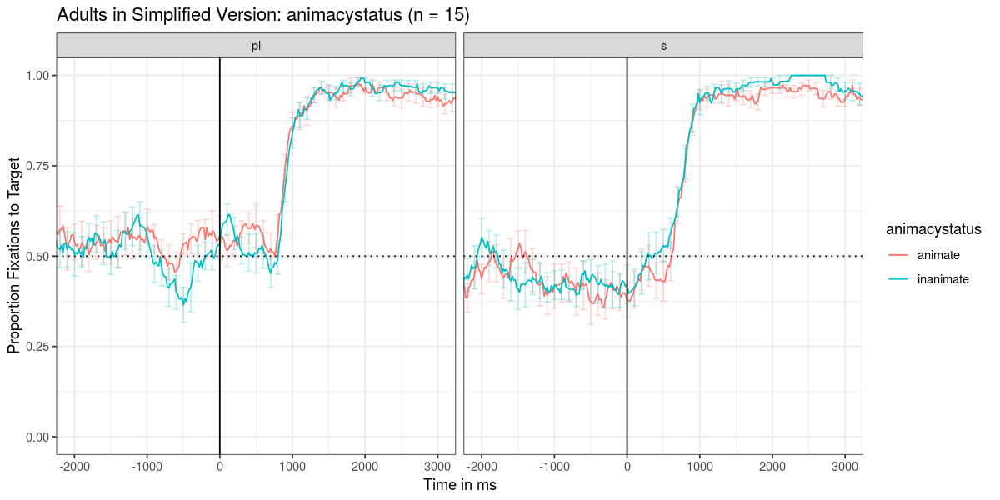

[1] "facet clause:"
[1] "~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + first3"
[1] "figures/type=='adult'&expt_version=='redblue'_nullgroup_~first3.pdf"


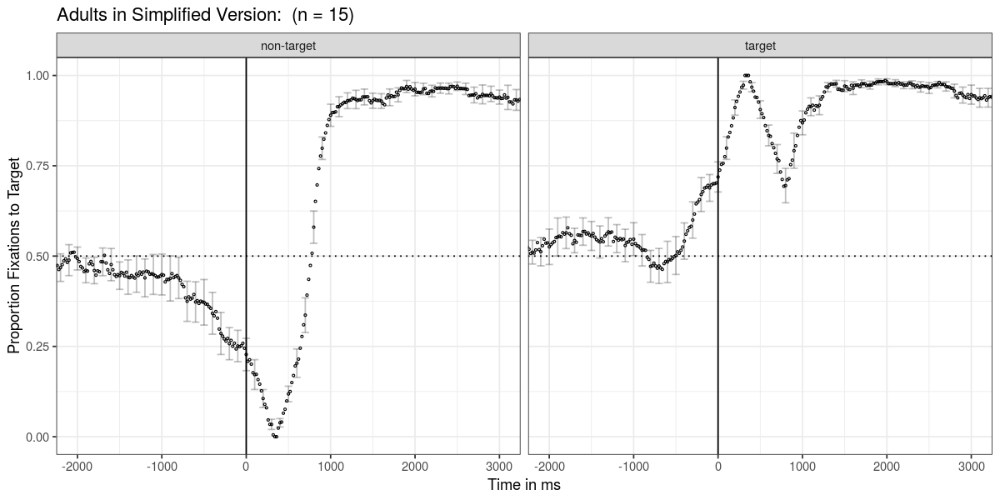

[1] "facet clause:"
[1] "target ~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target+first3"
[1] "figures/type=='adult'&expt_version=='redblue'_nullgroup_target~first3.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


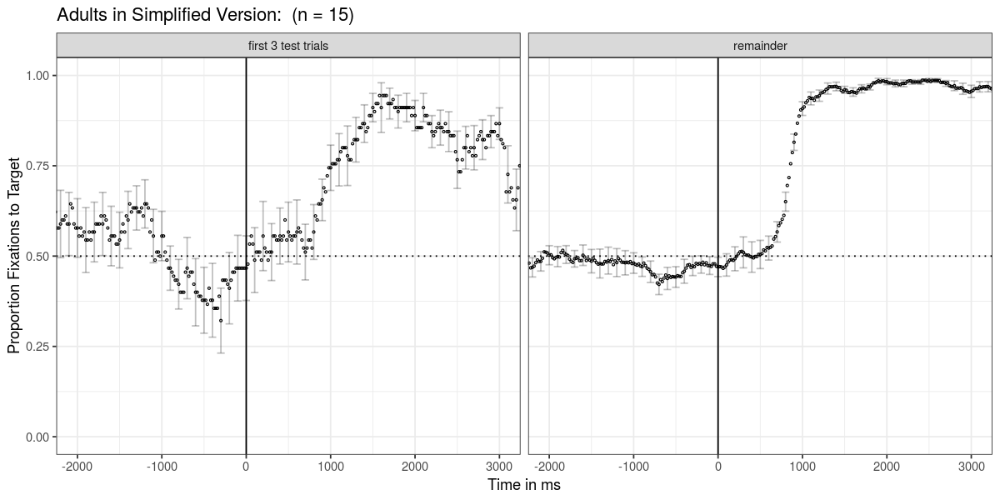

[1] "figures/type=='adult'&expt_version=='redblue'_target_~novelty.pdf"


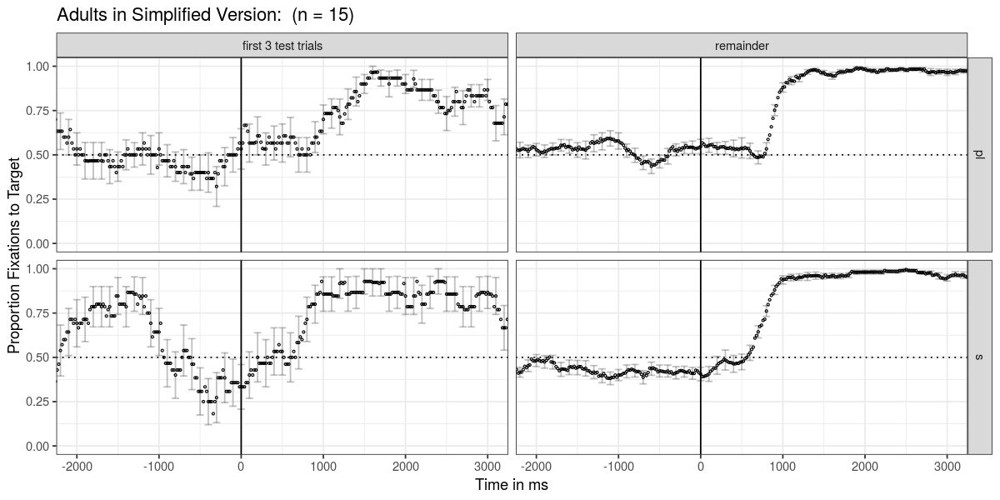

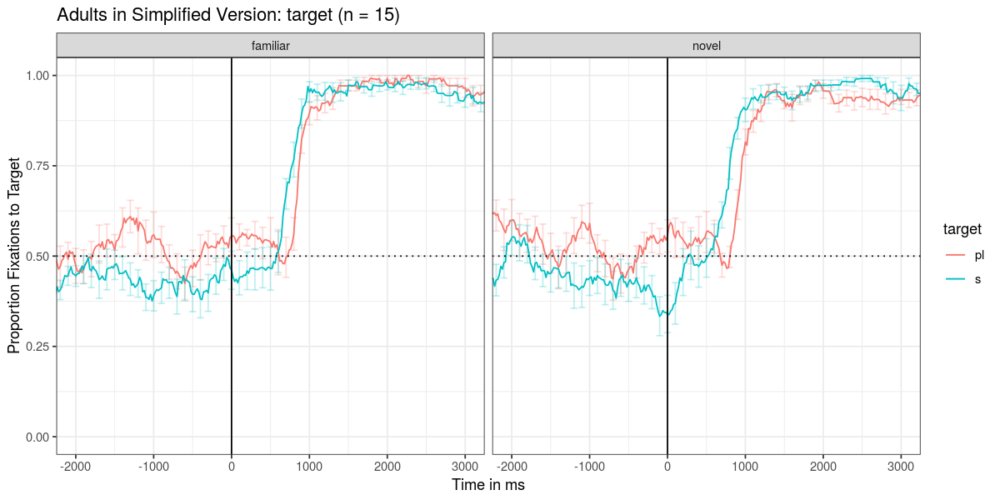

In [93]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'adult' & expt_version == 'redblue'",
    mean_pp_duration = NULL, group_title = 'Adults in Simplified Version', save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='redblue'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='redblue'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


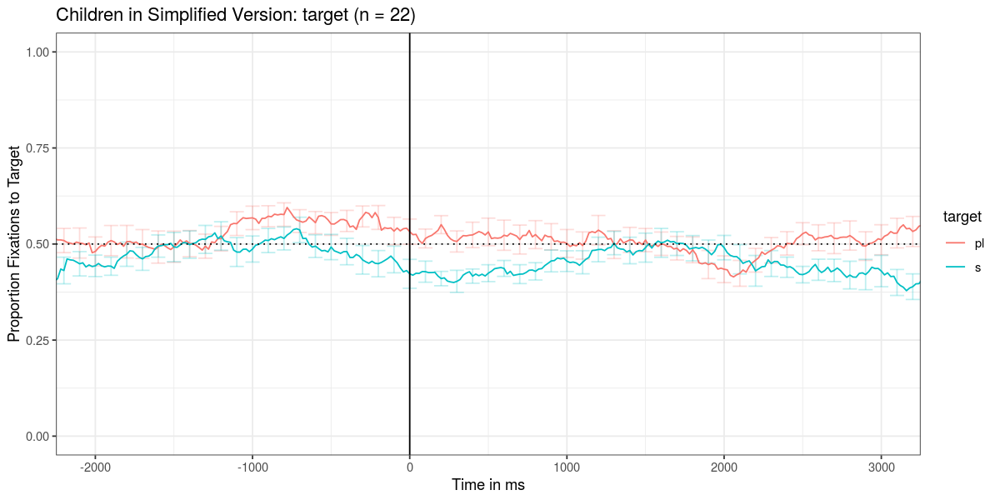

[1] "figures/type=='child'&expt_version=='redblue'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


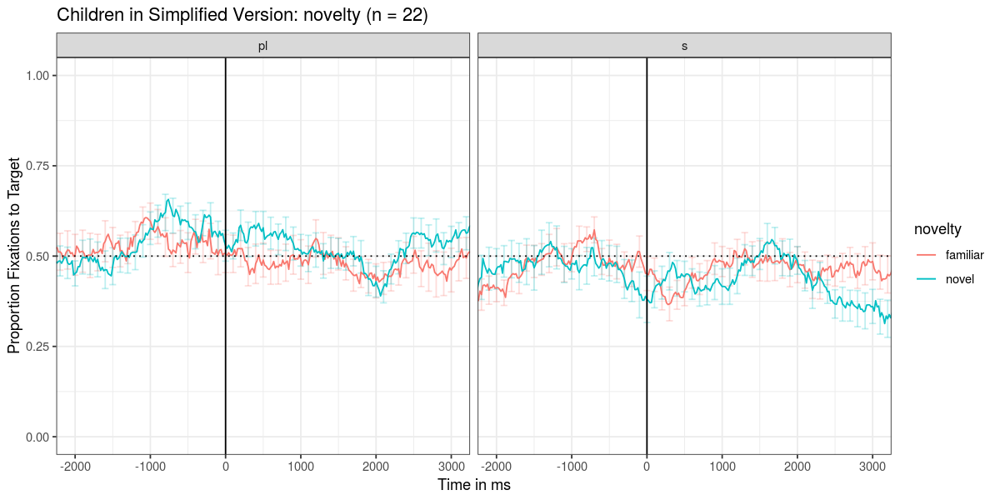

[1] "figures/type=='child'&expt_version=='redblue'_animacystatus_~target.pdf"


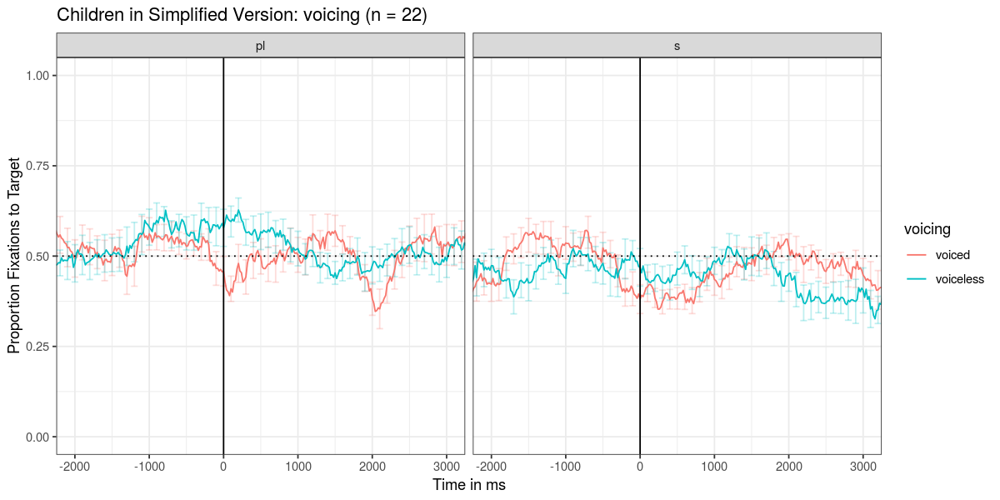

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&expt_version=='redblue'_nullgroup_~label_at_onset.pdf"


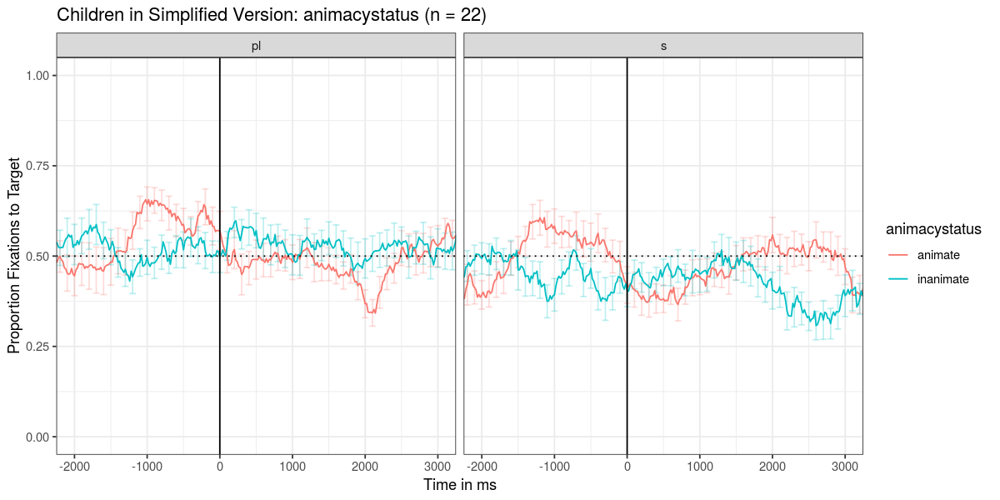

[1] "facet clause:"
[1] "~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + first3"
[1] "figures/type=='child'&expt_version=='redblue'_nullgroup_~first3.pdf"


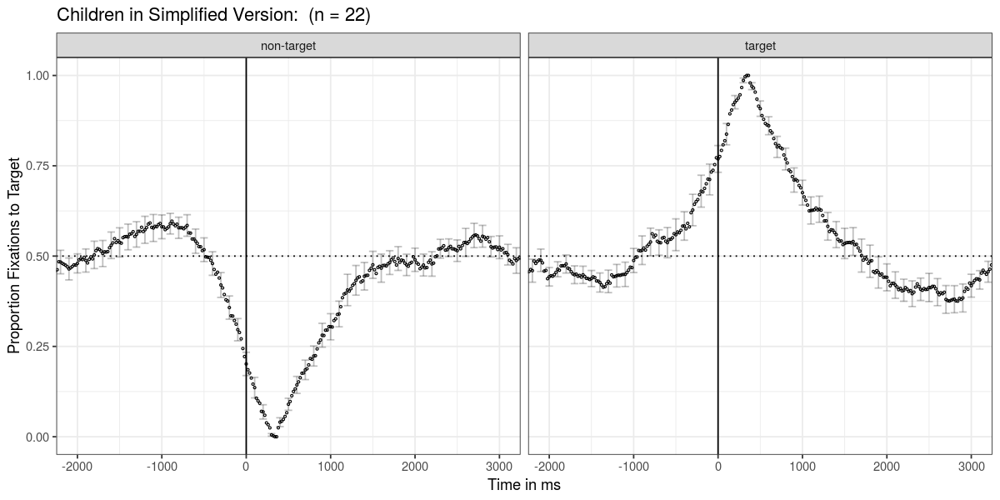

[1] "facet clause:"
[1] "target ~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target+first3"
[1] "figures/type=='child'&expt_version=='redblue'_nullgroup_target~first3.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


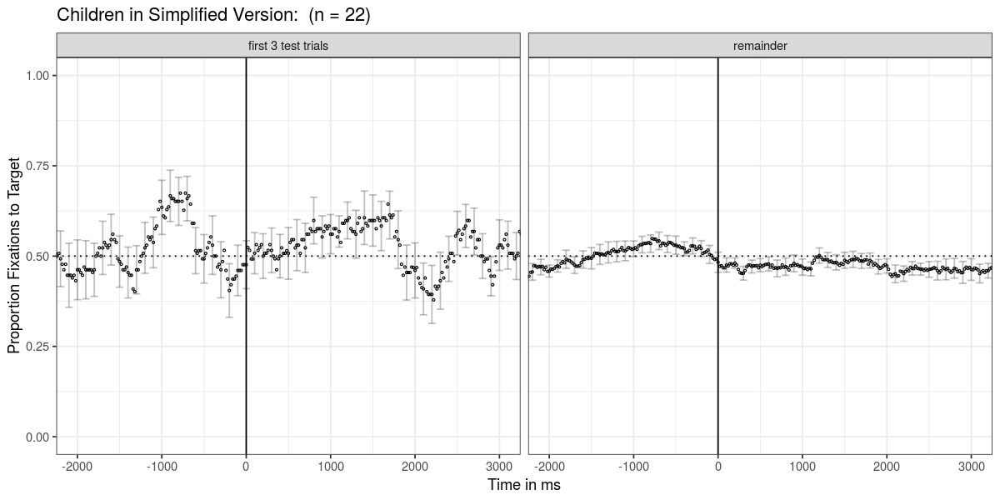

[1] "figures/type=='child'&expt_version=='redblue'_target_~novelty.pdf"


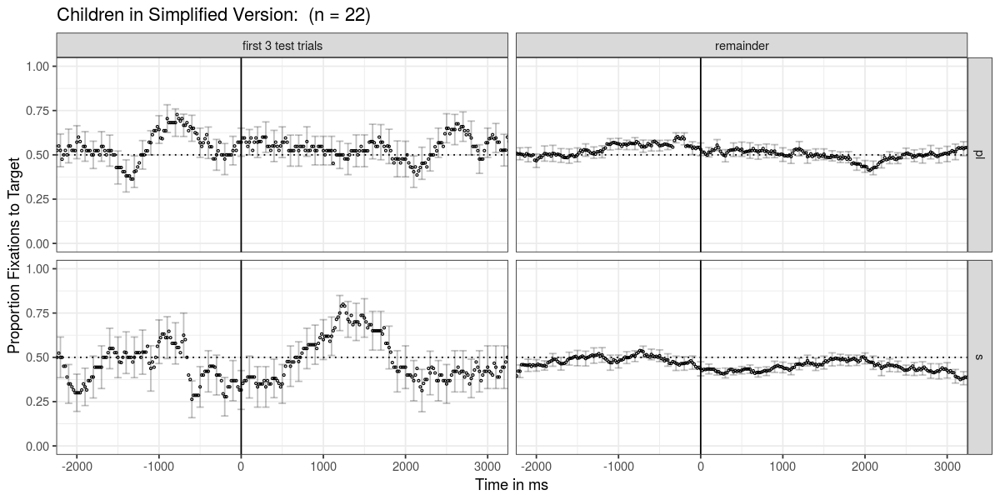

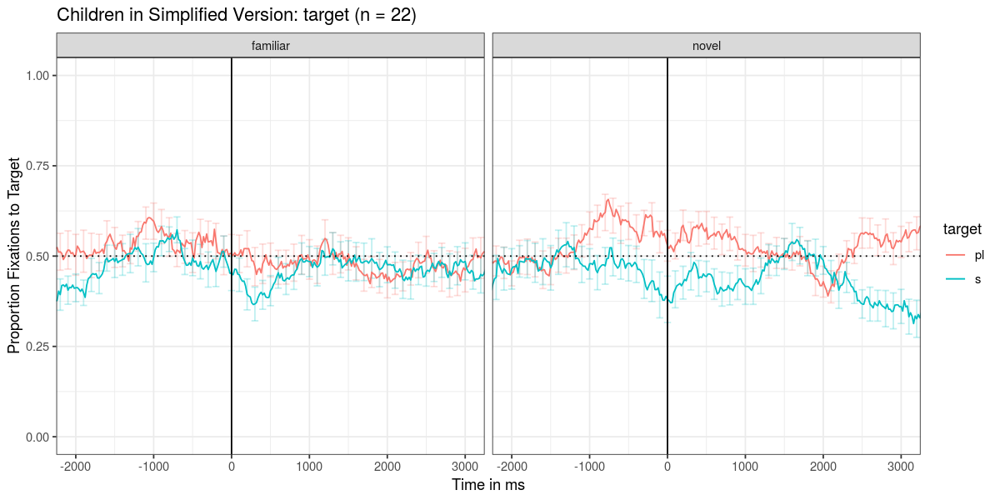

In [94]:
source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & expt_version == 'redblue'",
    mean_pp_duration = NULL, group_title = 'Children in Simplified Version', save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


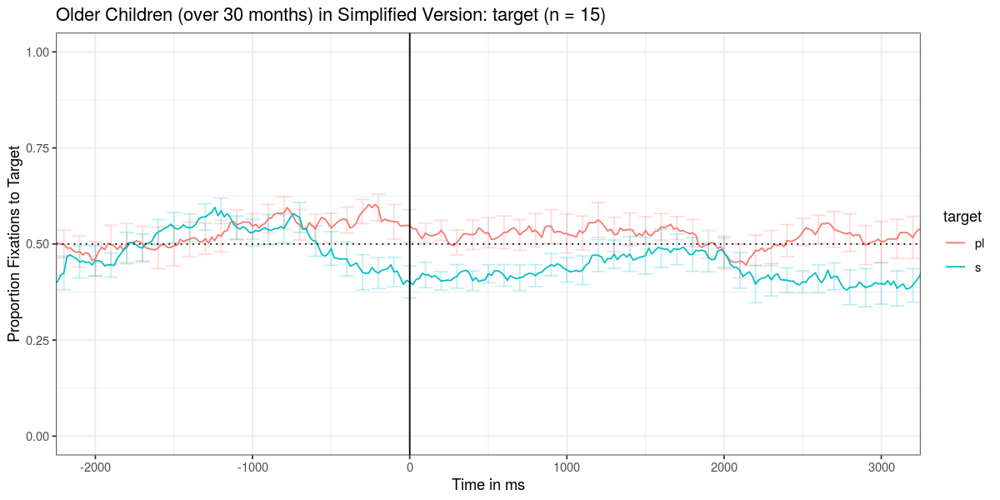

[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


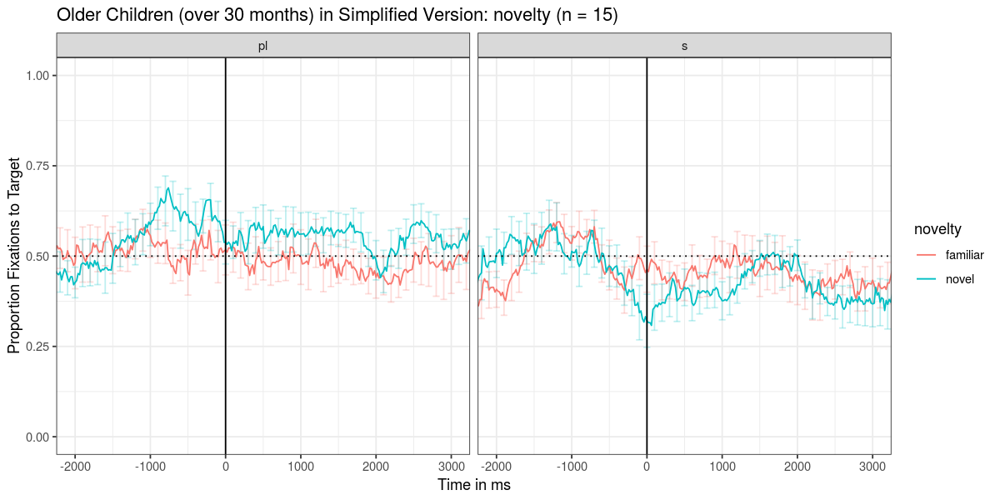

[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_animacystatus_~target.pdf"


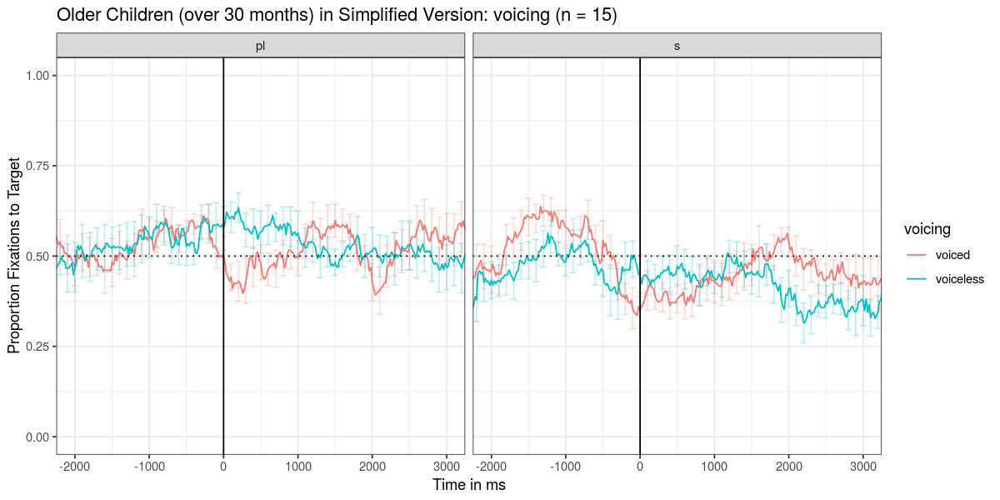

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_nullgroup_~label_at_onset.pdf"


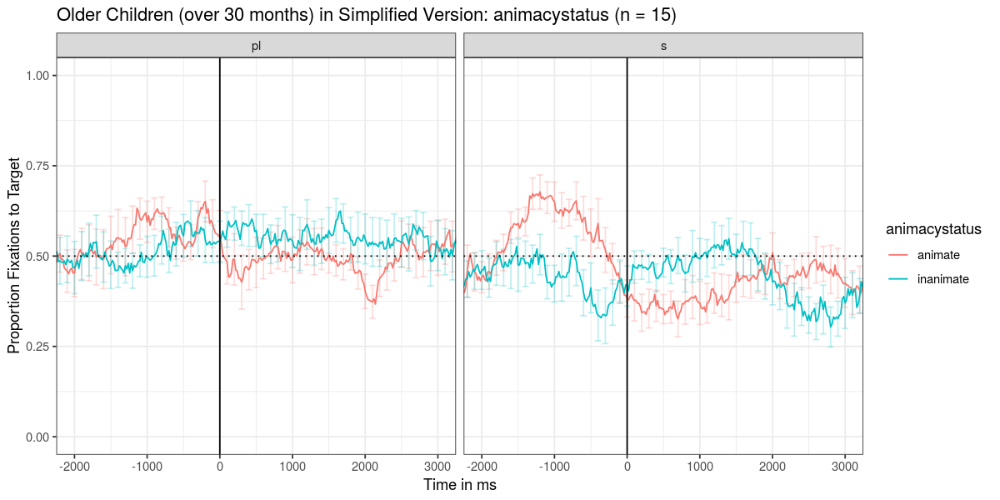

[1] "facet clause:"
[1] "~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + first3"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_nullgroup_~first3.pdf"


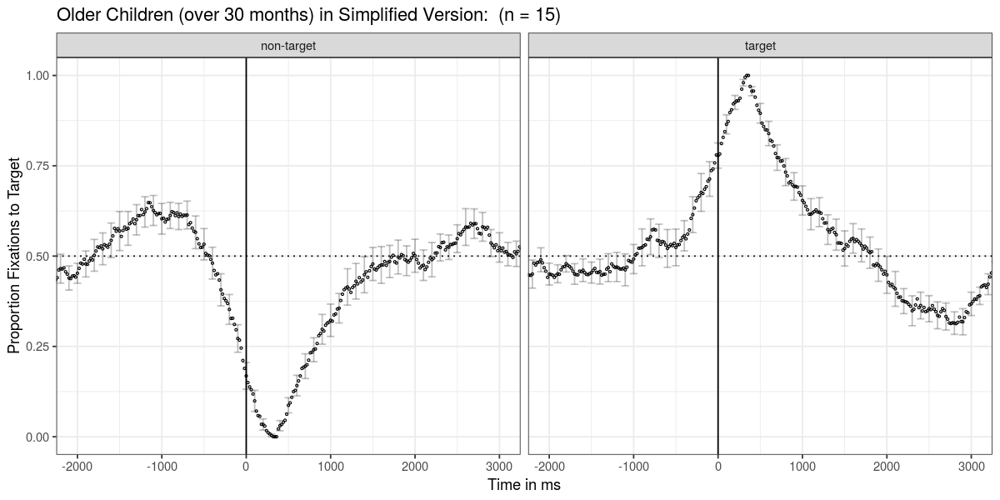

[1] "facet clause:"
[1] "target ~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target+first3"
[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_nullgroup_target~first3.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


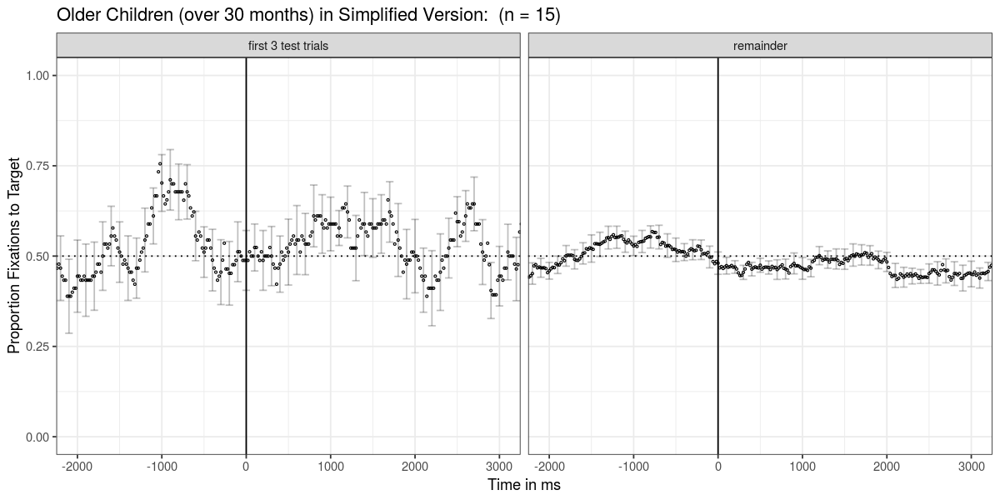

[1] "figures/type=='child'&age_in_days>=915&expt_version=='redblue'_target_~novelty.pdf"


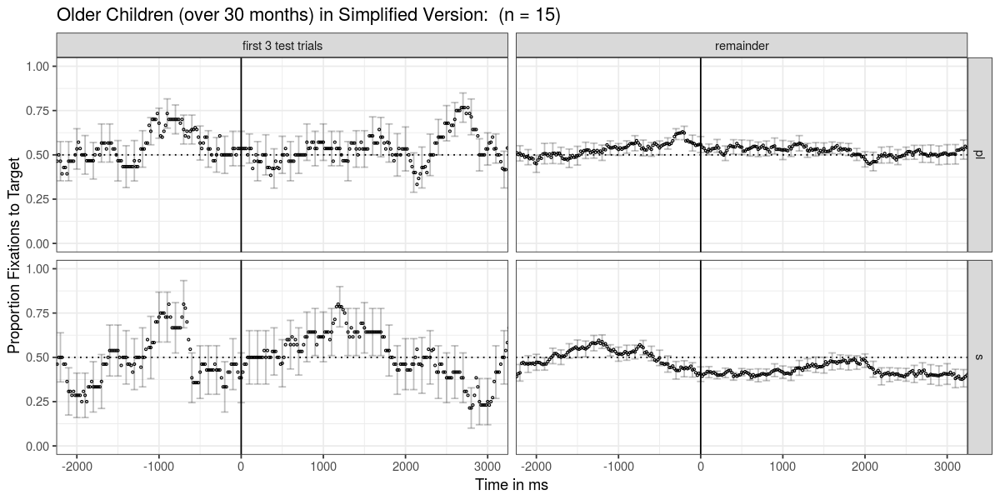

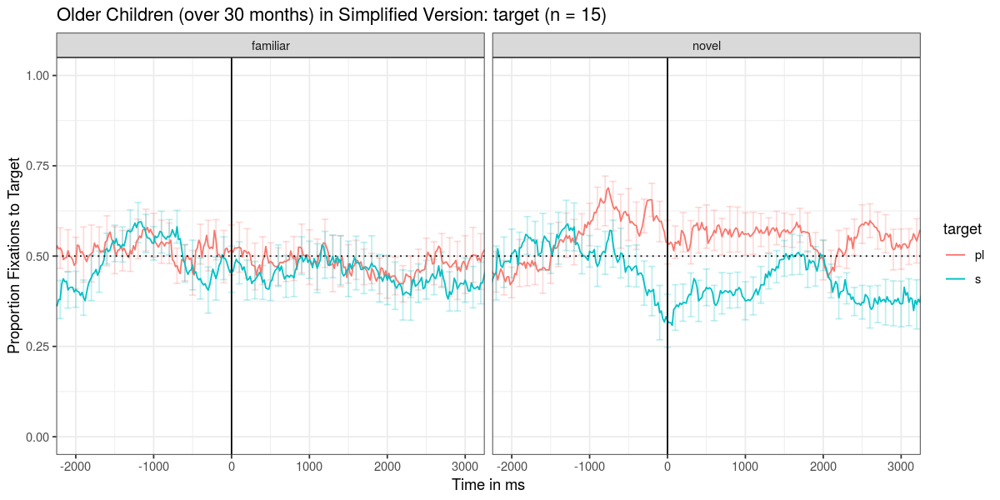

In [95]:
source('PLEARN_analysis_helper.R')
getGroupPlots(ed_df, filter_clause = "type == 'child' & age_in_days >= 915 & expt_version == 'redblue'",
    mean_pp_duration = NULL, 
              group_title = 'Older Children (over 30 months) in Simplified Version',
             save_plot=T)

[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_target_.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + novelty + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_novelty_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + voicing + target"


Warning message:
“Ignoring unknown parameters: shape”


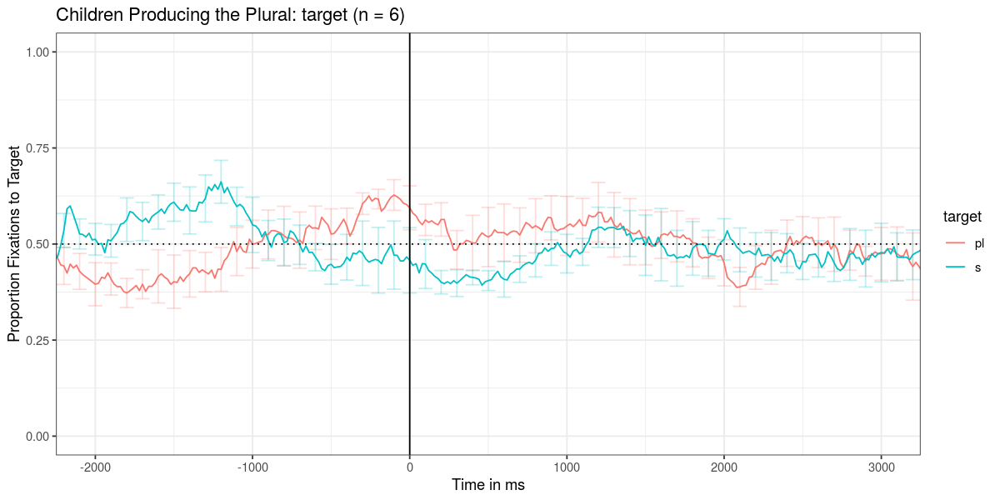

[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_voicing_~target.pdf"
[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + animacystatus + target"


Warning message:
“Ignoring unknown parameters: shape”


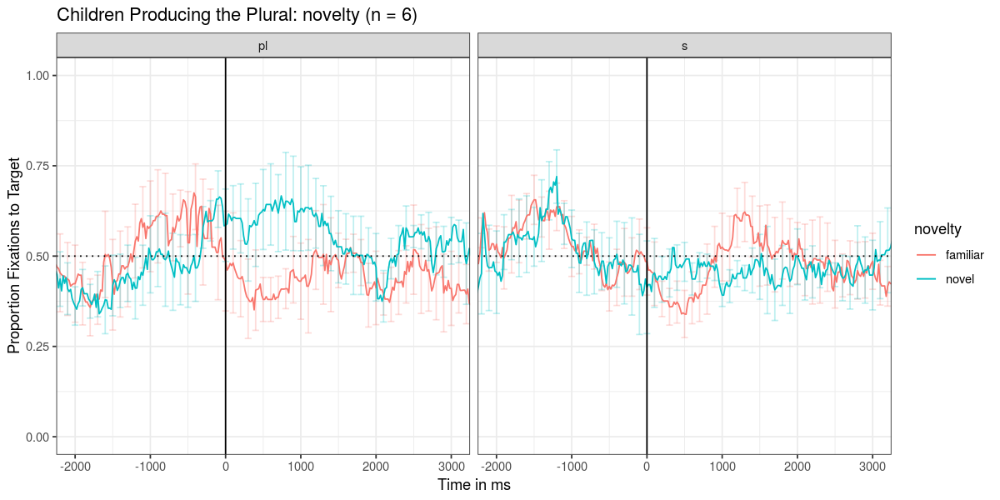

[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_animacystatus_~target.pdf"


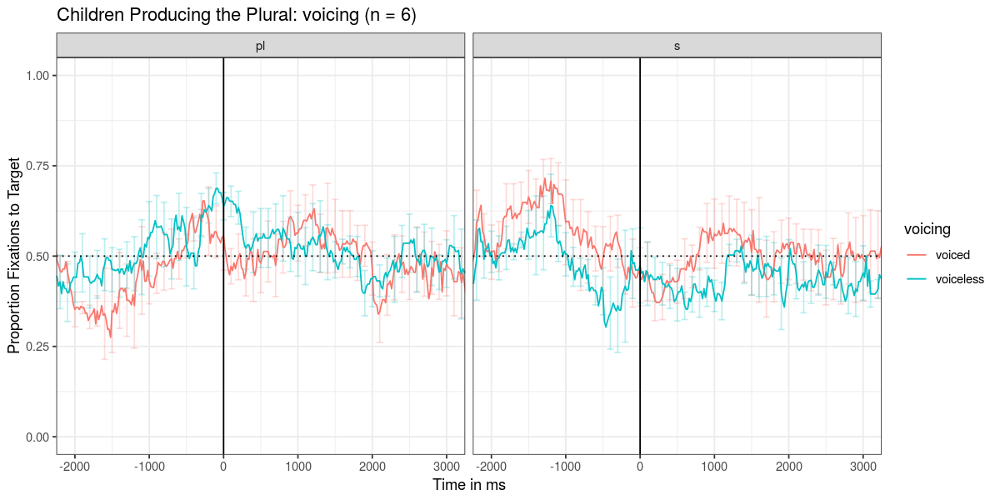

[1] "facet clause:"
[1] "~ label_at_onset"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + label_at_onset"
[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_nullgroup_~label_at_onset.pdf"


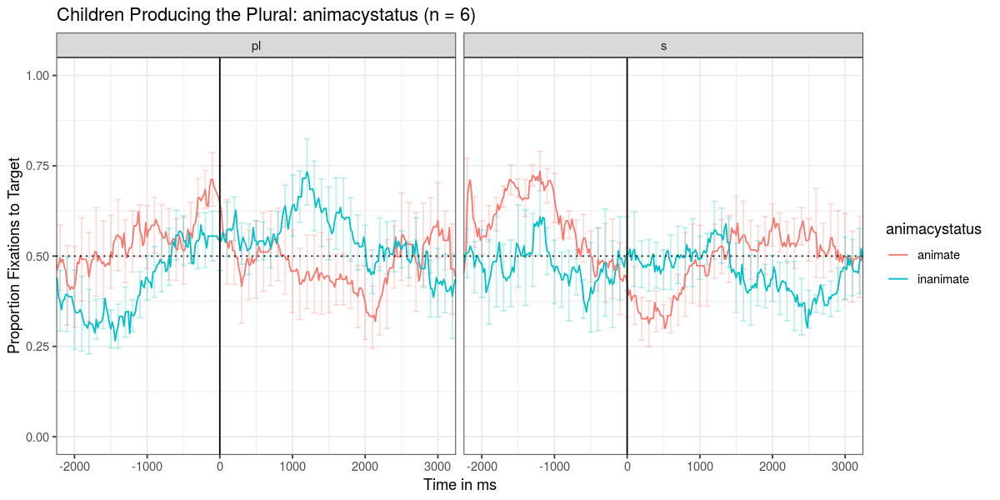

[1] "facet clause:"
[1] "~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + first3"
[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_nullgroup_~first3.pdf"


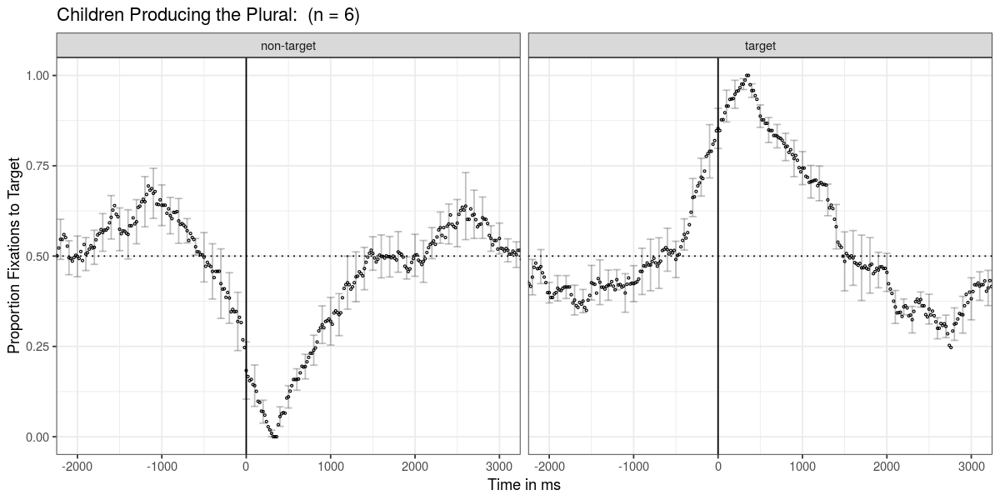

[1] "facet clause:"
[1] "target ~ first3"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target+first3"
[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_nullgroup_target~first3.pdf"
[1] "facet clause:"
[1] "~ novelty"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + novelty"


Warning message:
“Ignoring unknown parameters: shape”


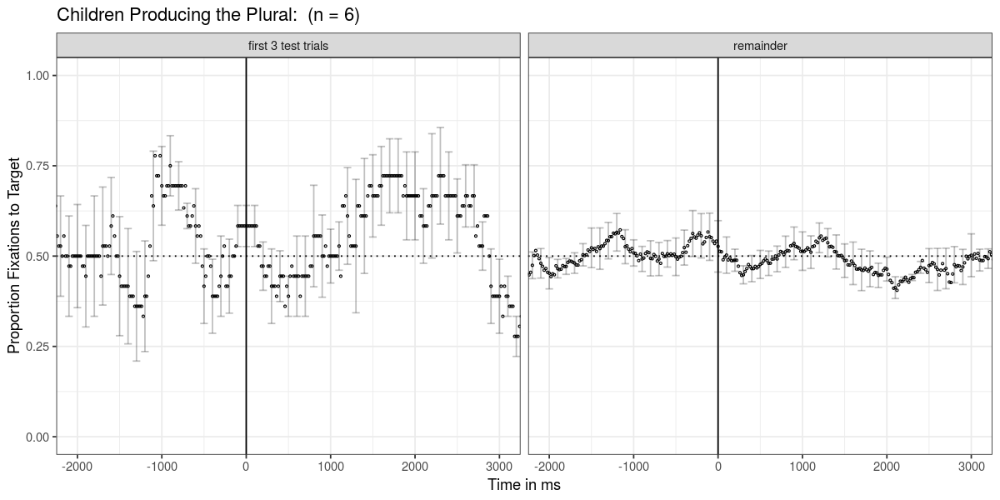

[1] "figures/type=='child'&expt_version=='redblue'&\nbroad_score>.5_target_~novelty.pdf"


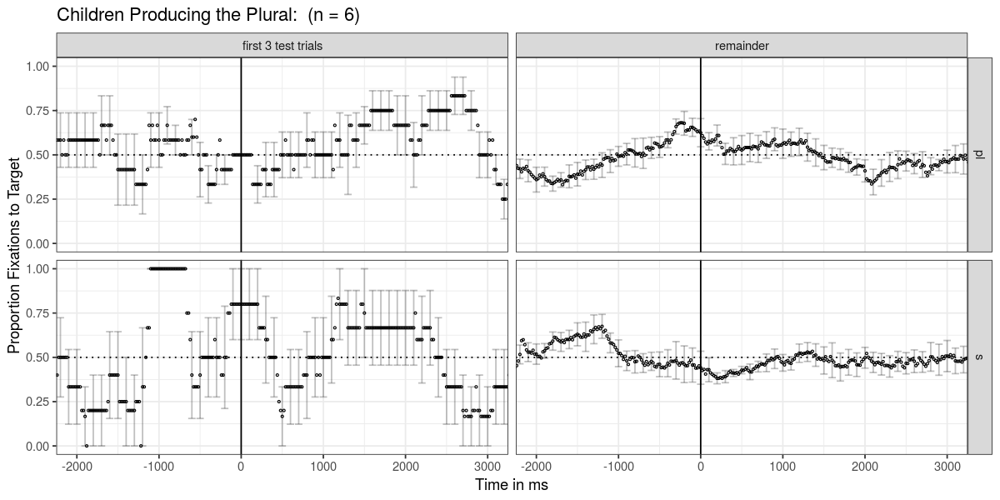

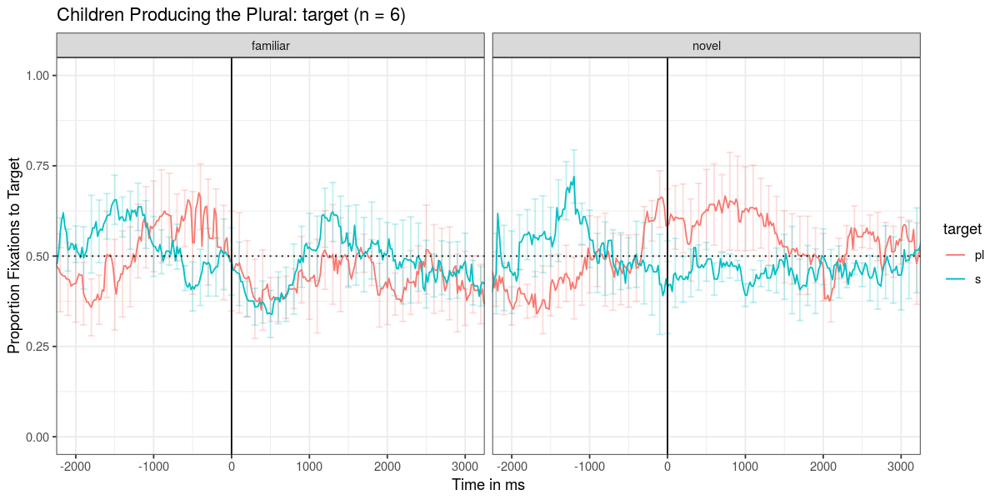

In [96]:
## source('PLEARN_analysis_helper.R')
options(repr.plot.width=6, repr.plot.height=6)
getGroupPlots(ed_df, filter_clause = "type == 'child' & expt_version == 'redblue' &
broad_score > .5",
    mean_pp_duration = NULL, group_title = 'Children Producing the Plural', save_plot=T)

# Comparison Between Experiments

[1] "facet clause:"
[1] "~ target"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + expt_version + target"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'_expt_version_~target.pdf"


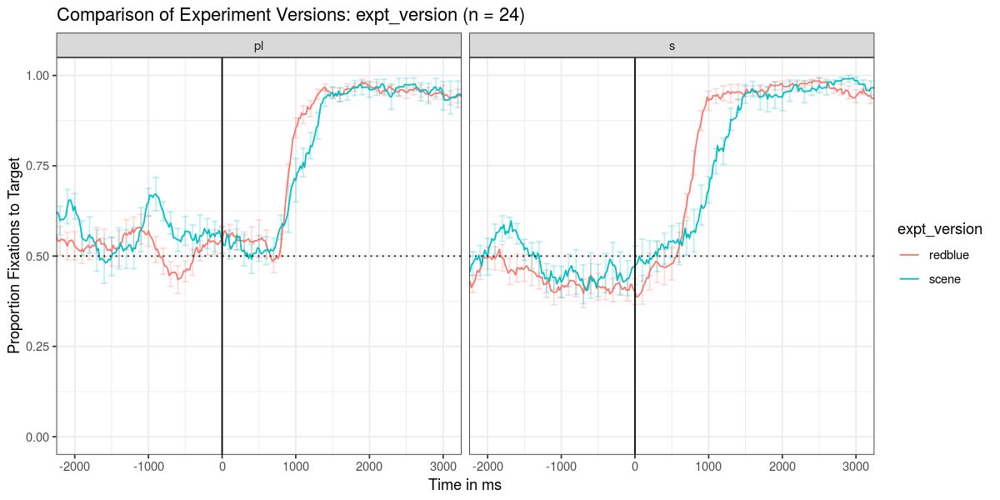

In [97]:
getGroupPlot(ed_df, 
        grouping_var = 'expt_version',
        filter_clause = "type == 'adult'",             
        facet_clause = '~ target',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 3000,
        mean_pp_duration= NULL,
        delay_ms= 367, 
        group_title = "Comparison of Experiment Versions",
        save_plot=T)

[1] "facet clause:"
[1] "~ expt_version"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + expt_version"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='adult'_target_~expt_version.pdf"


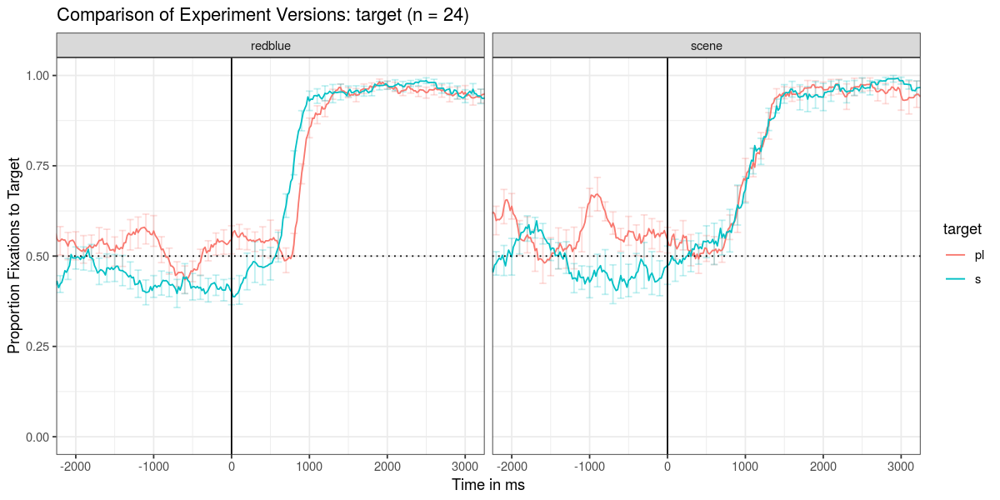

In [98]:
getGroupPlot(ed_df, 
        grouping_var = 'target',
        filter_clause = "type == 'adult'",             
        facet_clause = '~ expt_version',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 3000,
        mean_pp_duration= NULL,
        delay_ms= 367, 
        group_title = "Comparison of Experiment Versions",
        save_plot=T)

[1] "facet clause:"
[1] "~ expt_version"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + expt_version"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/type=='child'_target_~expt_version.pdf"


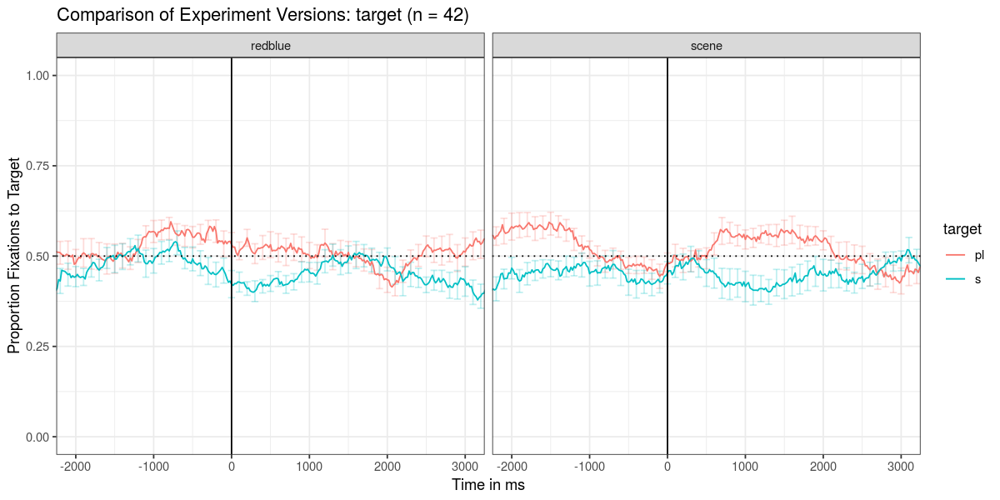

In [99]:
getGroupPlot(ed_df, 
        grouping_var = 'target',
        filter_clause = "type == 'child'",             
        facet_clause = '~ expt_version',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 3000,
        mean_pp_duration= NULL,
        delay_ms= 367, 
        group_title = "Comparison of Experiment Versions",
        save_plot=T)

In [100]:
ed_df$expt_version = factor(ed_df$expt_version, c('scene','redblue'))

[1] "facet clause:"
[1] "~ expt_version"
[1] "Final aggregate statement is:"
[1] "cfial_bin ~ Time + target + type + expt_version"


Warning message:
“Ignoring unknown parameters: shape”


[1] "figures/_target_~expt_version.pdf"


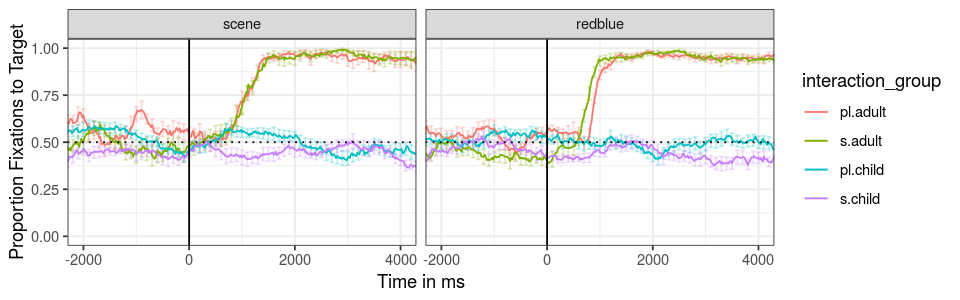

In [101]:
source('PLEARN_analysis_helper.R')
getGroupPlot(ed_df, 
        grouping_var = 'target',
        linetype_var = 'type',
        facet_clause = '~ expt_version',
        facet_type = 'wrap',
        loessSpan=.2, 
        x_start = -2000,
        x_end = 4000,
        mean_pp_duration= NULL,
        delay_ms= 367, 
        group_title = NULL,
        save_plot=T,
        plot_size = c(8,2.5))

In [102]:
length(unique(subset(ed_df, type == 'child' & expt_version == 'redblue')$participant_name))
length(unique(subset(ed_df, type == 'child' & expt_version == 'scene')$participant_name))

[1] 22

[1] 20

# Trial Level Data

In [103]:
source('PLEARN_analysis_helper.R')
ed_df_include = subset(ed_df, !exclude_trial & include_eyetracking) #exclude trials here
by_participant = split(ed_df_include, ed_df_include$filename)
trial_scores = do.call('rbind.fill', lapply(by_participant, function(fixbin_df){
        test_participant_receptive_knowledge(fixbin_df, 
            normalizeMethod="preceding", end_analysis_window= 4000, return_type = 'ltt')
}))    
#[ ] trial level results are yielded BEFORE yoking; should stop on that param combination
trial_scores$expt_index = as.numeric(trial_scores$expt_index)

In [104]:
trial_scores = merge(trial_scores, subject_info[,c('participant_name','age_in_months')])
trial_scores$age_in_months_c = trial_scores$age_in_months - 30

In [105]:
trial_scores[1,]

,participant_name,expt_index,novelty,voicing,animacystatus,dummy,s_form,participant_type,target,expt_version,is_looking_at_target_after,is_looking_at_distractor,is_looking_at_target_before,is_looking_at_target,thresholded,age_in_months,age_in_months_c
,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>
1,adultpl01,10,familiar,voiceless,inanimate,1,plate,adult,s,redblue,0.8603352,0.1396648,0.4255319,0.4348033,FALSE,NA,NA


In [106]:
binarize = function(x, levels=NULL){ 
    if (is.null(levels)){
        x = factor(x)
    } else {
        x = factor(x, levels=levels)
    }
    bins = levels(as.factor(x))
    print(bins)
    rv = -.5
    rv[x == bins[1]] = -.5
    rv[x == bins[2]] = .5
    return(rv)
}

In [107]:
study1_lm_data = subset(trial_scores, participant_type == "child" & expt_version=='scene')
study1_lm_data$novelty = binarize(study1_lm_data$novelty,c('familiar','novel'))
study1_lm_data$voicing = binarize(study1_lm_data$voicing,c('voiceless','voiced'))
study1_lm_data$animacystatus = binarize(study1_lm_data$animacystatus, c('inanimate',
    'animate'))
study1_lm_data$target = binarize(study1_lm_data$target, c('s','pl'))
# https://stats.stackexchange.com/questions/242109/model-failed-to-converge-warning-in-lmer
# per-subject random slopes for novelty etc: each child has a different proposensity for
# the two classes, which is drawn for a Gaussian

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  
[1] "s"  "pl"


In [108]:
head(study1_lm_data)

,participant_name,expt_index,novelty,voicing,animacystatus,dummy,s_form,participant_type,target,expt_version,is_looking_at_target_after,is_looking_at_distractor,is_looking_at_target_before,is_looking_at_target,thresholded,age_in_months,age_in_months_c
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<dbl>,<dbl>
885,pl00,10,-0.5,-0.5,-0.5,1,plate,child,-0.5,scene,0.2413793,0.75862069,0.5317919,-0.29041260,FALSE,25.21311,-4.786885
886,pl00,11,-0.5,-0.5,0.5,1,ant,child,0.5,scene,0.0000000,1.00000000,0.5822785,-0.58227848,FALSE,25.21311,-4.786885
887,pl00,12,0.5,0.5,0.5,1,kib,child,0.5,scene,0.4078212,0.59217877,0.5796178,-0.17179661,FALSE,25.21311,-4.786885
888,pl00,13,0.5,-0.5,-0.5,1,nop,child,-0.5,scene,0.5872093,0.41279070,0.9371069,-0.34989762,FALSE,25.21311,-4.786885
889,pl00,14,-0.5,0.5,0.5,1,frog,child,-0.5,scene,1.0000000,0.00000000,0.1180124,0.88198758,TRUE,25.21311,-4.786885
890,pl00,15,0.5,0.5,-0.5,1,pib,child,0.5,scene,0.9550562,0.04494382,0.8944099,0.06064624,FALSE,25.21311,-4.786885


In [216]:
####BRMS for study 1. Takes 5 mins 
system.time(study1_brm <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty*voicing*animacystatus*target
         | participant_name) +(target * age_in_months_c|
        s_form),study1_lm_data,family="gaussian",seed=1))

# novelty*voicing*animacystatus don't vary within a lemma
# is this a way to get the "average" across items, not asking about the participants
# avg population behavior in the items taken in this way? 

Compiling the C++ model

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL 'a71ce91984f37d24bc96c201d3baa4d6' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000761 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 7.61 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 62.538 seconds (Warm-up)
Chain 1:                17.9554 seconds (Sampling)
Ch

   user  system elapsed 
399.192   2.140 401.403 

In [184]:
study1_eyetracking_effects =as.data.frame(fixef(study1_brm))
subset(study1_eyetracking_effects, Q2.5 > 0 |  Q97.5 < 0)

Estimate,Est.Error,Q2.5,Q97.5
<dbl>,<dbl>,<dbl>,<dbl>


In [185]:
study2_lm_data = subset(trial_scores, participant_type == "child" & expt_version=='redblue')
study2_lm_data$novelty = binarize(study2_lm_data$novelty,c('familiar','novel'))
study2_lm_data$voicing = binarize(study2_lm_data$voicing,c('voiceless','voiced'))
study2_lm_data$animacystatus = binarize(study2_lm_data$animacystatus, c('inanimate',
    'animate'))
study2_lm_data$target = binarize(study2_lm_data$target,c('s','pl'))

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  
[1] "s"  "pl"


In [112]:
# used to bounce data to RL on 1/30
#write.csv(study2_lm_data, 'csv/study2_eyetracking_data.csv', row.names=F)

In [186]:
####BRMS for study 2.
system.time(study2_brm <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty*voicing*animacystatus*target
         | participant_name) +(target * age_in_months_c |
        s_form),study2_lm_data,family="gaussian",seed=1))

Compiling the C++ model

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL 'a71ce91984f37d24bc96c201d3baa4d6' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000951 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 9.51 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 70.4744 seconds (Warm-up)
Chain 1:                19.7397 seconds (Sampling)
C

   user  system elapsed 
436.896   2.140 439.104 

In [114]:
# ####BRMS for study 2. Takes ~ 5 mins 
# system.time(study2_brm <- brm(is_looking_at_target~novelty*voicing*animacystatus*target*age_in_months_c
#         + expt_index + (target|participant_name) +(novelty*voicing*animacystatus*target|
#         s_form),study2_lm_data,family="gaussian",seed=1))

In [236]:
(hyp2 <- hypothesis(study2_brm, c("animacystatus:target = 0", "Intercept = 0"),
                    alpha = 0.01))

Hypothesis Tests for class b:
                Hypothesis Estimate Est.Error CI.Lower CI.Upper Evid.Ratio
1 (animacystatus:ta... = 0    -0.13      0.06    -0.27     0.02         NA
2          (Intercept) = 0     0.02      0.04    -0.09     0.12         NA
  Post.Prob Star
1        NA     
2        NA     
---
'CI': 98%-CI for one-sided and 99%-CI for two-sided hypotheses.
'*': For one-sided hypotheses, the posterior probability exceeds 99%;
for two-sided hypotheses, the value tested against lies outside the 99%-CI.
Posterior probabilities of point hypotheses assume equal prior probabilities.

In [235]:
(hyp2 <- hypothesis(study2_brm, c("animacystatus:age_in_months_c = 0", "Intercept = 0"),
                    alpha = 0.01))

Hypothesis Tests for class b:
                Hypothesis Estimate Est.Error CI.Lower CI.Upper Evid.Ratio
1 (animacystatus:ag... = 0    -0.02      0.01    -0.04     0.00         NA
2          (Intercept) = 0     0.02      0.04    -0.09     0.12         NA
  Post.Prob Star
1        NA     
2        NA     
---
'CI': 98%-CI for one-sided and 99%-CI for two-sided hypotheses.
'*': For one-sided hypotheses, the posterior probability exceeds 99%;
for two-sided hypotheses, the value tested against lies outside the 99%-CI.
Posterior probabilities of point hypotheses assume equal prior probabilities.

In [189]:
summary(study2_brm)

 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: is_looking_at_target ~ novelty * voicing * animacystatus * target * age_in_months_c + expt_index + (novelty * voicing * animacystatus * target | participant_name) + (target * age_in_months_c | s_form) 
   Data: study2_lm_data (Number of observations: 584) 
Samples: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup samples = 4000

Group-Level Effects: 
~participant_name (Number of levels: 22) 
                                                                        Estimate
sd(Intercept)                                                               0.06
sd(novelty)                                                                 0.07
sd(voicing)                                                                 0.10
sd(animacystatus)                                                           0.05
sd(target)                                                                  0.06
sd(novelty:vo

In [209]:
source('PLEARN_analysis_helper.R')
eyetracking_lm_fixed_effects = rbind(prepModelForDWPlot(study2_brm) %>% mutate(model = "Study 2"),
prepModelForDWPlot(study1_brm) %>% mutate(model = "Study 1")) 

In [214]:
eyetracking_lm_fixed_effects

Estimate,Est.Error,Q2.5,Q97.5,term,group,interaction,sig,model
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<lgl>,<chr>
0.0162285118,0.039818731,-0.060753541,0.094625130,Intercept,fixed,FALSE,FALSE,Study 2
-0.0189124229,0.033789513,-0.086505138,0.045813851,novelty,fixed,FALSE,FALSE,Study 2
0.0155669187,0.036911904,-0.056186076,0.089306578,voicing,fixed,FALSE,FALSE,Study 2
0.0188903951,0.030914259,-0.041068695,0.081214961,animacystatus,fixed,FALSE,FALSE,Study 2
0.0009097348,0.031205266,-0.061728104,0.061790161,target,fixed,FALSE,FALSE,Study 2
0.0014779912,0.005007688,-0.008722097,0.011321024,age_in_months_c,fixed,FALSE,FALSE,Study 2
-0.0012253338,0.001755980,-0.004592080,0.002275660,expt_index,fixed,FALSE,FALSE,Study 2
0.0480225422,0.066765385,-0.085483812,0.181860658,novelty:voicing,fixed,TRUE,FALSE,Study 2
0.0649452858,0.061030601,-0.056316011,0.183708391,novelty:animacystatus,fixed,TRUE,FALSE,Study 2


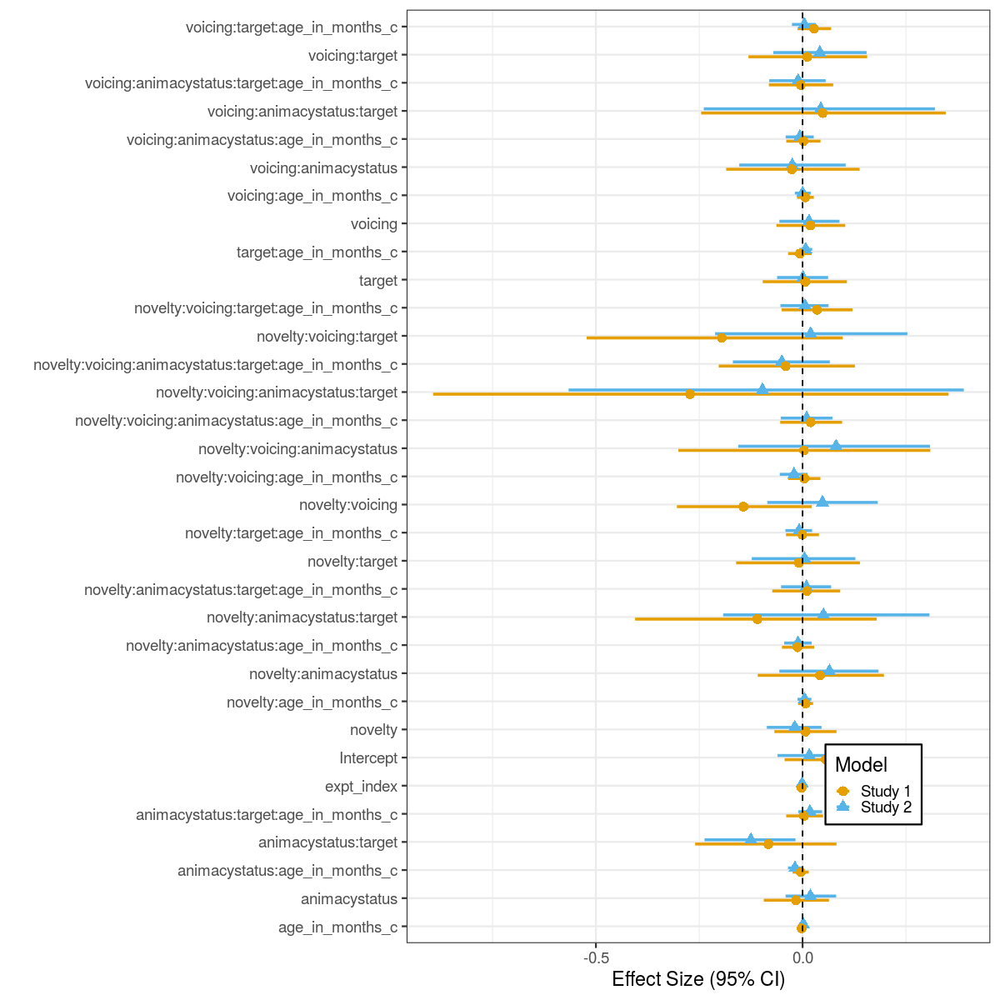

In [210]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(as.data.frame(eyetracking_lm_fixed_effects) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=14
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI)'
    ) + ylab('')  + scale_color_manual(values=c("#E69F00", "#56B4E9"), name = "Model"
    ) +  scale_shape_discrete(name = "Model") + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black"))

In [ ]:
eyetracking_lm_fixed_effects = eyetracking_lm_fixed_effects %>% filter(!interaction)

In [188]:
eyetracking_lm_fixed_effects

Estimate,Est.Error,Q2.5,Q97.5,term,group,interaction,sig,model
<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<lgl>,<chr>
0.0162285118,0.039818731,-0.060753541,0.094625130,Intercept,fixed,FALSE,FALSE,Study 2
-0.0189124229,0.033789513,-0.086505138,0.045813851,novelty,fixed,FALSE,FALSE,Study 2
0.0155669187,0.036911904,-0.056186076,0.089306578,voicing,fixed,FALSE,FALSE,Study 2
0.0188903951,0.030914259,-0.041068695,0.081214961,animacystatus,fixed,FALSE,FALSE,Study 2
0.0009097348,0.031205266,-0.061728104,0.061790161,target,fixed,FALSE,FALSE,Study 2
0.0014779912,0.005007688,-0.008722097,0.011321024,age_in_months_c,fixed,FALSE,FALSE,Study 2
-0.0012253338,0.001755980,-0.004592080,0.002275660,expt_index,fixed,FALSE,FALSE,Study 2
0.0561937250,0.050302505,-0.043480096,0.154563214,Intercept,fixed,FALSE,FALSE,Study 1
0.0073999644,0.038424623,-0.068316353,0.082046527,novelty,fixed,FALSE,FALSE,Study 1


In [190]:
relabel_terms = function(df, colname){
    remap = list()
    remap[['Intercept']] = 'Intercept'
    remap[['novelty']] = "Novelty\n(familiar vs. novel)"
    remap[['voicing']] = "Voicing\n(/s/ vs. /z/)"
    remap[['animacystatus']] = "Animacy\n(inanimate vs. animate)"
    remap[['target']] = "Target\n(singular vs. plural)"
    remap[['expt_index']] = "Trial Order"
    remap[['age_in_months_c']] = "Child Age\n(in months, centered at 30)"
    
    
    df[[colname]] = sapply(df$term, function(x){remap[[x]]})
    df[[colname]] = factor(df[[colname]], levels = rev(c(
        'Intercept',
        "Novelty\n(familiar vs. novel)",
        "Voicing\n(/s/ vs. /z/)",
        "Animacy\n(inanimate vs. animate)",
        "Target\n(singular vs. plural)",
        "Child Age\n(in months, centered at 30)",        
        "Trial Order"
    )))
    return(df)
}    
eyetracking_lm_fixed_effects = relabel_terms(eyetracking_lm_fixed_effects,'term')

In [215]:
fixef(study1_brm)

,Estimate,Est.Error,Q2.5,Q97.5
Intercept,0.0561937250,0.050302505,-0.043480096,0.154563214
novelty,0.0073999644,0.038424623,-0.068316353,0.082046527
voicing,0.0192038851,0.042255038,-0.063428149,0.103202370
animacystatus,-0.0157797295,0.039741600,-0.093940132,0.063827173
target,0.0062303302,0.052210968,-0.096415404,0.107240405
age_in_months_c,-0.0019867443,0.004706642,-0.011197295,0.007247644
expt_index,-0.0022950175,0.002330767,-0.006802331,0.002548943
novelty:voicing,-0.1429986126,0.082318762,-0.304019678,0.022267758
novelty:animacystatus,0.0421053953,0.078071373,-0.108490327,0.196809983
voicing:animacystatus,-0.0257644237,0.083038199,-0.184967945,0.138055637


In [219]:
subset(fixef(study1_brm), (study1_brm$Q2.5 > 0 | study1_brm$Q97.5 < 0))
subset(fixef(study2_brm), (study2_brm$Q2.5 > 0 | study2_brm$Q97.5 < 0))

Estimate,Est.Error,Q2.5,Q97.5


Estimate,Est.Error,Q2.5,Q97.5


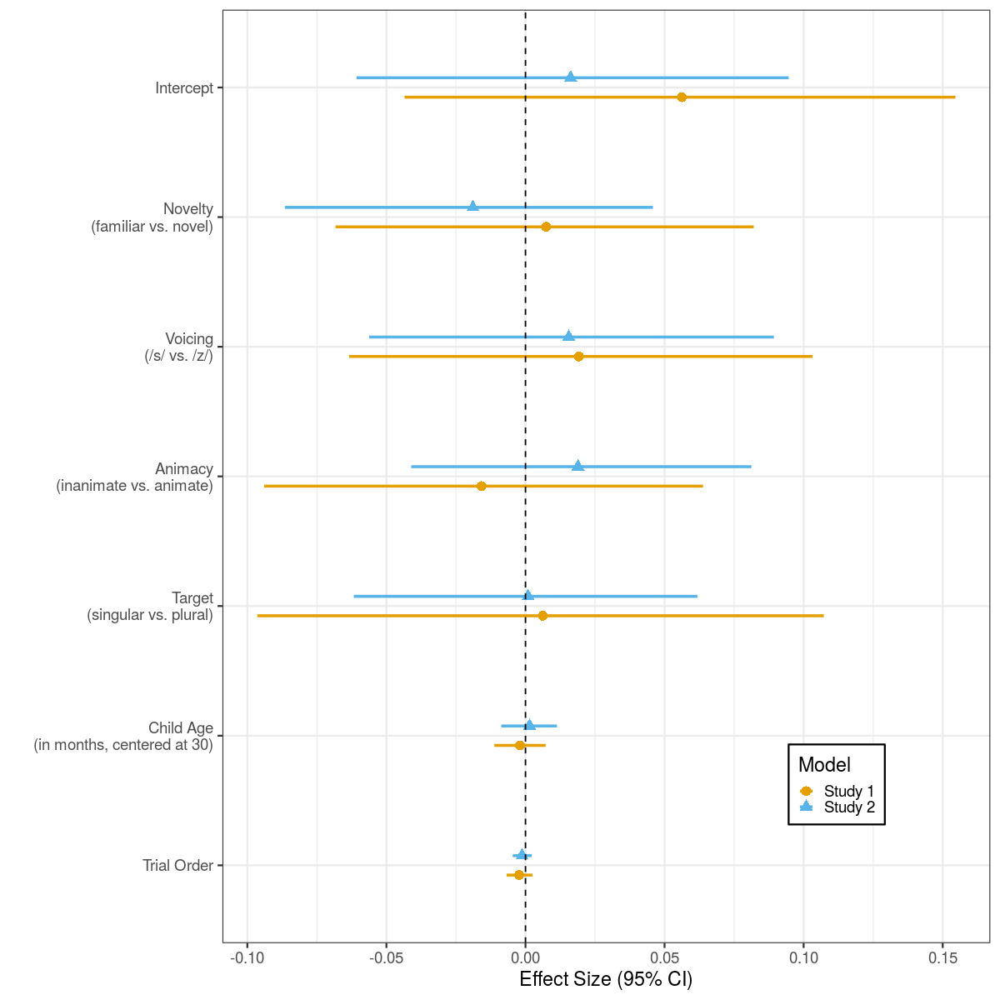

In [192]:
# contrast coded -.5, .5
options(repr.plot.width=10, repr.plot.height=10)
ggplot(as.data.frame(eyetracking_lm_fixed_effects) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=14
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI)'
    ) + ylab('')  + scale_color_manual(values=c("#E69F00", "#56B4E9"), name = "Model"
    ) +  scale_shape_discrete(name = "Model") + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black"))

#ggsave('figures/brms_eyetracking_lmem.pdf', width=5,height=3.2) 


# [X] confirm that Q2.5 has the meaning I expect -- yep, CIs in the original data
# [X] confirm that production model is similar
# [X] try adding age as a predictor (to both?)
# [X] effect size different for continuous vars -- no
# [X] Relabel predictors
# [X] move the label into the graph
# [X] Add age
# [X] copy the color correcting code 
# [ ] make a function for retrieving the estimate and CI 

In [121]:
# options(repr.plot.width=4, repr.plot.height=3)
# regression_df = subset(rbind(study1_lm_aug, study2_lm_aug), group =="fixed")
# regression_df$panel = sapply(regression_df$term, function(x){
#     if (x == 'Intercept'){
#         'intercept'
#     } else {
#         'betas'
#     }
# })

# scales_x <- list(
#   `betas` = scale_x_continuous(limits = c(-.2, .2), breaks = seq(-1, .1, .05)),
#   `intercept` = scale_x_continuous(limits = c(.4, .6), breaks = seq(.4, .6, .05))
# )

# p1 = dwplot(regression_df, conf.level = .95, dot_args = list(aes(shape=model), size=3)
#     )  + geom_vline(xintercept=0, lty=2) 

# p1 = p1 %>% relabel_predictors(c(
#     novelty = "Novelty\n(novel vs. familiar)",
#     voicing = "Voicing\n(/s/ vs. /z/)",
#     animacystatus = "Animacy\n(inanimate vs. animate)",
#     target = "Target\n(singular vs. plural)",
#     expt_index = "Trial Order",
#     `novelty:voicing` = "Novelty x Voicing"
# ))
# print(p1 + theme_bw(base_size=14) + theme(
#     legend.key.size = unit(.4, "cm"),
#     legend.position = c(.8,.5), 
#     legend.background = element_rect(fill="white", linetype="solid", 
#                                   colour ="black"),
#     axis.text.x = element_text(angle = 45, hjust = 1)
#     )  + geom_vline(xintercept=0, lty=2
# )  +
#       labs(color = "") + scale_color_manual(values=c("#E69F00", "#56B4E9")
# ) + labs(
#      color = "Model"
# ) + coord_cartesian(xlim=c(-.25, .5)) + xlab('Effect Size (95% CI)'
# ) +  scale_shape_discrete(name = "Model"))
            
# #  + facet_grid_sc(cols = vars(panel), scales=list(x= scales_x)))+ geom_vline(xintercept=.5, lty=2, color='red')
      

# ggsave('figures/eyetracking_lmem.pdf', width=5,height=3.2) 

In [122]:
# https://stats.idre.ucla.edu/r/library/r-library-contrast-coding-systems-for-categorical-variables/#DEVIATION
# sum contrasts: deviations from th egran mean
# has an effect like contrasting
# http://people.linguistics.mcgill.ca/~morgan/book/practical-regression-topics-1-multi-level-factors-contrast-coding-interactions.html
#for adults:
#novel singular  .3 + 1*-.01 + 1*-.05
#familiar plural  .3 + -1*-.01 + -1*-.05
#b12 * x_1 * x_2, seems weird 

In [193]:
source('texvars.R')
tvc = get_texvar_from_beta(study1_brm, 'voicing','sceneEyetrackingLMvoicing', tvc)
tvc = get_texvar_from_beta(study2_brm, 'voicing','redblueEyetrackingLMvoicing', tvc)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)
# tvc

In [194]:
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

# Intercepts Only Models

Are we committing Type II errors by including so many random slopes?

In [197]:
####BRMS for study 1. Takes 5 mins 
system.time(study1_brm_interceptsOnly <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty+voicing+animacystatus+target
         | participant_name) +(target + age_in_months_c|
        s_form),study1_lm_data,family="gaussian",seed=1))

Compiling the C++ model

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL '80d0f5ab041bedc1dc499d202b4e6df7' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000387 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 3.87 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 28.5661 seconds (Warm-up)
Chain 1:                8.20455 seconds (Sampling)
C

   user  system elapsed 
213.368   2.060 215.512 

In [198]:
####BRMS for study 2. Takes 5 mins 
system.time(study2_brm_interceptsOnly <- brm(is_looking_at_target ~ novelty*voicing*animacystatus*target *
        age_in_months_c + expt_index  + (novelty+voicing+animacystatus+target
         | participant_name) +(target + age_in_months_c|
        s_form),study2_lm_data,family="gaussian",seed=1))

Compiling the C++ model

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL '80d0f5ab041bedc1dc499d202b4e6df7' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000386 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 3.86 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 29.7989 seconds (Warm-up)
Chain 1:                8.75437 seconds (Sampling)
C

   user  system elapsed 
222.252   2.044 224.382 

In [220]:
eyetracking_lm_fixed_effects_interceptsOnly = rbind(prepModelForDWPlot(study1_brm_interceptsOnly
) %>% mutate(model = "Study 1"), prepModelForDWPlot(study2_brm_interceptsOnly) %>% mutate(
model = "Study 2"))

In [221]:
eyetracking_lm_fixed_effects_noIntercepts = relabel_terms(eyetracking_lm_fixed_effects_interceptsOnly,'term')

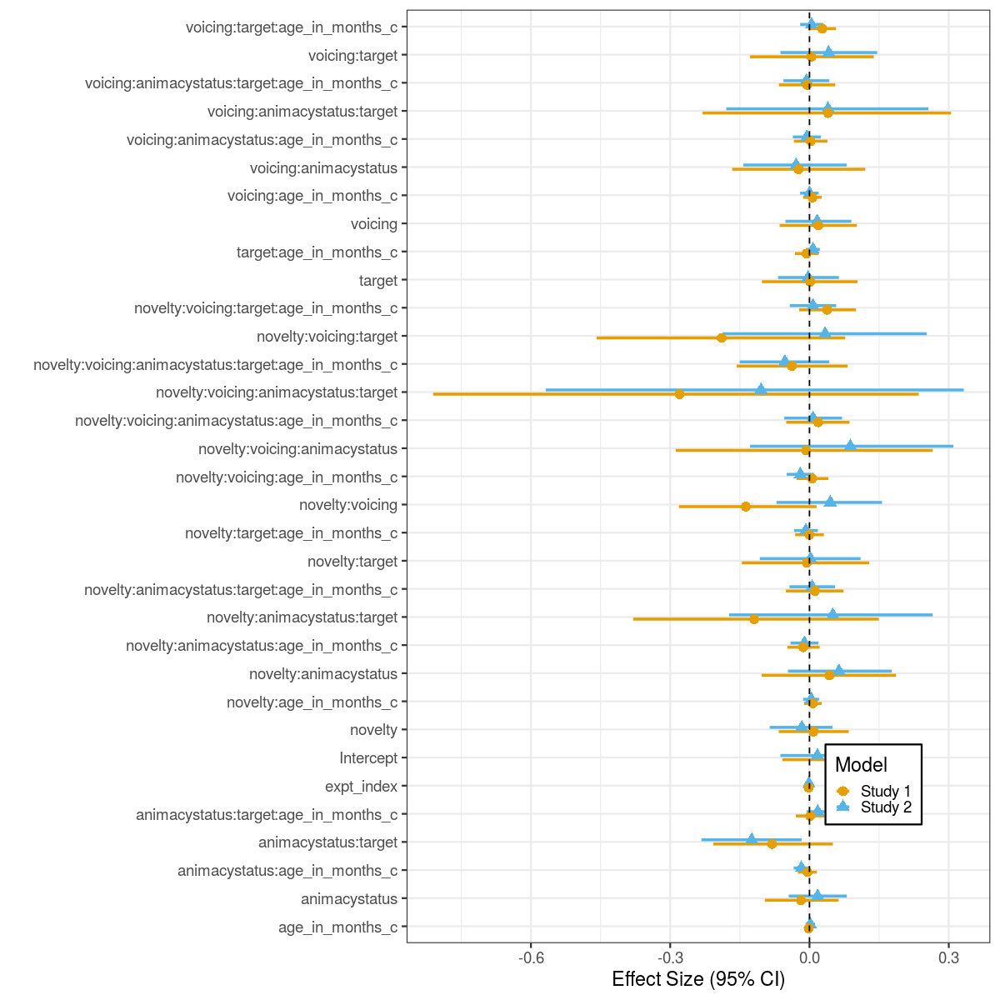

In [223]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(as.data.frame(eyetracking_lm_fixed_effects_interceptsOnly) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=14
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI)'
    ) + ylab('')  + scale_color_manual(values=c("#E69F00", "#56B4E9"), name = "Model"
    ) +  scale_shape_discrete(name = "Model") + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black"))

In [218]:
 subset(as.data.frame(fixef(study2_brm_interceptsOnly)), Q2.5 > 0 |  Q97.5 < 0)

,Estimate,Est.Error,Q2.5,Q97.5
,<dbl>,<dbl>,<dbl>,<dbl>
animacystatus:target,-0.12442764,0.055191338,-0.23272456,-0.0170603719
animacystatus:age_in_months_c,-0.01766061,0.008474151,-0.03418767,-0.0003478569


In [224]:
 subset(as.data.frame(fixef(study1_brm_interceptsOnly)), Q2.5 > 0 |  Q97.5 < 0)

Estimate,Est.Error,Q2.5,Q97.5
<dbl>,<dbl>,<dbl>,<dbl>


# Participant Receptive Scores

In [125]:
source('PLEARN_analysis_helper.R')
normalizeMethods = c('none','yoked','preceding')
all_scores = do.call('rbind.fill', lapply(normalizeMethods, function(normalizeMethod){
    do.call('rbind.fill', lapply(by_participant, function(fixbin_df){
        test_participant_receptive_knowledge(fixbin_df, normalizeMethod, end_analysis_window= 4000)
    }))    
}))

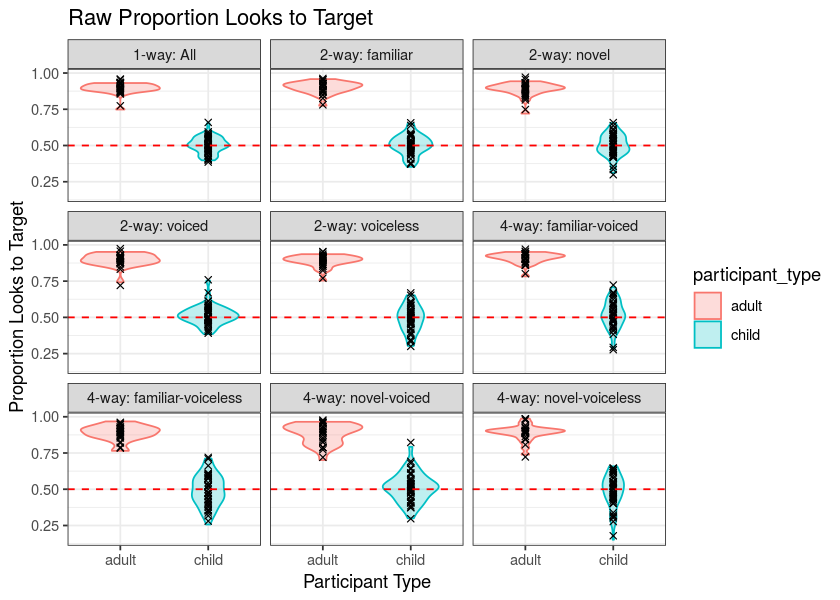

In [126]:
options(repr.plot.width=7, repr.plot.height=5)
ggplot(subset(all_scores, normalizeMethod == 'none')) + geom_violin(
aes(y=prop_looks_to_target, x = participant_type,
colour = participant_type, fill = participant_type), alpha=.25) +
geom_point(aes(x=participant_type, y=prop_looks_to_target), colour ='black',
shape = 4, position=position_jitter(height=.03, width=0)) + facet_wrap(
~partition_name) + theme_bw() + geom_hline(yintercept=.5, 
linetype = 'dashed', colour='red') + ggtitle('Raw Proportion Looks to Target'
) + xlab('Participant Type') + ylab('Proportion Looks to Target') 

The reason to do it this way is to check if a particuar subset of items is above chance, e.g. familiar voicless

In [127]:
# adults first
adult_scores = subset(all_scores, normalizeMethod == 'preceding' & participant_type=='adult' & 
       contrast_type=='1-way')
shapiro.test(subset(adult_scores, expt_version == 'scene')$prop_looks_to_target)
shapiro.test(subset(adult_scores, expt_version == 'redblue')$prop_looks_to_target)
# Adults are normally distributed shapiro test

t.test(subset(adult_scores, expt_version == 'scene')$prop_looks_to_target,
      subset(adult_scores, expt_version == 'redblue')$prop_looks_to_target)

t.test(adult_scores$prop_looks_to_target, mu = 0, alternative = "two.sided")


	Shapiro-Wilk normality test

data:  subset(adult_scores, expt_version == "scene")$prop_looks_to_target
W = 0.92442, p-value = 0.4301



	Shapiro-Wilk normality test

data:  subset(adult_scores, expt_version == "redblue")$prop_looks_to_target
W = 0.91268, p-value = 0.1489



	Welch Two Sample t-test

data:  subset(adult_scores, expt_version == "scene")$prop_looks_to_target and subset(adult_scores, expt_version == "redblue")$prop_looks_to_target
t = -2.6716, df = 18.87, p-value = 0.01514
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.11493329 -0.01392952
sample estimates:
mean of x mean of y 
0.3443243 0.4087557 



	One Sample t-test

data:  adult_scores$prop_looks_to_target
t = 28.491, df = 23, p-value < 2.2e-16
alternative hypothesis: true mean is not equal to 0
95 percent confidence interval:
 0.3566696 0.4125183
sample estimates:
mean of x 
 0.384594 


In [128]:
child_scores = subset(all_scores, normalizeMethod == 'preceding' & participant_type=='child' & 
       contrast_type=='1-way')
# are both normal?
shapiro.test(subset(child_scores, expt_version == 'scene')$prop_looks_to_target)
shapiro.test(subset(child_scores, expt_version == 'redblue')$prop_looks_to_target)

#distinguished from one another?
combineEyetrackingT = t.test(subset(child_scores, expt_version == 'scene')$prop_looks_to_target,
      subset(child_scores, expt_version == 'redblue')$prop_looks_to_target)
combineEyetrackingT


	Shapiro-Wilk normality test

data:  subset(child_scores, expt_version == "scene")$prop_looks_to_target
W = 0.94766, p-value = 0.3329



	Shapiro-Wilk normality test

data:  subset(child_scores, expt_version == "redblue")$prop_looks_to_target
W = 0.92809, p-value = 0.112



	Welch Two Sample t-test

data:  subset(child_scores, expt_version == "scene")$prop_looks_to_target and subset(child_scores, expt_version == "redblue")$prop_looks_to_target
t = 0.40993, df = 38.304, p-value = 0.6841
alternative hypothesis: true difference in means is not equal to 0
95 percent confidence interval:
 -0.03386751  0.05107184
sample estimates:
   mean of x    mean of y 
 0.003911627 -0.004690538 


In [129]:
tvc = update_texvar_cache(tvc, paste0('combineEyetrackingT'),combineEyetrackingT$statistic)
tvc = update_texvar_cache(tvc, paste0('combineEyetrackingDF'), 
                          combineEyetrackingT$parameter)
tvc = update_texvar_cache(tvc, paste0('combineEyetrackingPvalue'), 
                          combineEyetrackingT$p.value)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

This test suggests that we can combine across the two receptive experiments

In [130]:
getEyetrackingStudyStats = function(yoked_scores, expt_vers, tvc){
    # these are subject means? 
    df = subset(yoked_scores, expt_version == expt_vers)
    #update_texvar_cache(cache, var, value)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresGt0'), sum(df$prop_looks_to_target > 0))
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresN'),nrow(df))
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresMean'),
                              mean(df$prop_looks_to_target), digits=3)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresSD'),
                              sd(df$prop_looks_to_target))
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresMin'),
                              min(df$prop_looks_to_target))
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresMax'),
                              max(df$prop_looks_to_target))
    t_test = t.test(df$prop_looks_to_target, mu=0)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresTStatisistic'),
                             t_test$statistic)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresTdf'),
                             t_test$parameter)
    tvc = update_texvar_cache(tvc, paste0(expt_vers,'DiffScoresPvalue'),
                             t_test$p.value)
    return(tvc)
}

In [131]:
tvc = getEyetrackingStudyStats(child_scores, 'scene',tvc)
tvc = getEyetrackingStudyStats(child_scores, 'redblue',tvc)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [132]:
tvc

$ranN
[1] 53

$ranNScene
[1] 24

$ranNRedBlue
[1] 29

$totalN
[1] 53

$studyN
[1] 52

$sceneN
[1] 24

$redblueN
[1] 29

$redblueNExclusions
[1] 6

$sceneNExclusions
[1] 4

$redBlueAdultN
[1] 15

$sceneAdultN
[1] 9

$nRedBlueStorybookExclusions
[1] 1

$nSceneStorybookExclusions
[1] 2

$percentFem
[1] 54.72

$numFem
[1] 29

$meanAge
[1] 30.17

$sdAge
[1] 3.97

$numStorybookTrialsExcluded
[1] 12

$numChildrenWithTrialsExcludedFromStorybook
[1] 8

$productionWilcoxonStat
[1] 234.5

$productionWilcoxonP
[1] 0.4

$nChildrenWithExcludedTrials
[1] 36

$nTrialsExcludedByFilter
[1] 170

$percentExcludedEyetrackingTrials
[1] 13

$nEyetrackingSubjExcludedByDataFilter
[1] 0

$sceneEyetrackingLMvoicing
[1] "$\\beta$ = 0.02, 95\\% CI = -0.062 - 0.099"

$redblueEyetrackingLMvoicing
[1] "$\\beta$ = 0.016, 95\\% CI = -0.054 - 0.089"

$combineEyetrackingT
   t 
0.41 

$combineEyetrackingDF
  df 
38.3 

$combineEyetrackingPvalue
[1] 0.68

$sceneDiffScoresGt0
[1] 10

$sceneDiffScoresN
[1] 20

$sceneDiffScoresMean
[1] 0.004

$sceneDiffScoresSD
[1] 0.06

$sceneDiffScoresMin
[1] -0.14

$sceneDiffScoresMax
[1] 0.08

$sceneDiffScoresTStatisistic
   t 
0.31 

$sceneDiffScoresTdf
df 
19 

$sceneDiffScoresPvalue
[1] 0.76

$redblueDiffScoresGt0
[1] 12

$redblueDiffScoresN
[1] 22

$redblueDiffScoresMean
[1] -0.005

$redblueDiffScoresSD
[1] 0.08

$redblueDiffScoresMin
[1] -0.18

$redblueDiffScoresMax
[1] 0.15

$redblueDiffScoresTStatisistic
    t 
-0.28 

$redblueDiffScoresTdf
df 
21 

$redblueDiffScoresPvalue
[1] 0.78

In [133]:
# Get pair-level data
source('PLEARN_analysis_helper.R')
ltts = do.call('rbind', lapply(by_participant, function(fixbin_df){
        test_participant_receptive_knowledge(fixbin_df, 'yoked',
                    end_analysis_window= 4000, return_type="ltt")
}))    

In [134]:
names(ltts)

[1] "expt_index"                         "novelty"                           
 [3] "voicing"                            "animacystatus"                     
 [5] "dummy"                              "s_form"                            
 [7] "participant_type"                   "participant_name"                  
 [9] "expt_version"                       "is_looking_at_target"              
[11] "is_looking_at_distractor"           "prop_looks_to_item_when_distractor"
[13] "corrected_looks_to_target"

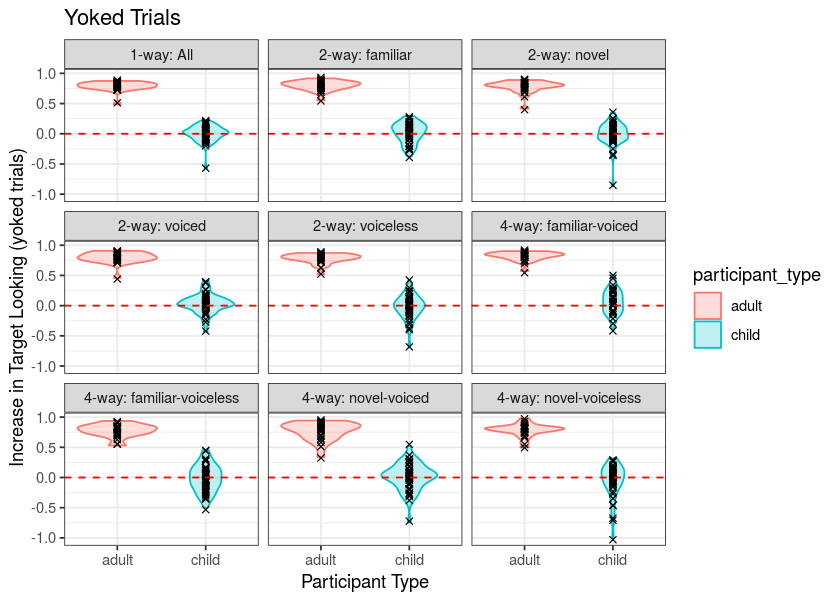

In [135]:
options(repr.plot.width=7, repr.plot.height=5)
ggplot(subset(all_scores, normalizeMethod == 'yoked')) + geom_violin(
aes(y=prop_looks_to_target, x = participant_type,
colour = participant_type, fill = participant_type), alpha=.25) +
geom_point(aes(x=participant_type, y=prop_looks_to_target), colour ='black',
shape = 4, position=position_jitter(height=.03, width=0)) + facet_wrap(
~partition_name) + theme_bw() + geom_hline(yintercept=0, 
linetype = 'dashed', colour='red') + ggtitle('Yoked Trials'
) + xlab('Participant Type') + ylab('Increase in Target Looking (yoked trials)') 

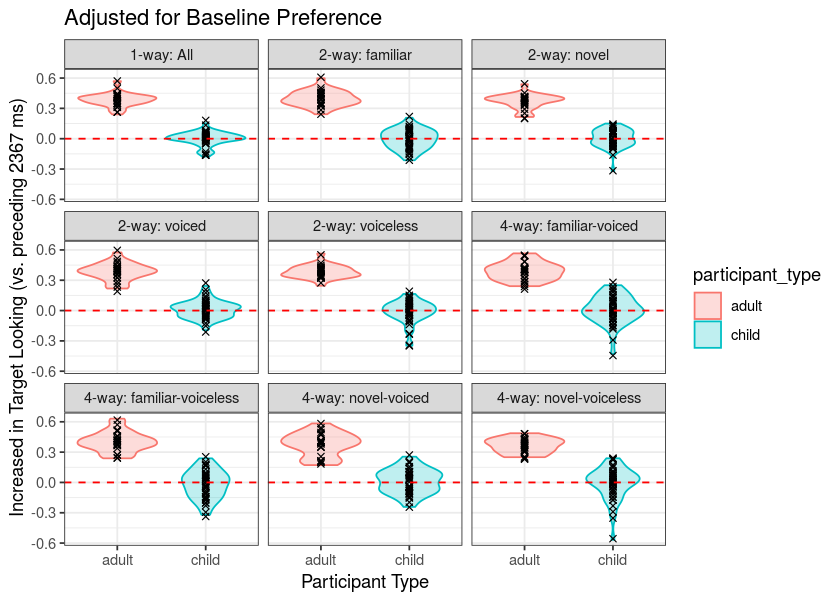

In [136]:
options(repr.plot.width=7, repr.plot.height=5)
ggplot(subset(all_scores, normalizeMethod == 'preceding')) + geom_violin(
aes(y=prop_looks_to_target, x = participant_type,
colour = participant_type, fill = participant_type), alpha=.25) +
geom_point(aes(x=participant_type, y=prop_looks_to_target), position=position_jitter(
height=.03, width=0), colour ='black', shape = 4) + facet_wrap(
~partition_name) + theme_bw() + geom_hline(yintercept=0, 
linetype = 'dashed', colour='red') + ggtitle('Adjusted for Baseline Preference'
) + xlab('Participant Type') + ylab('Increased in Target Looking (vs. preceding 2367 ms)') 

# Expressive Scores vs. Receptive Scores

In [137]:
child_receptive_scores = subset(all_scores, normalizeMethod == 'yoked' & 
                                contrast_type == '1-way')
exre = subset(merge(subject_info[,c('participant_name','age_in_months','broad_score','narrow_score')], subset(child_receptive_scores, participant_type =='child')
    , by='participant_name'), age_in_months > 20 &age_in_months <40)
head(exre)
wilcox.test(exre$prop_looks_to_target ~ exre$expt_version)

,participant_name,age_in_months,broad_score,narrow_score,participant_type,contrast_type,prob,prop_looks_to_target,thresholded,partition_name,normalizeMethod,expt_version
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<fct>
1,pl00,25.21311,NA,NA,child,1-way,0.9937295,0.03698783,Does not demonstrate RK! (p > .33),1-way: All,yoked,scene
2,pl01,25.83607,0.1666667,1.0000000,child,1-way,1.0000000,-0.17748875,Does not demonstrate RK! (p > .33),1-way: All,yoked,scene
3,pl03,26.55738,0.1000000,1.0000000,child,1-way,0.9892578,0.14743932,Does not demonstrate RK! (p > .33),1-way: All,yoked,scene
4,pl09,26.09836,0.0000000,NaN,child,1-way,0.9995439,0.01942082,Does not demonstrate RK! (p > .33),1-way: All,yoked,scene
5,pl10,29.40984,0.1333333,0.1333333,child,1-way,1.0000000,-0.08482689,Does not demonstrate RK! (p > .33),1-way: All,yoked,scene
6,pl11,25.96721,NA,NA,child,1-way,0.9999275,0.02099046,Does not demonstrate RK! (p > .33),1-way: All,yoked,scene



	Wilcoxon rank sum test

data:  exre$prop_looks_to_target by exre$expt_version
W = 240, p-value = 0.6268
alternative hypothesis: true location shift is not equal to 0


In [138]:
length(exre$prop_looks_to_target) 

[1] 42

This means no difference in yoked difference scores given the version of the experiment

In [139]:
library('grDevices')

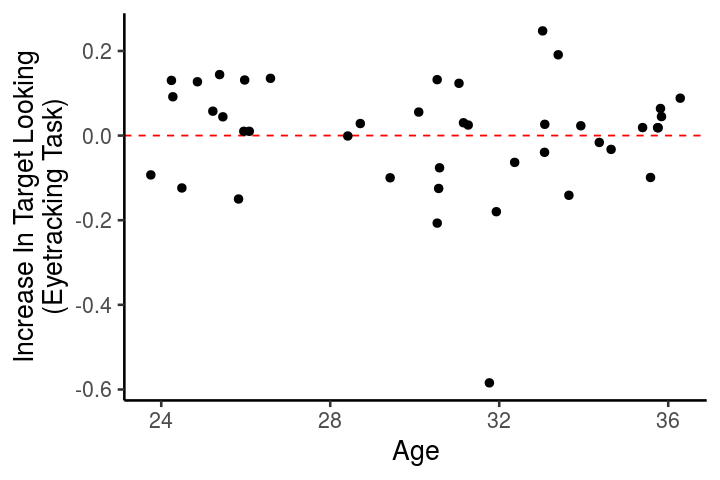

In [140]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(subset(exre, age_in_months > 20 & age_in_months < 40)) + geom_hline(yintercept=0,  
color = 'red', linetype = 'dashed') + geom_jitter(
aes(x=age_in_months, y=prop_looks_to_target), alpha = 1,
    colour="black", size=2, width = .03, height =.03
)  + theme_classic(
    base_size = 16
) + xlab(
    'Age') + ylab(
    'Increase In Target Looking\n(Eyetracking Task)') 

#+ coord_cartesian(xlim=c(0,1),    ylim =c(-.3,.3))

#ggsave('figures/expressive_vs_receptive.pdf', width=6, height=4)

In [141]:
exre$age_floor = sapply(exre$age_in_months, floor)

Warning message:
“Ignoring unknown aesthetics: id”
Warning message:
“Removed 5 rows containing missing values (geom_point).”


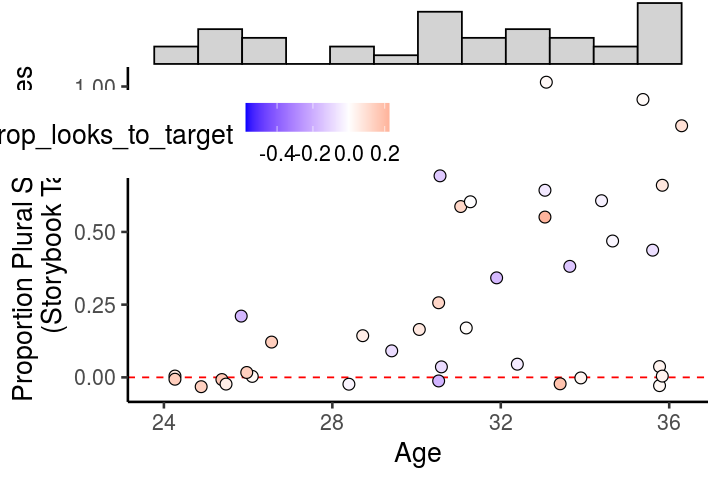

In [142]:
options(repr.plot.width=6, repr.plot.height=4)
mid<-mean(exre$prop_looks_to_target)

p1 = ggplot(subset(exre, age_floor >= 23 & age_floor <= 36)) + geom_hline(yintercept=0,  
color = 'red', linetype = 'dashed') + geom_jitter(
aes(x=age_in_months, y=broad_score, fill=prop_looks_to_target,
   id=prop_looks_to_target), alpha = 1, 
    size=3, width = 0, height =.05, pch=21, colour="black"
)  + theme_classic(
    base_size = 16
) + theme(legend.position = c(0.1, 0.8), legend.direction = 'horizontal') + xlab(
    'Age') + ylab(
    'Proportion Plural Successes\n(Storybook Task)') +scale_fill_gradient2(midpoint=mid, 
    low="blue", mid="white",high="red", space ="Lab" )

p1 = ggMarginal(p1, type = "histogram", margins="x", color="black",
    fill = "lightgray", xparams = list(bins=13))
ggsave('figures/expressive_vs_age.pdf', plot = p1, width=4, height=4)
p1
# Marginal histogram here is a placeholder -- can't pass the rounded month to ggextra,
# so it doesn't actually fit

In [143]:
exre$age_in_months[order(exre$age_in_months)]

[1] 23.77049 24.26230 24.26230 24.49180 24.88525 25.21311 25.37705 25.47541
 [9] 25.83607 25.96721 25.96721 26.09836 26.55738 28.39344 28.72131 29.40984
[17] 30.06557 30.52459 30.52459 30.55738 30.59016 31.04918 31.18033 31.27869
[25] 31.77049 31.90164 32.39344 33.04918 33.04918 33.08197 33.40984 33.63934
[33] 33.90164 34.39344 34.65574 35.37705 35.60656 35.77049 35.77049 35.83607
[41] 35.83607 36.29508

In [144]:
print(mid)

[1] 0.0001087171


In [145]:
summary(lm(prop_looks_to_target ~ broad_score, exre))$r.squared

[1] 0.00899747

In [146]:
spearboot = function(dat, var1, var2, cor_method, R = 2500){
    N <- nrow(dat)
    cor.boot = mat.or.vec(1,R)
    for (i in 1:R) {
      idx <- sample.int(N, N, replace = TRUE) 
      cor.boot[i] <- cor(dat[idx,var1],dat[idx,var2], method=cor_method,
                        use='pairwise.complete.obs')
    }
    return(cor.boot)
}

getSpearmanStats = function(exre, var1, var2, varTitle, tvc){
    cor_test = cor.test(exre[[var1]], exre[[var2]], use='pairwise.complete.obs',
       method = "spearman")
    
    boot_estimate = spearboot(exre, var1, var2,
    'spearman')
    
    boot_ci = quantile(boot_estimate, c(.025,.975))    
    #print(unname(cor_test$estimate)[1])
    tvc = update_texvar_cache(tvc, paste0(varTitle,'Cor'), unname(cor_test$estimate)[1], digits=3)
    #print(unname(cor_test$p.value)[1])
    tvc = update_texvar_cache(tvc, paste0(varTitle,'CorP'), unname(cor_test$p.value)[1], digits=3)
    #print(boot_ci[['2.5%']][1])
    tvc = update_texvar_cache(tvc, paste0(varTitle, 'CorLow'), boot_ci[['2.5%']][1], digits=3)
    tvc = update_texvar_cache(tvc, paste0(varTitle, 'CorHigh'), boot_ci[['97.5%']][1], digits=3)    
    return(tvc)    
}

In [147]:
tvc = getSpearmanStats(exre, 'prop_looks_to_target', 'broad_score', 'expRec', tvc)
tvc = getSpearmanStats(exre, 'age_in_months', 'broad_score', 'expAge', tvc)
tvc = getSpearmanStats(exre, 'age_in_months', 'prop_looks_to_target', 'recAge', tvc)
tvc = getSpearmanStats(exre, 'prop_looks_to_target', 'broad_score', 'expRec', tvc)
print(tvc)
#tvc = writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

Warning message in cor.test.default(exre[[var1]], exre[[var2]], use = "pairwise.complete.obs", :
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(exre[[var1]], exre[[var2]], use = "pairwise.complete.obs", :
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(exre[[var1]], exre[[var2]], use = "pairwise.complete.obs", :
“Cannot compute exact p-value with ties”
Warning message in cor.test.default(exre[[var1]], exre[[var2]], use = "pairwise.complete.obs", :
“Cannot compute exact p-value with ties”


$ranN
[1] 53

$ranNScene
[1] 24

$ranNRedBlue
[1] 29

$totalN
[1] 53

$studyN
[1] 52

$sceneN
[1] 24

$redblueN
[1] 29

$redblueNExclusions
[1] 6

$sceneNExclusions
[1] 4

$redBlueAdultN
[1] 15

$sceneAdultN
[1] 9

$nRedBlueStorybookExclusions
[1] 1

$nSceneStorybookExclusions
[1] 2

$percentFem
[1] 54.72

$numFem
[1] 29

$meanAge
[1] 30.17

$sdAge
[1] 3.97

$numStorybookTrialsExcluded
[1] 12

$numChildrenWithTrialsExcludedFromStorybook
[1] 8

$productionWilcoxonStat
[1] 234.5

$productionWilcoxonP
[1] 0.4

$nChildrenWithExcludedTrials
[1] 36

$nTrialsExcludedByFilter
[1] 170

$percentExcludedEyetrackingTrials
[1] 13

$nEyetrackingSubjExcludedByDataFilter
[1] 0

$sceneEyetrackingLMvoicing
[1] "$\\beta$ = 0.02, 95\\% CI = -0.062 - 0.099"

$redblueEyetrackingLMvoicing
[1] "$\\beta$ = 0.016, 95\\% CI = -0.054 - 0.089"

$combineEyetrackingT
   t 
0.41 

$combineEyetrackingDF
  df 
38.3 

$combineEyetrackingPvalue
[1] 0.68

$sceneDiffScoresGt0
[1] 10

$sceneDiffScoresN
[1] 20

$sceneDiffSco

In [148]:
lmp <- function (modelobject) {
    if (class(modelobject) != "lm") stop("Not an object of class 'lm' ")
    f <- summary(modelobject)$fstatistic
    p <- pf(f[1],f[2],f[3],lower.tail=F)
    attributes(p) <- NULL
    return(p)
}

lm_eqn <- function(df){
    m <- lm(prop_looks_to_target ~ broad_score, exre);
    eq <- substitute(~~italic(R)^2~"="~r2*","~~italic(p)~"="~pval, 
         list(a = format(unname(coef(m)[1]), digits = 2),
              b = format(unname(coef(m)[2]), digits = 2),
             r2 = format(summary(m)$r.squared, digits = 3),
             pval = format(lmp(m), digits=3)))
    return(as.character(as.expression(eq)))
}
lm_eqn(exre)

spear_eqn = function(tvc){
    eq <- substitute("Spearman's"~rho~"="~a*", 95"*symbol("\045")~"CI"~"="~b~"-"~c, 
         list(a = format(tvc$expRecCor, digits = 2),
              b = format(tvc$expRecCorLow, digits = 2),
             c = format(tvc$expRecCorHigh, digits = 3)
           ))
    return(as.character(as.expression(eq)))
}
spear_eqn(tvc)

[1] "~~italic(R)^2 ~ \"=\" ~ \"0.009\" * \",\" ~ ~italic(p) ~ \"=\" ~ \"0.577\""

[1] "\"Spearman's\" ~ rho ~ \"=\" ~ \"-0.19\" * \", 95\" * symbol(\"%\") ~ \"CI\" ~ \"=\" ~ \"-0.48\" ~ \"-\" ~ \"0.133\""

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 5 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”
`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 5 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 5 rows containing missing values (geom_point).”


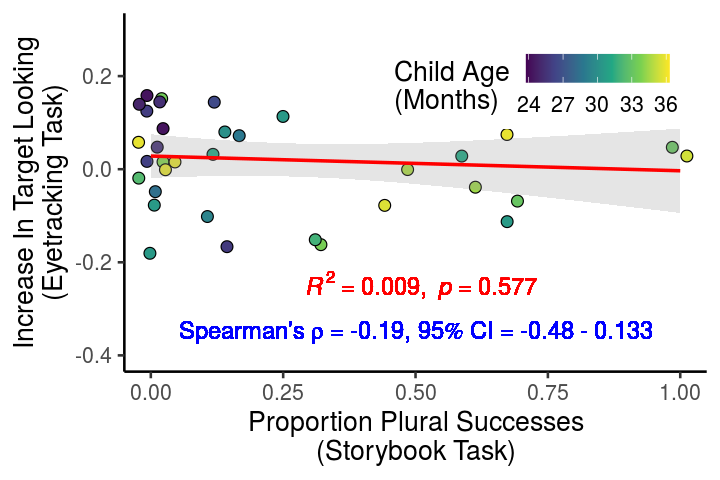

In [149]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(subset(exre, age_in_months > 20 & age_in_months < 40))  + geom_jitter(
aes(x=broad_score, y=prop_looks_to_target, fill=age_in_months), alpha = 1,
    colour="black",pch=21, size=3, width = .03, height =.03
) + scale_fill_continuous(type = "viridis", name = "Child Age\n(Months)") + theme_classic(
    base_size = 16
)+ theme(legend.position = c(0.7, 0.8), legend.direction = 'horizontal') + xlab(
    'Proportion Plural Successes\n(Storybook Task)') + ylab(
    'Increase In Target Looking\n(Eyetracking Task)') + coord_cartesian(xlim=c(0,1), 
    ylim =c(-.4,.3)) + geom_smooth(aes(x=broad_score, prop_looks_to_target), method='lm',
    color='red', alpha=.25) + geom_text(x = .5, y = -.25, label = lm_eqn(df), parse = TRUE,
    size = 5, color = 'red') + geom_text(x = .5, y = -.35, label = spear_eqn(tvc), parse = TRUE,
    size = 5, color = 'blue')

ggsave('figures/expressive_vs_receptive.pdf', width=6, height=4)
#[ ] add the R-squared
#[ ] Add Spearman's rho
#+ geom_hline(yintercept=0, color = 'red', linetype = 'dashed')

In [150]:
nrow(exre)

[1] 42

Warning message:
“Removed 5 rows containing missing values (geom_point).”


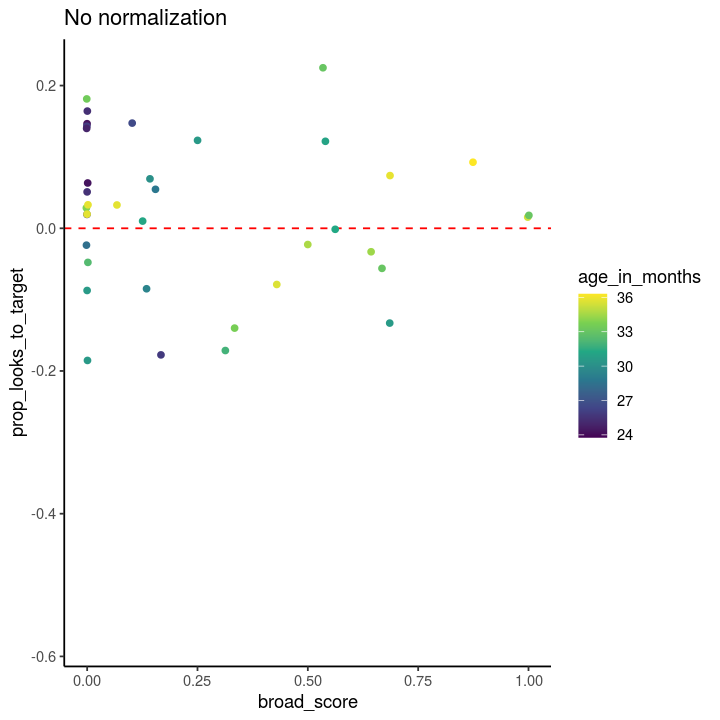

In [151]:
options(repr.plot.width=6, repr.plot.height=6)
ggplot(exre) + geom_hline(yintercept=0,  color = 'red', linetype = 'dashed') + geom_jitter(
aes(x=broad_score, y=prop_looks_to_target, colour=age_in_months)
) + scale_colour_continuous(type = "viridis") + theme_classic() + ggtitle('No normalization')

In [152]:
child_receptive_scores = subset(all_scores, normalizeMethod == 'preceding' & contrast_type == '1-way')
exre = merge(subject_info, child_receptive_scores, by='participant_name')
head(exre)

,participant_name,id,include_eyetracking,include_storybook,filename,age_in_days,gender,type,expt_version.x,comment,⋯,broad_score,narrow_score,participant_type,contrast_type,prob,prop_looks_to_target,thresholded,partition_name,normalizeMethod,expt_version.y
,<chr>,<chr>,<int>,<int>,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,⋯,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<fct>
1,adultpl01,plad01,1,NA,adultpl01_fixations.xlsx,NA,,adult,redblue,,⋯,NA,NA,adult,1-way,0.9899692,0.4236198,Does not demonstrate RK! (p > .33),1-way: All,preceding,redblue
2,adultpl02,plad02,1,NA,adultpl02_fixations.xlsx,NA,,adult,redblue,,⋯,NA,NA,adult,1-way,0.9749488,0.4030117,Does not demonstrate RK! (p > .33),1-way: All,preceding,redblue
3,adultpl03,plad03,1,NA,adultpl03_fixations.xlsx,NA,,adult,redblue,,⋯,NA,NA,adult,1-way,0.9251936,0.3453245,Does not demonstrate RK! (p > .33),1-way: All,preceding,redblue
4,adultpl04,plad04,1,NA,adultpl04_fixations.xlsx,NA,,adult,redblue,,⋯,NA,NA,adult,1-way,0.8997558,0.4131226,Does not demonstrate RK! (p > .33),1-way: All,preceding,redblue
5,adultpl05,plad05,1,NA,adultpl05_fixations.xlsx,NA,,adult,redblue,,⋯,NA,NA,adult,1-way,0.8923364,0.4361947,Does not demonstrate RK! (p > .33),1-way: All,preceding,redblue
6,adultpl06,plad06,1,NA,adultpl06_fixations.xlsx,NA,,adult,redblue,,⋯,NA,NA,adult,1-way,0.9251936,0.4089441,Does not demonstrate RK! (p > .33),1-way: All,preceding,redblue


Warning message:
“Removed 37 rows containing missing values (geom_point).”


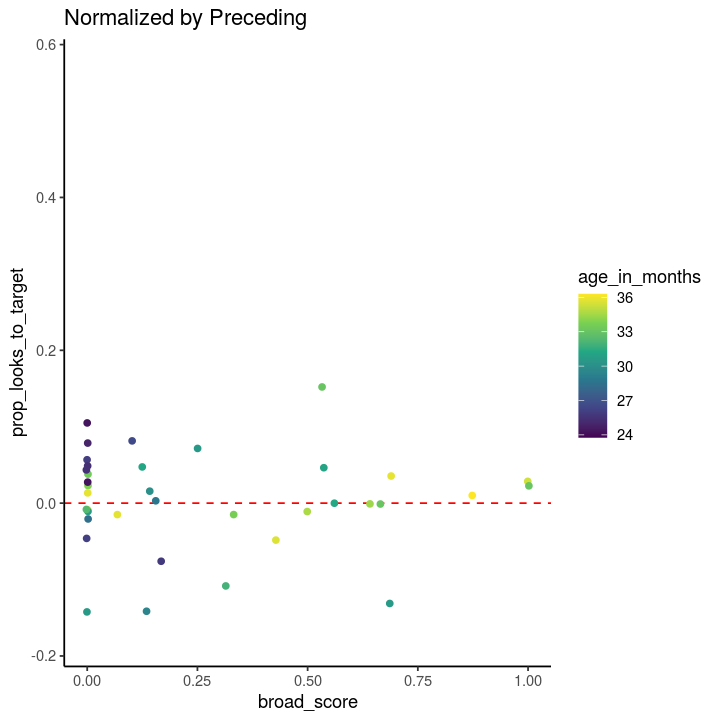

In [153]:
options(repr.plot.width=6, repr.plot.height=6)
ggplot(exre) + geom_hline(yintercept=0,  color = 'red', linetype = 'dashed') + geom_jitter(
aes(x=broad_score, y=prop_looks_to_target, colour=age_in_months)
) + scale_colour_continuous(type = "viridis") + theme_classic() + ggtitle('Normalized by Preceding')

# Logistic Regression Models for Production

In [154]:
nrow(p_coded)

[1] 832

In [155]:
names(p_coded)

[1] "Lemma"                "child"                "itemId"              
 [4] "Singular.description" "Singular.Code"        "Plural.Description"  
 [7] "Plural.Code"          "Comments"             "X"                   
[10] "novel_id"             "background_context"   "vowel_carrier"       
[13] "full_carrier"         "s_carrier"            "s_punct"             
[16] "s_wav_index"          "s_sentence"           "pl_form"             
[19] "pl_carrier"           "pl_punct"             "pl_wav_index"        
[22] "pl_sentence"          "novelty"              "voicing"             
[25] "simple_pl_stim"       "simple_s_stim"        "animacyStatus"       
[28] "test_index"           "trial_index"          "Trial"               
[31] "Practice"             "NovelColor"           "book"

In [156]:
p_coded = merge(p_coded, subject_info[,c('participant_name','age_in_months')], by.x='child',
     by.y='participant_name')

In [157]:
# downsampling process from the original code
p_coded$s_success = NA 
p_coded$s_success[p_coded$Singular.Code %in% c(5)] = 1
p_coded$s_success[p_coded$Singular.Code %in% seq(1,4)] = 0
p_coded$pl_success = NA 
p_coded$pl_success[p_coded$Plural.Code %in% c(7,8)] = 1
p_coded$pl_success[p_coded$Plural.Code %in% seq(1,6)] = 0
p_coded$age_in_months_c = p_coded$age_in_months - 30

## Singular Production

In [158]:
table(p_coded$s_success)


  0   1 
134 689 

In [159]:
tvc

$ranN
[1] 53

$ranNScene
[1] 24

$ranNRedBlue
[1] 29

$totalN
[1] 53

$studyN
[1] 52

$sceneN
[1] 24

$redblueN
[1] 29

$redblueNExclusions
[1] 6

$sceneNExclusions
[1] 4

$redBlueAdultN
[1] 15

$sceneAdultN
[1] 9

$nRedBlueStorybookExclusions
[1] 1

$nSceneStorybookExclusions
[1] 2

$percentFem
[1] 54.72

$numFem
[1] 29

$meanAge
[1] 30.17

$sdAge
[1] 3.97

$numStorybookTrialsExcluded
[1] 12

$numChildrenWithTrialsExcludedFromStorybook
[1] 8

$productionWilcoxonStat
[1] 234.5

$productionWilcoxonP
[1] 0.4

$nChildrenWithExcludedTrials
[1] 36

$nTrialsExcludedByFilter
[1] 170

$percentExcludedEyetrackingTrials
[1] 13

$nEyetrackingSubjExcludedByDataFilter
[1] 0

$sceneEyetrackingLMvoicing
[1] "$\\beta$ = 0.02, 95\\% CI = -0.062 - 0.099"

$redblueEyetrackingLMvoicing
[1] "$\\beta$ = 0.016, 95\\% CI = -0.054 - 0.089"

$combineEyetrackingT
   t 
0.41 

$combineEyetrackingDF
  df 
38.3 

$combineEyetrackingPvalue
[1] 0.68

$sceneDiffScoresGt0
[1] 10

$sceneDiffScoresN
[1] 20

$sceneDiffScoresMean
[1] 0.004

$sceneDiffScoresSD
[1] 0.06

$sceneDiffScoresMin
[1] -0.14

$sceneDiffScoresMax
[1] 0.08

$sceneDiffScoresTStatisistic
   t 
0.31 

$sceneDiffScoresTdf
df 
19 

$sceneDiffScoresPvalue
[1] 0.76

$redblueDiffScoresGt0
[1] 12

$redblueDiffScoresN
[1] 22

$redblueDiffScoresMean
[1] -0.005

$redblueDiffScoresSD
[1] 0.08

$redblueDiffScoresMin
[1] -0.18

$redblueDiffScoresMax
[1] 0.15

$redblueDiffScoresTStatisistic
    t 
-0.28 

$redblueDiffScoresTdf
df 
21 

$redblueDiffScoresPvalue
[1] 0.78

$expRecCor
[1] -0.193

$expRecCorP
[1] 0.254

$expRecCorLow
[1] -0.482

$expRecCorHigh
[1] 0.133

$expAgeCor
[1] 0.468

$expAgeCorP
[1] 0.003

$expAgeCorLow
[1] 0.164

$expAgeCorHigh
[1] 0.719

$recAgeCor
[1] -0.087

$recAgeCorP
[1] 0.585

$recAgeCorLow
[1] -0.391

$recAgeCorHigh
[1] 0.229

In [160]:
numTrialsInSingularLM = nrow(p_coded)
tvc = update_texvar_cache(tvc, 'numTrialsInSingularLM', numTrialsInSingularLM)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [161]:
singular_lm_data = p_coded
singular_lm_data$novelty = binarize(singular_lm_data$novelty,c('familiar','novel'))
singular_lm_data$voicing = binarize(singular_lm_data$voicing,c('voiceless','voiced'))
singular_lm_data$animacyStatus = binarize(singular_lm_data$animacy,c('inanimate','animate'))

[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  


In [162]:
head(singular_lm_data[,c('novelty','voicing','animacyStatus','age_in_months_c')])

,novelty,voicing,animacyStatus,age_in_months_c
,<dbl>,<dbl>,<dbl>,<dbl>
1,0.5,-0.5,-0.5,-4.163934
2,-0.5,0.5,0.5,-4.163934
3,-0.5,-0.5,-0.5,-4.163934
4,-0.5,-0.5,0.5,-4.163934
5,0.5,-0.5,0.5,-4.163934
6,-0.5,-0.5,0.5,-4.163934


In [163]:
table(singular_lm_data$animacyStatus)


-0.5  0.5 
 416  416 

In [164]:
# brms
singular_brm <- brm(s_success  ~ novelty * voicing * animacyStatus * age_in_months_c +    
    (novelty * voicing * animacyStatus | child) + (age_in_months_c|itemId), 
       data = singular_lm_data, family = bernoulli)

#singular_lm
#https://www.jamesrrae.com/post/bayesian-logistic-regression-using-brms-part-1/
# age by  itemId slopes -- these are crazy noisy

Warning message:
“Rows containing NAs were excluded from the model.”
Compiling the C++ model

Start sampling




SAMPLING FOR MODEL '647da6defd2e0475e0334f0bc7379c2d' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000589 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 5.89 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 26.2814 seconds (Warm-up)
Chain 1:                26.8505 seconds (Sampling)
C

In [165]:
fixef(singular_brm)

,Estimate,Est.Error,Q2.5,Q97.5
Intercept,5.411423131,1.2645119,3.41684908,8.4749905
novelty,-0.247056239,0.8776996,-1.92127546,1.5867236
voicing,-0.528499557,0.6613159,-1.88479659,0.6839628
animacyStatus,-0.259847670,0.6469476,-1.54651901,1.0591269
age_in_months_c,0.448705890,0.2301408,0.02488709,0.9334677
novelty:voicing,0.211066259,1.7289647,-3.37969131,3.5332741
novelty:animacyStatus,-0.009387106,1.3814957,-2.80730721,2.7934124
voicing:animacyStatus,-1.297146572,1.8217816,-5.18484161,2.0328366
novelty:age_in_months_c,-0.081846206,0.1872708,-0.45661198,0.2955324
voicing:age_in_months_c,-0.176637804,0.1509942,-0.48697093,0.1038765


In [166]:
s_effects = as.data.frame(fixef(singular_brm))
subset(s_effects, s_effects$Q2.5 > 0 | s_effects$Q97.5 < 0)

,Estimate,Est.Error,Q2.5,Q97.5
,<dbl>,<dbl>,<dbl>,<dbl>
Intercept,5.4114231,1.2645119,3.41684908,8.4749905
age_in_months_c,0.4487059,0.2301408,0.02488709,0.9334677


## Plural Production

In [167]:
table(subset(p_coded, Singular.Code ==5)$pl_success)


  0   1 
497 185 

In [168]:
numTrialsInPluralLM = nrow(subset(p_coded, Singular.Code ==5))
numTrialsInPluralLM
tvc = update_texvar_cache(tvc, 'numTrialsInPluralLM', numTrialsInPluralLM)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

[1] 689

In [169]:
print(p_coded[1,])

  child Lemma itemId Singular.description Singular.Code Plural.Description
1  pl01   tep     30                   te             5                   
  Plural.Code                  Comments X novel_id background_context
1           0 skipped ahead in the book   2005-600              house
  vowel_carrier              full_carrier    s_carrier s_punct s_wav_index
1  in the house Look at the  in the house Look at the        !           2
                               s_sentence pl_form   pl_carrier pl_punct
1 2. tep... Look at the tep in the house!    teps Look at the         !
  pl_wav_index                                pl_sentence novelty   voicing
1           10 10. teps... Look at the teps in the house!   novel voiceless
      simple_pl_stim     simple_s_stim animacyStatus test_index trial_index
1 Look at the  teps! Look at the  tep!     inanimate         32          16
  Trial Practice NovelColor book age_in_months s_success pl_success
1     8        n        red    1      25.836

In [170]:
plural_lm_data = subset(p_coded, Singular.Code ==5)
plural_lm_data$novelty = binarize(plural_lm_data$novelty,c('familiar','novel'))
plural_lm_data$voicing = binarize(plural_lm_data$voicing,c('voiceless','voiced'))
plural_lm_data$animacyStatus = binarize(plural_lm_data$animacy,c('inanimate','animate'))


[1] "familiar" "novel"   
[1] "voiceless" "voiced"   
[1] "inanimate" "animate"  


In [171]:
# brm(s_success  ~ novelty * voicing * animacyStatus * age_in_months_c +    
#     (novelty * voicing * animacyStatus | child) +(1|itemId), 
#        data = singular_lm_data, family = bernoulli)

In [172]:
plural_brm <- brm(pl_success  ~ novelty * voicing * animacyStatus * age_in_months_c +
     (novelty * voicing * animacyStatus | child) +(age_in_months_c|itemId), 
       data = plural_lm_data, family = bernoulli)


Warning message:
“Rows containing NAs were excluded from the model.”
Compiling the C++ model

recompiling to avoid crashing R session

Start sampling




SAMPLING FOR MODEL '647da6defd2e0475e0334f0bc7379c2d' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000514 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 5.14 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 19.5125 seconds (Warm-up)
Chain 1:                11.6989 seconds (Sampling)
C

In [173]:
pl_effects = as.data.frame(fixef(plural_brm))
subset(pl_effects, pl_effects$Q2.5 > 0 | pl_effects$Q97.5 < 0)

,Estimate,Est.Error,Q2.5,Q97.5
,<dbl>,<dbl>,<dbl>,<dbl>
Intercept,-4.8974694,1.1194774,-7.2967082,-3.120806
novelty,-3.4013646,1.2192422,-6.3086967,-1.481306
age_in_months_c,0.7668683,0.2549136,0.3407121,1.318484
novelty:age_in_months_c,0.4876016,0.2575338,0.0529323,1.052339


In [174]:
singular_brm

 Family: bernoulli 
  Links: mu = logit 
Formula: s_success ~ novelty * voicing * animacyStatus * age_in_months_c + (novelty * voicing * animacyStatus | child) + (age_in_months_c | itemId) 
   Data: singular_lm_data (Number of observations: 775) 
Samples: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup samples = 4000

Group-Level Effects: 
~child (Number of levels: 49) 
                                                         Estimate Est.Error
sd(Intercept)                                                5.12      1.20
sd(novelty)                                                  2.49      1.06
sd(voicing)                                                  0.87      0.69
sd(animacyStatus)                                            1.03      0.80
sd(novelty:voicing)                                          4.53      2.07
sd(novelty:animacyStatus)                                    2.32      1.70
sd(voicing:animacyStatus)                                 

In [175]:
#exp(-.7) 1/2 as likely to produce a nocal plural
exp(-3.2)  #1/20 as likely to produce a novel plural at 30 months

[1] 0.0407622

In [176]:
#at 30 months, odds of producing a novel plural
exp(-3.3 + (0*.75) + (0*.48)) 

[1] 0.03688317

In [177]:
#at 36 months, odds of producing a novel plural
exp(-3.3 + (6*.75) + (6*.48 )) 

[1] 59.14547

In [178]:
# contrasts(plural_lm_data$novelty) = contr.sum
# contrasts(plural_lm_data$animacyStatus) = contr.sum
# contrasts(plural_lm_data$voicing) = contr.sum

In [179]:
source('PLEARN_analysis_helper.R')
storybook_lm_mixed_effects = rbind(prepModelForDWPlot(singular_brm) %>% mutate(model = "Singular"),
      prepModelForDWPlot(plural_brm) %>% mutate(model = "Plural")) 

keeps = union(unique(subset(storybook_lm_mixed_effects, !interaction)$term),
                 unique(subset(storybook_lm_mixed_effects, sig)$term))
storybook_lm_mixed_effects = subset(storybook_lm_mixed_effects, term %in% keeps)            
storybook_lm_mixed_effects
# if it is not matched, we lose a predictor

,Estimate,Est.Error,Q2.5,Q97.5,term,group,interaction,sig,model
,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<lgl>,<lgl>,<chr>
1,5.41142313,1.2645119,3.41684908,8.4749905,Intercept,fixed,FALSE,TRUE,Singular
2,-0.24705624,0.8776996,-1.92127546,1.5867236,novelty,fixed,FALSE,FALSE,Singular
3,-0.52849956,0.6613159,-1.88479659,0.6839628,voicing,fixed,FALSE,FALSE,Singular
4,-0.25984767,0.6469476,-1.54651901,1.0591269,animacyStatus,fixed,FALSE,FALSE,Singular
5,0.44870589,0.2301408,0.02488709,0.9334677,age_in_months_c,fixed,FALSE,TRUE,Singular
9,-0.08184621,0.1872708,-0.45661198,0.2955324,novelty:age_in_months_c,fixed,TRUE,FALSE,Singular
17,-4.89746936,1.1194774,-7.29670822,-3.1208055,Intercept,fixed,FALSE,TRUE,Plural
18,-3.40136460,1.2192422,-6.30869673,-1.4813063,novelty,fixed,FALSE,TRUE,Plural
19,1.19340904,0.6957762,-0.12594656,2.6132420,voicing,fixed,FALSE,FALSE,Plural


In [180]:
relabel_terms = function(df, colname){
    remap = list()
    remap[['Intercept']] = 'Intercept'
    remap[['novelty']] = "Novelty\n(familiar vs. novel)"
    remap[['voicing']] = "Voicing\n(/s/ vs. /z/)"
    remap[['animacyStatus']] = "Animacy\n(inanimate vs. animate)"
    remap[['age_in_months_c']] = "Child Age\n(in months, centered at 30)"
    remap[['novelty:age_in_months_c']] = "Novelty x Child Age"
    remap[['trial_index']] = 'Trial Order'
    
    df[[colname]] = sapply(df$term, function(x){remap[[x]]})
    df[[colname]] = factor(df[[colname]], levels = rev(c(
        'Intercept',
        "Novelty\n(familiar vs. novel)",
        "Voicing\n(/s/ vs. /z/)",
        "Animacy\n(inanimate vs. animate)",
        "Child Age\n(in months, centered at 30)",        
        "Novelty x Child Age",
        "Trial Order"
    )))
    return(df)
}    
storybook_lm_mixed_effects = relabel_terms(storybook_lm_mixed_effects,'term')


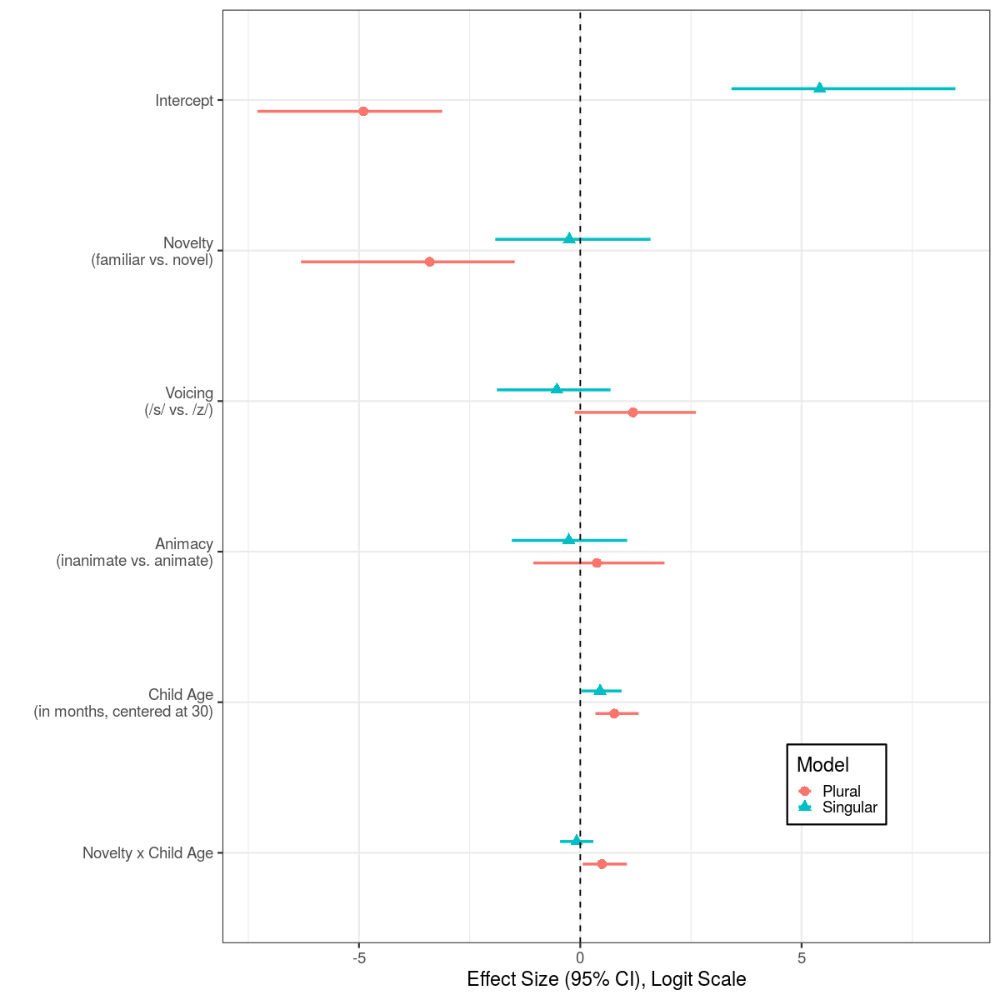

In [181]:
options(repr.plot.width=10, repr.plot.height=10)
ggplot(as.data.frame(storybook_lm_mixed_effects) 
    ) + geom_errorbarh(aes(xmin=Q2.5, xmax=Q97.5,y=term, color=model), size=1,
        height=0, position=ggstance::position_dodgev(height=0.3)
    ) + geom_point(aes(x=Estimate,y=term, color=model, shape=model),
        position=ggstance::position_dodgev(height=0.3), size=3) + theme_bw(base_size=14
    ) + geom_vline(xintercept=0, lty=2) + xlab('Effect Size (95% CI), Logit Scale'
    ) + ylab('') + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.8,.17), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="black")
    ) +  scale_shape_discrete(name = "Model") +  scale_color_discrete(name = "Model")

ggsave('figures/brms_storybook_lmem.pdf', width=5,height=3.2) 





In [182]:
tvc = get_texvar_from_beta(singular_lm, 'novelty','singularLMnovelty', tvc)
tvc = get_texvar_from_beta(plural_lm, 'novelty','pluralLMnovelty', tvc)
tvc = get_texvar_from_beta(plural_lm, 'novelty:age_in_months_c','pluralLMAgeNovelty', tvc)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

ERROR: Error in summary(lm): object 'singular_lm' not found


In [ ]:
# augment the results so that dwplot can produce them correctly
singular_lm_aug = recoverIntercept(singular_lm) %>% mutate(model = "Singular")
plural_lm_aug = recoverIntercept(plural_lm) %>% mutate(model = "Plural")

In [ ]:
sum(singular_lm_data$Singular.Code ==5, na.rm=T) / 
length(singular_lm_data$Singular.Code[!is.na(
    singular_lm_data$Singular.Code)])
# produce the singular ~83% of the time

In [ ]:
nrow(subset(plural_lm_data, Plural.Code == 5 & Singular.Code ==5)) / nrow(subset(
    plural_lm_data, Singular.Code ==5))
# produce the plural ~24% of the time on plural trials

In [ ]:
nrow(subset(plural_lm_data, Plural.Code == 8 & Singular.Code ==5)) / nrow(subset(
    plural_lm_data, Singular.Code ==5))
# produce the plural ~24% of the time on plural trials

In [ ]:
sum(subset(plural_lm_data, novelty == -.5 & Singular.Code == 5)$Plural.Code == 8) / 
    nrow(subset(plural_lm_data, novelty == .5 & Singular.Code == 5))
# produce the novel plural ~20% of the time

In [ ]:
sum(subset(plural_lm_data, novelty == .5 & Singular.Code == 5)$Plural.Code == 8) / 
    nrow(subset(plural_lm_data, novelty == .5 & Singular.Code == 5))
# produce the novel plural ~20% of the time

In [ ]:
.19 / ((.28 + .19)/2) #80% as likely to produce a novel plural

In [ ]:
# correct interpretation of beta contribution to odds

In [ ]:
exp(3*.45)

# Age vs. Plural Knowledge

In [ ]:
code_counts_with_age = merge(subject_info, code_counts, by.x='id', by.y='child')
code_counts_with_age = merge(code_counts_with_age, codes)
head(code_counts_with_age)

In [ ]:
children_in_age_range = subset(code_counts_with_age, type == 'child' & in_study)

In [ ]:
cor(children_in_age_range$broad_score,children_in_age_range$age_in_days, 
    use="pairwise.complete.obs")

In [ ]:
length(unique(children_in_age_range$participant_name))

In [ ]:
#code_counts_with_age is much less than subject_info
length(unique(subset(children_in_age_range, !is.na(narrow_score))$participant_name))
# it is the age range filtering and the absence of narrow scores

In [ ]:
# this is superseded below by collapsing across kids within each age range
options(repr.plot.width=8, repr.plot.height=6)
ggplot(children_in_age_range) + geom_bar(
aes(x=age_in_months, y=count, fill=description),
stat="identity",  width = 0.2, position="fill"
) + scale_fill_manual(values = rep(c("white", "palegreen3", "palegreen2", "palegreen1",
"palegreen", "peachpuff1", "peachpuff2", "steelblue1","steelblue2"), 2)) + facet_wrap(~s_pl, nrow=2) + xlab('Age in Months') + ylab('Count'
) + theme_classic() 

In [ ]:
# simplify the coloration of the above
remap = list()
remap[['0']] = 'No Data'
remap[['1']] = 'No Response / Not Relevant'
remap[['2']] = 'No Response / Not Relevant'
remap[['3']] = 'No Response / Not Relevant'
remap[['4']] = 'No Response / Not Relevant'
remap[['5']] = 'Singular'
remap[['6']] = 'Non-Conventional Plural'
remap[['7']] = 'Plural'
remap[['8']] = 'Plural'

children_in_age_range$recode =
sapply(children_in_age_range$code, function(x){remap[[as.character(x)]]})
children_in_age_range$recode = factor(children_in_age_range$recode,
    levels = c('No Data', 'No Response / Not Relevant', 'Singular',
               'Non-Conventional Plural','Plural'))

In [ ]:
# aggreagate each category within each 4-month group; mean + sd; two kinds of lines
# mean + sd for each
# median for each? in many cases, it will 
# familiars and plurals as two separate panels

In [ ]:
subset(subject_info, participant_name == 'pl04')

In [ ]:
subject_info$age_group = sapply(subject_info$age_in_months,
    function(x){
        if (is.na(x)){
            return('No age')
        } else {
            if (x < 28){
                return('24-28')
            } else if (x < 32){
                return('28-32')
            } else {
                return('32-36')
            }
        }
    })

In [ ]:
names(children_in_age_range)
# need to aggregaye split by novelty

In [ ]:
p_coded_aug = merge(p_coded, subject_info[,c('id','age_group')], by.x='child', by.y='id')

In [ ]:
head(p_coded_aug)

In [ ]:
p_coded_aug$singular_recode =
sapply(p_coded_aug$Singular.Code, function(x){remap[[as.character(x)]]})
p_coded_aug$singular_recode = factor(p_coded_aug$singular_recode,
    levels = c('No Data', 'No Response / Not Relevant', 'Singular',
               'Non-Conventional Plural','Plural'))

p_coded_aug$plural_recode =
sapply(p_coded_aug$Plural.Code, function(x){remap[[as.character(x)]]})
p_coded_aug$plural_recode = factor(p_coded_aug$plural_recode,
    levels = c('No Data', 'No Response / Not Relevant', 'Singular',
               'Non-Conventional Plural','Plural'))

In [ ]:
sing_counts = aggregate(itemId ~ singular_recode + novelty + age_group, p_coded_aug, length)
names(sing_counts)[1] = 'code'
names(sing_counts)[length(names(sing_counts))] = 'count'
sing_counts$s_pl = 'Singular Trials'
pl_counts = aggregate(itemId ~ plural_recode + novelty  + age_group, p_coded_aug, length)
names(pl_counts)[1] = 'code'
names(pl_counts)[length(names(pl_counts))] = 'count'
pl_counts$s_pl = 'Plural Trials'
code_counts = rbind(sing_counts,pl_counts)
code_counts$novelty = as.character(code_counts$novelty)
code_counts$novelty[code_counts$novelty == 'familiar'] = 'Familiar Object Words'
code_counts$novelty[code_counts$novelty == 'novel'] = 'Novel Object Words'
head(code_counts)

In [ ]:
#child count also
child_sing_counts = aggregate(child ~ singular_recode + novelty + age_group, p_coded_aug, 
    function(x){length(unique(x))})
names(child_sing_counts)[1] = 'code'
names(child_sing_counts)[length(names(child_sing_counts))] = 'child_count'
child_sing_counts$s_pl = 'Singular Trials'
child_pl_counts = aggregate(child ~ plural_recode + novelty  + age_group, p_coded_aug, 
    function(x){length(unique(x))})
names(child_pl_counts)[1] = 'code'
names(child_pl_counts)[length(names(child_pl_counts))] = 'child_count'
child_pl_counts$s_pl = 'Plural Trials'
child_code_counts = rbind(child_sing_counts,child_pl_counts)
child_code_counts$novelty = as.character(child_code_counts$novelty)
child_code_counts$novelty[child_code_counts$novelty == 'familiar'] = 'Familiar Object Words'
child_code_counts$novelty[child_code_counts$novelty == 'novel'] = 'Novel Object Words'
head(child_code_counts)


In [ ]:
both_code_counts = merge(code_counts, child_code_counts, all=T)
both_code_counts[is.na(both_code_counts)] = 0
both_code_counts$label = paste0(both_code_counts$count,' (',both_code_counts$child_count,')')
head(both_code_counts)

In [ ]:
# total child counts per time interval
interval_child_counts = aggregate(child ~ novelty  + age_group, p_coded_aug, 
    function(x){length(unique(x))})
interval_child_counts = rbind(interval_child_counts, interval_child_counts)
interval_child_counts$s_pl = c(rep('Plural Trials', 6), rep('Singular Trials', 6)) 
names(interval_child_counts)[names(interval_child_counts) == 'child'] = 'children_per_interval'
interval_child_counts$novelty = as.character(interval_child_counts$novelty)
interval_child_counts$novelty[interval_child_counts$novelty == 'familiar'] = 'Familiar Object Words'
interval_child_counts$novelty[interval_child_counts$novelty == 'novel'] = 'Novel Object Words'
interval_child_counts

In [ ]:
both_code_counts = merge(both_code_counts, interval_child_counts)

In [ ]:
both_code_counts$age_group_label = paste0(both_code_counts$age_group, '\n(n = ',
    both_code_counts$children_per_interval,')')

In [ ]:
# recompute these as proportions
non_missing_code_counts = subset(both_code_counts, code != 'No Data')

code_props = do.call('rbind', lapply(split(non_missing_code_counts, list(non_missing_code_counts$novelty,
    non_missing_code_counts$age_group, non_missing_code_counts$s_pl)), function(df){
    total = sum(df$count)
    df$prop = df$count / total
    return(df)
}))
subset(code_props, s_pl == 'Plural Trials' & novelty == 'Novel Object Words' & age_group == '24-28')

In [ ]:
code_props$s_pl_by_novelty = paste0(code_props$s_pl,":\n ", code_props$novelty)
code_props$s_pl_by_novelty = factor(code_props$s_pl_by_novelty)
code_props$s_pl_by_novelty = factor(code_props$s_pl_by_novelty, levels = rev(levels(code_props$s_pl_by_novelty)))

options(repr.plot.width=8, repr.plot.height=3)
ggplot(code_props) + geom_bar(
aes(x=age_group_label, y=prop, fill=code, label=count),
stat="identity", position="stack"
) + facet_wrap(~s_pl_by_novelty, nrow=1) + xlab('Age Group (Months)') + ylab('Proportion of Responses'
) + theme_classic() + scale_fill_manual(values = rep(c("palegreen2", 
 "salmon1", "peachpuff2","steelblue1"), 2)
) + geom_text(size=3, aes(x=age_group_label, y=prop, fill=code, label=label),
          position = position_stack(vjust = 0.5)) + theme(legend.position="bottom",
    legend.title = element_blank(), legend.direction='vertical', legend.margin=margin(0,0,0,0),
        legend.box.margin=margin(-10,-5,-5,-5)) + guides(fill=guide_legend(ncol=4))
ggsave('figures/production_props.pdf', height=2.5, width=8)

In [ ]:
# expect ~400 in each category
sum(subset(code_props, s_pl == 'Plural Trials' & novelty == 'Novel Object Words')$count)

In [ ]:
#  [] try to add the number of kids (omitting the smallest ones) in parentheticals
# [ ] may need to nudge these up

In [ ]:
length(unique(subset(children_in_age_range, code %in% c(7,8) & type =='child')$id))
length(unique(subset(children_in_age_range, code %in% c(1:8)  & type =='child')$id))

In [ ]:
aggregate(count ~ participant_name, subset(code_counts_with_age, code %in% c(7,8)
                                          & s_pl == 'plural'), sum)

In [ ]:
nrow(subset(aggregate(count ~ participant_name, subset(children_in_age_range, code %in% c(7,8)
                                          & s_pl == 'plural'), sum), count > 8)) 

In [ ]:
# drop backe to p_coded 
p_coded_incl = subset(p_coded, child %in% subset(subject_info, in_study)$participant_name)
names(p_coded_incl)

In [ ]:
nProducingAPlural = length(unique(subset(p_coded_incl, Plural.Code %in% c(7,8))$child))
nProducingAPlural
tvc = update_texvar_cache(tvc, 'nProducingAPlural', nProducingAPlural)

In [ ]:
# Number of participants with production data
storybookNwithProductions = length(unique(p_coded_incl$child))
storybookNwithProductions
tvc = update_texvar_cache(tvc, 'storybookNwithProductions', storybookNwithProductions)

In [ ]:
# Number that produced one or more novel plurals
nProducingNovelPlurals = length(unique(subset(p_coded_incl, Plural.Code %in% c(7,8) & novelty == 'novel' )$child))
tvc = update_texvar_cache(tvc, 'nProducingNovelPlurals', nProducingNovelPlurals)

writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [ ]:
# Number that produced one or more novel singulars
nNovelSingulars = length(unique(subset(p_coded_incl, Singular.Code %in% c(5) & novelty == 'novel' )$child))
nNovelSingulars
tvc = update_texvar_cache(tvc, 'nNovelSingulars', nNovelSingulars)

In [ ]:
# Number that produced non-conventional plurals
nNonconventionalPlurals = length(unique(subset(p_coded_incl, Plural.Code %in% c(6) & novelty == 'novel' )$child))
nNonconventionalPlurals
tvc = update_texvar_cache(tvc, 'nNonconventionalPlurals', nNonconventionalPlurals)

In [ ]:
names(subject_info)

In [ ]:
fam = aggregate(Plural.Code ~ child, subset(p_coded_incl, Plural.Code %in% c(7,8) & novelty == 'familiar'),
          length)
names(fam) = c('child','fam_pl')
nov = aggregate(Plural.Code ~ child, subset(p_coded_incl, Plural.Code %in% c(7,8) & novelty == 'novel'),
          length)
names(nov) = c('child','nov_pl')
combined = merge(fam, nov, all=T)
combined = merge(combined, subject_info[,c('participant_name','age_in_months','age_group')],
     by.x='child', by.y='participant_name')
nrow(combined)

combined[is.na(combined)] = 0
options(repr.plot.width=4, repr.plot.height=4)
ggplot(combined) + geom_jitter(aes(x=fam_pl, y=nov_pl, color=factor(age_group)
), width=.5, height=.5, size=4) + theme_classic(base_size=16
) + xlab('# Familiar Plurals') + ylab('# Novel Plurals') + coord_cartesian(xlim=c(-1,8.5),
    ylim=c(-1,8.5)) + geom_abline(yintercept=0, slope=1, linetype = 'dashed', alpha=.5
) + theme(
    legend.key.size = unit(.4, "cm"),
    legend.position = c(.2,.9), 
    legend.background = element_rect(fill="white", linetype="solid", 
                                  colour ="white"),
    legend.title=element_blank()
    )

ggsave('figures/familiar_vs_novel_plurals.pdf', width = 4, height=4)

In [ ]:
numChildrenWithSingPl = nrow(combined)
tvc = update_texvar_cache(tvc, 'numChildrenWithSingPl', numChildrenWithSingPl)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [ ]:
fam_nov_cor = cor.test(combined$fam_pl, combined$nov_pl, method='spearman')

In [ ]:
fam_nov_cor$estimate

In [ ]:
fam_nov_cor$p.value

In [ ]:
fam_nov = spearboot(combined, 'fam_pl', 'nov_pl', cor_method='spearman' )
ggplot(data.frame(fam_nov= t(fam_nov))) + geom_density(aes(x=fam_nov))

In [ ]:
fam_nov_cor_boot_ci = quantile(t(fam_nov), c(0.025, 0.975))
fam_nov_cor_boot_ci[['2.5%']]
fam_nov_cor_boot_ci[['97.5%']]

In [ ]:
tvc = update_texvar_cache(tvc, 'famNovCor', fam_nov_cor$estimate, digits=3)
tvc = update_texvar_cache(tvc, 'famNovCorP', fam_nov_cor$p.value, digits=3)
tvc = update_texvar_cache(tvc, 'famNovCorUpper', fam_nov_cor_boot_ci[['97.5%']], digits=3)
tvc = update_texvar_cache(tvc, 'famNovCorLower', fam_nov_cor_boot_ci[['2.5%']], digits=3)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [ ]:
numProducingHalfNovelPlurals = nrow(subset(nov, nov_pl >= 4))
tvc = update_texvar_cache(tvc, 'numProducingHalfNovelPlurals', numProducingHalfNovelPlurals)
numProducingHalfFamiliarPlurals= nrow(subset(fam, fam_pl>= 4))
tvc = update_texvar_cache(tvc, 'numProducingHalfFamiliarPlurals', numProducingHalfFamiliarPlurals)
combined$total_pl = combined$nov_pl + combined$fam_pl
subset(combined, total_pl > 8)

In [ ]:
nrow(subset(combined, nov_pl > 0))
nrow(combined)

In [ ]:
ggplot(subset(code_counts_with_age,age_in_months > 20 & age_in_months < 40 )
      ) + geom_histogram(aes(x=age_in_months)) + facet_wrap(~expt_version)

In [ ]:
subj_scores = aggregate(broad_score ~ participant_name + expt_version, 
    subset(code_counts_with_age,age_in_months > 20 & age_in_months < 40),  unique)
print(nrow(subj_scores))
wilcox.test(subj_scores$broad_score~subj_scores$expt_version)
# only 22 with defined narrow scores

This also provides evidence that we can combine across production tasks in redblue and background versions

In [ ]:
ggplot(subj_scores) + geom_violin(aes(x=expt_version, y=broad_score, fill=expt_version))

In [ ]:
# can combine, but marginal. Narrow score is the correct one.

Compare with existing studies: 

- Zapf and Smith (2007):
- Zapf and Ettlinger (2011): for 22-35 months (m=25.8): 52% correct plurals; 33% singulars, remainder are non-answers
Experimenter says "Can you tell Teddy to get ____" and point to the singulars or the plurals. Common familiar nouns. ****Teddy bear picks up things or not, i.e. there is reinforcement learning.****


# Inter-Annotator Agreement on the Storybook Task

In [ ]:
p_coded$Singular.Code.Downsampled = sapply(as.character(p_coded$Singular.Code), function(x){
    remap[[x]]
})
p_coded$Plural.Code.Downsampled = unlist(sapply(as.character(p_coded$Plural.Code), function(x){
    remap[[x]]
}))

In [ ]:
p_coded_check = subset(read.csv('productions_coded_check.csv', stringsAsFactors=F), !(child %in% c(
'oddParticipant', 'evenParticipant')) & !(itemId %in% c('p1','p2','p3','p4'))) 
p_coded_check$X = NULL
remap_check = list()
remap_check[['No Data']] = 'No Data'
remap_check[['singular']] = 'Singular'
remap_check[['no response / non-relevant']] = 'No Response / Not Relevant'
remap_check[['non-conventional plural']] = 'Non-Conventional Plural'
remap_check[['plural']] = 'Plural'
remap_check[['']] = ''

p_coded_check$Singular.Code = sapply(as.character(p_coded_check$Singular.Code),
    function(x){
    remap_check[[x]]
})
p_coded_check$Plural.Code = sapply(as.character(p_coded_check$Plural.Code), function(x){
    remap_check[[x]]
})
nrow(p_coded_check)

In [ ]:
# From my downsampling of the codes
# remap[['0']] = 'No Data'
# remap[['1']] = 'No Response / Not Relevant'
# remap[['2']] = 'No Response / Not Relevant'
# remap[['3']] = 'No Response / Not Relevant'
# remap[['4']] = 'No Response / Not Relevant'
# remap[['5']] = 'Singular'
# remap[['6']] = 'Non-Conventional Plural'
# remap[['7']] = 'Plural'
# remap[['8']] = 'Plural'

In [ ]:
p_coded_both = as.data.frame(merge(
    p_coded_check, p_coded[,c('child','Lemma','Singular.Code.Downsampled',
                                'Plural.Code.Downsampled')]),
    by = c('child','Lemma'))
p_coded_both$Singular.Code.Downsampled = as.character(p_coded_both$Singular.Code.Downsampled)

In [ ]:
nrow(subset(p_coded, child %in% unique(p_coded_check$child))) # expect 400

In [ ]:
length(unique(p_coded_both$child))
nrow(p_coded_both)

In [ ]:
library('irr')

In [ ]:
p_coded_both[,c('Singular.Code','Singular.Code.Downsampled')]


In [ ]:
sing_kappa = kappa2(p_coded_both[,c('Singular.Code','Singular.Code.Downsampled')])
sing_kappa

In [ ]:
pl_kappa = kappa2(p_coded_both[,c('Plural.Code','Plural.Code.Downsampled')])
pl_kappa

In [ ]:
tvc = update_texvar_cache(tvc, 'kappaPlurals', pl_kappa$value)
tvc = update_texvar_cache(tvc, 'kappaSingulars', sing_kappa$value)
writeout_texvar_cache(tvc, 'texvars/pilot_analysis.tex',appendDate=T)

In [ ]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(p_coded_both, aes(x=Singular.Code, y=Singular.Code.Downsampled)) + stat_bin2d(
) + stat_bin2d(geom = "text", aes(label = ..count..), binwidth = 1, color='white'
)  + ylab('Stephan') + xlab('Jess')

In [ ]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(p_coded_both, aes(x=Plural.Code, y=Plural.Code.Downsampled)) + stat_bin2d(
) + stat_bin2d(geom = "text", aes(label = ..count..), binwidth = 1, color='white'
)  + ylab('Stephan') + xlab('Jess')

# Vocabulary vs. Plural Knowledge

In [ ]:
# pull in CDI scores

# Response Time When Looking at Distractor

In [ ]:
metadata_cols = c('animacystatus', 'background_context','distractorimage',
'distractorloc', 'expt_index', 'full_carrier', 'novel_id', 'novelcolor',
'novelty', 'order', 'pl_carrier', 'pl_form', 'pl_punct', 'pl_sentence',
'pl_wav_index', 'practice', 's_carrier', 's_form', 's_punct',
's_sentence', 's_wav_index', 'simple_pl_stim', 'simple_s_stim', 'target',
'targetimage', 'targetloc', 'targetside', 'test_index', 'trial', 'voicing', 'vowel_carrier',
'RECORDING_SESSION_LABEL')

In [ ]:
names(ed_df)

In [ ]:
fixreports = split(ed_df, ed_df$filename)

In [ ]:
source('PLEARN_analysis_helper.R')
test_df = do.call('rbind',lapply(fixreports, function(fixreport){
    getParticipantRTs(380, fixreport, label_colname="CURRENT_FIX_INTEREST_AREA_LABEL", metadata_cols, include_non_roi_label=T)
})) 

In [ ]:
# 10/10/19: this is failing because of an edge case where we don't see any fixations before disambiguation

In [ ]:
getRTComparisonPlot = function(test_df, split_var, facet_var = NULL){
    
    agg_equation = paste("rt ~", split_var)
    if (!is.null(facet_var)){
        agg_equation = paste(agg_equation, "+", facet_var)
    }
    summary_df = do.call(data.frame, aggregate(as.formula(agg_equation), data = test_df, FUN = function(x)
        c(mean = mean(x), sd = sd(x))))
    print(names(summary_df))                   
    
    options(repr.plot.width=4, repr.plot.height=4)
    p1 = ggplot(test_df) + geom_violin(mapping=aes(y=rt, x=factor(test_df[[split_var
]]), colour=factor(test_df[[split_var]]))) + theme_bw(
) + geom_errorbar(data = summary_df, mapping=aes(x=factor(summary_df[[split_var
]]), ymin =  rt.mean - rt.sd, ymax = rt.mean + rt.sd), width = 0.1, alpha=.5) + geom_errorbar(data = summary_df, mapping=aes(x=factor(summary_df[[split_var
]]), ymin =  rt.mean, ymax = rt.mean)) + theme_bw(
) + geom_hline(yintercept=0, colour='black', linetype='dashed'
) + geom_hline(yintercept=367, colour='forestgreen') + coord_flip(
ylim= c(0,2000)) + xlab(split_var) + ylab(''
) + theme(legend.position="none")
    
    if (!is.null(facet_var)){
        options(repr.plot.width=4, repr.plot.height=8)
        p1 = p1 + facet_wrap(as.formula(paste('~', facet_var, sep='')), ncol=1)
    }
    print(p1)
                                               
    p2 = ggplot(test_df) + geom_histogram(mapping=aes(x=rt, fill=factor(test_df[[split_var]]))
    ) + theme_bw() + geom_errorbarh(data = summary_df, 
    mapping=aes(y=factor(summary_df[[split_var]]), xmin =  rt.mean - rt.sd, xmax = rt.mean + rt.sd),
    width = 0.1, alpha=.5) + geom_errorbarh(data = summary_df, mapping=aes(y=factor(summary_df[[split_var
    ]]), xmin =  rt.mean, xmax = rt.mean)) + theme_bw() + geom_vline(xintercept=0, 
    colour='black', linetype='dashed') + geom_vline(xintercept=367, colour='forestgreen'
    ) + coord_cartesian(xlim= c(0,2000)) + theme(legend.position="none")
    
    if (!is.null(facet_var)){
        options(repr.plot.width=4, repr.plot.height=8)
        p2 = p2 + facet_wrap(as.formula(paste('~', facet_var, '+', split_var, sep='')), ncol=1)
    } else {
        p2 = p2 + facet_wrap(as.formula(paste('~', split_var, sep='')), ncol=1)
    }
    #print(p2)                                  
                                               
                                               
}

In [ ]:
names(test_df)

In [ ]:
getRTComparisonPlot(test_df, split_var = 'RECORDING_SESSION_LABEL', facet_var='target')

In [ ]:
getRTComparisonPlot(test_df, split_var = 'target')

In [ ]:
getRTComparisonPlot(test_df, split_var = 'target', facet_var = 'RECORDING_SESSION_LABEL')

In [ ]:
getRTComparisonPlot(test_df,split_var = 'voicing', facet_var='target')

In [ ]:
getRTComparisonPlot(test_df,split_var = 'novelty', facet_var='target')

In [ ]:
getRTComparisonPlot(test_df,split_var = 'animacystatus', facet_var='target')

In [ ]:
names(test_df)

In [ ]:
library('lme4')
lm = lmer(rt ~ novelty + voicing + animacystatus + 
    (novelty + voicing + animacystatus | RECORDING_SESSION_LABEL) +(1|s_form), data=
 test_df, )
summary(lm)

# Preference Before Disambiguation

In [ ]:
beforeafter_disambig_df = subset(ed_df, 
    CURRENT_FIX_INTEREST_AREA_LABEL %in% c('TARGET','DISTRACTOR')) 
beforeafter_disambig_df$looking_at_plural = 0
beforeafter_disambig_df$looking_at_plural[
    beforeafter_disambig_df$CURRENT_FIX_INTEREST_AREA_LABEL == 'TARGET' & 
    beforeafter_disambig_df$target == 'pl'] = 1
beforeafter_disambig_df$looking_at_plural[
    beforeafter_disambig_df$CURRENT_FIX_INTEREST_AREA_LABEL == 'DISTRACTOR' & 
    beforeafter_disambig_df$target == 's'] = 1
beforeafter_disambig_df$beforeafter = 'After Disambiguation'
beforeafter_disambig_df$beforeafter[beforeafter_disambig_df$Time < 367] = 'Before Disambiguation'
beforeafter_disambig_preference = aggregate(looking_at_plural ~ participant_name +
    type + beforeafter + TRIAL_INDEX, 
    beforeafter_disambig_df, mean)

beforeafter_disambig_by_subject = do.call(data.frame, aggregate(looking_at_plural ~ participant_name + type +  beforeafter, beforeafter_disambig_preference, FUN = function(x){c(mean=mean(x), sd = sd(x))}))                                       

print(beforeafter_disambig_by_subject)

In [ ]:
beforeafter_disambig_by_subject$looking_at_plural_low = 
    beforeafter_disambig_by_subject$looking_at_plural.mean - beforeafter_disambig_by_subject$looking_at_plural.sd
beforeafter_disambig_by_subject$looking_at_plural_high = 
    beforeafter_disambig_by_subject$looking_at_plural.mean + beforeafter_disambig_by_subject$looking_at_plural.sd

In [ ]:
#options(repr.plot.width=4, repr.plot.height=4)
ggplot(subset(beforeafter_disambig_by_subject, beforeafter == "Before Disambiguation" &
type == 'adult')) + geom_errorbar(aes(x=participant_name, ymin= looking_at_plural_low,
 ymax= looking_at_plural_high), color='red') + geom_point(aes(x=participant_name, 
y=looking_at_plural.mean)) + theme_classic() + geom_hline(yintercept=.5, linetype = 'dashed'
) + xlab('Participant') + ylab('Mean Proportion Looks to Plural\n Before Disambiguation (SD)'
) + theme(axis.text.x = element_text(angle = 90, hjust = 1)) + facet_wrap(~type)

In [ ]:
options(repr.plot.width=4, repr.plot.height=4)
ggplot(subset(beforeafter_disambig_by_subject, beforeafter == "Before Disambiguation" &
type == 'child')) + geom_errorbar(aes(x=participant_name, ymin= looking_at_plural_low,
 ymax= looking_at_plural_high), color='red') + geom_point(aes(x=participant_name, 
y=looking_at_plural.mean)) + theme_classic() + geom_hline(yintercept=.5, linetype = 'dashed'
) + xlab('Participant') + ylab('Mean Proportion Looks to Plural\n Before Disambiguation (SD)'
) + theme(axis.text.x = element_text(angle = 90, hjust = 1)) + facet_wrap(~type)

In [ ]:
# should the last fix before disambig be excluded
#[X] Confirm that 0 is the point of disambig for everyone
#[X] propagate the information about the trials
#[X] Make sure that my ordering is doing the right thing
#[X] how to account for the 200 ms exclusion
#[X] have a bit of a buffer on either side of 0 in case there’s an NA instead of a 0/1 in that exact timebin
#    -- so far this is just looking backwards
#[ ] need to recompute wrt the beginning of the /s/ or /z/ segment, not the end

# Experimental Visualizations + Analyses 

## Binomial Test for Receptive Knowledge

In [ ]:
# requires updating since refactoring

In [ ]:
pl06_fixbins$is_looking_at_target  = as.numeric(pl06_fixbins$CURRENT_FIX_INTEREST_AREA_LABEL == 'TARGET')

In [ ]:
rlist = getPlotForMethod(fixbin_dfs, adult_fixbin_dfs, 'none')
options(repr.plot.width=10, repr.plot.height=5)
print(rlist$p1)
ggsave('figures/binomialTest_nopreprocessing.pdf', width=20, height=10)

In [ ]:
print(rlist$p2)

False negative rate around .1 on 2-way contrasts when halfway between adult-like knowledge and zero knowledge

False positve rate of around .02 on 1-way contrasts when zero-knowledge

In [ ]:
# takes a long time to run because of the bootstrapping
sim_yoked = getPlotForMethod(fixbin_dfs,adult_fixbin_dfs, 'yoked')
options(repr.plot.width=10, repr.plot.height=5)
print(sim_yoked$p1)
ggsave('figures/binomialTest_yoked.pdf', width=20, height=10)

In [ ]:
sim_yoked$p2

In [ ]:
# takes a long time to run because of the bootstrapping
sim_preceding = getPlotForMethod(fixbin_dfs,adult_fixbin_dfs, 'preceding')
options(repr.plot.width=10, repr.plot.height=5)
print(sim_preceding$p1)
ggsave('figures/binomialTest_preceding.pdf', width=20, height=10)

In [ ]:
sim_preceding$p2

## Gaze Stickiness Plot

In [ ]:
fixreport_path = 'results/smflip3_fixreport.txt'
participant_name = gsub('.txt','',tail(strsplit(fixreport_path, '/')[[1]]))[2]

In [ ]:
gaze = blabr::fixations_report(fixreport_path)
gaze = merge(gaze, audio_timings[,c('audiotarget','disambig_time')])
gaze$CURRENT_FIX_END = gaze$CURRENT_FIX_END - gaze$disambig_time
gaze$CURRENT_FIX_START = gaze$CURRENT_FIX_START - gaze$disambig_time

In [ ]:
fixbins = binifyFixations(gaze, keepCols=c("RECORDING_SESSION_LABEL",
"CURRENT_FIX_INTEREST_AREA_LABEL",
"RT",
"expt_index",
"target",
"s_form",
"novelty",
"animacystatus",
"voicing"))
subset(fixbins, Time==3200)

In [ ]:
ggplot(subset(fixbins, s_form =='mip')) + geom_point(aes(x=Time, y=CURRENT_FIX_INTEREST_AREA_LABEL)
) + facet_wrap(~s_form * target) + geom_vline(xintercept=0,
	colour='black')

In [ ]:
ggplot(subset(sm_fixbins, CURRENT_FIX_INTEREST_AREA_LABEL!='.')) + geom_point(aes(x=Time,
                                                                               y=s_form, colour=s_form)) + facet_wrap(CURRENT_FIX_INTEREST_AREA_LABEL ~ target) + geom_vline(xintercept=0, colour='black')

In [ ]:
ggplot(subset(pl00_fixbins, CURRENT_FIX_INTEREST_AREA_LABEL!='.')) + geom_point(aes(x=Time,
    y=s_form, colour=s_form)) + facet_wrap(CURRENT_FIX_INTEREST_AREA_LABEL ~ target) + geom_vline(xintercept=0, colour='black')


In [ ]:
ggplot(subset(pl01_fixbins, CURRENT_FIX_INTEREST_AREA_LABEL!='.')) + geom_point(aes(x=Time,
    y=s_form, colour=s_form)) + facet_wrap(CURRENT_FIX_INTEREST_AREA_LABEL ~ target) + geom_vline(xintercept=0, colour='black')


In [ ]:
ggplot(subset(pl03_fixbins, CURRENT_FIX_INTEREST_AREA_LABEL!='.')) + geom_point(aes(x=Time,
    y=s_form, colour=s_form)) + facet_wrap(CURRENT_FIX_INTEREST_AREA_LABEL ~ target) + geom_vline(xintercept=0, colour='black')